In [1]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import fsspec, os
import scipy as sp
import PIL
from PIL import Image
import random
import os
import glob
import re

In [2]:
# Parameters
state = None
selected_data_type = None
RESERVED_SHOT = None
EPOCH_NUM = None
VALIDATION_SPLIT = None
ACTIVATION_FUNC = None
LOSS_FUNC = None
OPTIMIZER_FUNC = None
OUTLIER_CUTOFF = None
NUM_CONV2D_LAYERS = None
NUM_DENSE_LAYERS = None
CONV2D_NEURONS = None
CONV2D_SIZE = None
DENSE_LAYER_NEURONS = None
MAX_POOLING_SIZE = None

In [3]:
# Parameters
state = 3
selected_data_type = "ma2"
RESERVED_SHOT = 119671
EPOCH_NUM = 35
VALIDATION_SPLIT = 0.15
ACTIVATION_FUNC = "relu"
LOSS_FUNC = "mse"
OPTIMIZER_FUNC = "rmsprop"
OUTLIER_CUTOFF = 94.0
NUM_CONV2D_LAYERS = 2
NUM_DENSE_LAYERS = 3
CONV2D_NEURONS = [64, 32]
CONV2D_SIZE = ["(7, 7)", "(8, 8)"]
DENSE_LAYER_NEURONS = [32, 32, 32]
MAX_POOLING_SIZE = "(4, 4)"


In [4]:
# Manual override logic
manual = False  # Toggle this to True to use manual values, False to skip

if manual:
    state = 3  # state 1, 2, or 3
    selected_data_type = 'ma2'  # ma2 basically always
    if state == 1:
        RESERVED_SHOT = 119671  # for state 1
    elif state == 2:
        RESERVED_SHOT = 114458  # for state 2
    else:
        RESERVED_SHOT = 119671  # Default for state 3 (choosing one from RESERVED_SHOTS[3])
    EPOCH_NUM = 15  # 15
    VALIDATION_SPLIT = 0.2  # 0.2
    ACTIVATION_FUNC = 'relu'  # 'relu'
    LOSS_FUNC = 'mae'  # 'mae'
    OPTIMIZER_FUNC = 'adam'  # 'adam'
    OUTLIER_CUTOFF = 99  # 99
    NUM_CONV2D_LAYERS = 2  # 2 Conv2D layers
    NUM_DENSE_LAYERS = 1  # 1 dense layer
    CONV2D_NEURONS = [16, 16]  # Neurons per Conv2D layer
    CONV2D_SIZE = [(8, 8), (8, 8)]  # Kernel sizes for Conv2D layers
    DENSE_LAYER_NEURONS = [10]  # Neurons for dense layer
    MAX_POOLING_SIZE = (4, 4)  # Max pooling size

    # Update parameters dictionary for Papermill
    parameters = {
        'state': state,
        'selected_data_type': selected_data_type,
        'RESERVED_SHOT': RESERVED_SHOT,
        'EPOCH_NUM': EPOCH_NUM,
        'VALIDATION_SPLIT': VALIDATION_SPLIT,
        'ACTIVATION_FUNC': ACTIVATION_FUNC,
        'LOSS_FUNC': LOSS_FUNC,
        'OPTIMIZER_FUNC': OPTIMIZER_FUNC,
        'OUTLIER_CUTOFF': OUTLIER_CUTOFF,
        'NUM_CONV2D_LAYERS': NUM_CONV2D_LAYERS,
        'NUM_DENSE_LAYERS': NUM_DENSE_LAYERS,
        'CONV2D_NEURONS': CONV2D_NEURONS,
        'CONV2D_SIZE': CONV2D_SIZE,
        'DENSE_LAYER_NEURONS': DENSE_LAYER_NEURONS,
        'MAX_POOLING_SIZE': MAX_POOLING_SIZE
    }

In [5]:
# Define shot lists and file paths
#state = 1  # state 1 -> javier, state 2 -> william, state 3 -> combined
if state == 1:
    shot_list = [119591, 119599, 119601, 119646, 119648, 119653, 119654, 119658, 119659,
             119661, 119662, 119663, 119665, 119666, 119667, 119669, 119670, 119671,
             119673, 119675, 119748, 119750, 119751, 119752, 119754, 119755, 119756,
             119757, 119760, 119761, 119762, 119763, 119764, 119766, 119767, 119768, 119769]
    file_path = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Shots/' 
    file_path_hbt = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/python_hbteplib_data/'
elif state == 2:
    shot_list = [114407,114408,114411,114412,114413,114415,114416,114417,114418,114419,114420,114422,114424,114425,114428,114429,114431,114432,114433,
                 114434,114435,114436,114438,114439,114441,114443,114444,114445,114448,114450,114451,114453,114454,114455,114456,114457,114458,114460,
                 114462,114464,114467,114468,114472,114473]
    file_path = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Old Shots/' 
    file_path_hbt = '//Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/oldshot_python_hbteplib_data/' 
elif state == 3:
    shot_list = [119591, 119599, 119601, 119646, 119648, 119653, 119654, 119658, 119659,
             119661, 119662, 119663, 119665, 119666, 119667, 119669, 119670, 119671,
             119673, 119675, 119748, 119750, 119751, 119752, 119754, 119755, 119756,
             119757, 119760, 119761, 119762, 119763, 119764, 119766, 119767, 119768, 119769,
             114407,114408,114411,114412,114413,114415,114416,114417,114418,114419,114420,114422,114424,114425,114428,114429,114431,114432,114433,
             114434,114435,114436,114438,114439,114441,114443,114444,114445,114448,114450,114451,114453,114454,114455,114456,114457,114458,114460,
             114462,114464,114467,114468,114472,114473]
    # For shots >= 119000, use Javier's paths
    # For shots < 119000, use William's paths
def get_paths_for_shot(shot_num):
        if shot_num >= 119000:
            return ('/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Shots/',
                   '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/python_hbteplib_data/')
        else:
            return ('/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Old Shots/',
                   '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/oldshot_python_hbteplib_data/')
 
#selected_data_type = 'ma4'  # Options: 'ma1', 'ma2', 'ma3', 'ma4', 'mp1', 'mp2', 'mp3', 'mp4'
# Notebook type definition
notebook_type = 'untrimmed'  # Set to 'trimmed' or 'untrimmed' based on the notebook
TARGET_FRAME_COUNT = 800
CAMERA_DEPTH = 65535.0 # 2^16
#RESERVED_SHOT = 119671  # Set to a specific shot number or None for random selection

In [6]:
# Helper functions for data processing
def determine_frame_ratio(num_frames, target_frames=TARGET_FRAME_COUNT):
    """
    Determines the frame ratio needed to downsample the data to target_frames.
    Returns the ratio and the actual number of frames after downsampling.
    """
    ratio = max(1, num_frames // target_frames)
    actual_frames = num_frames // ratio
    return ratio, actual_frames

def process_shot_data(folder_path, target_frame_count, max_pixel_value, state, shot_num=None):
    """
    Process a single shot's data with automatic frame rate handling.
    Returns: 2D data (32x32), cut 2D data (32x32), and flat data for the shot
    """
    tiff_files = sorted(glob.glob(os.path.join(folder_path, "*.tiff")))
    num_frames = len(tiff_files)
    
    if num_frames == 0:
        raise ValueError(f"No TIFF files found in {folder_path}")
    
    frame_ratio, actual_frames = determine_frame_ratio(num_frames, target_frame_count)
    
    # Initialize shot lists
    flat_shot = []
    shot_2d = []
    cut_shot = []
    
    # Process TIFF files with dynamic frame ratio
    for j, tiff_file in enumerate(tiff_files):
        if j % frame_ratio == 0 and len(shot_2d) < target_frame_count:
            try:
                im = Image.open(tiff_file)
                im = np.array(im, dtype=np.float32)
                im = im / max_pixel_value
                
                # Automatically crop the center 32x32 region of the image
                h, w = im.shape
                if h < 32 or w < 32:
                    raise ValueError(f"Image too small to crop to 32x32: got {h}x{w}")

                start_h = (h - 32) // 2
                start_w = (w - 32) // 2
                cropped_im = im[start_h:start_h + 32, start_w:start_w + 32]

                
                flat_im = cropped_im.reshape(-1)  # Flatten the cropped image (32*32 = 1024)
                cut_2d = cropped_im  # cut_2d is the same as cropped_im (32x32)
                
                shot_2d.append(cropped_im)  # Store cropped image (32x32)
                flat_shot.append(flat_im)
                cut_shot.append(cut_2d)
                
            except Exception as e:
                print(f"Error loading {tiff_file}: {e}")
                continue
    
    return np.array(shot_2d), np.array(cut_shot), np.array(flat_shot)
    
def process_all_shots(shot_list, base_path, max_pixel_value, target_frame_count, state):
    """
    Process multiple shots with automatic frame rate handling
    """
    training_data_2D = []
    cut_training_data_2D = []
    flat_training_data = []
    valid_shots = []
    
    for shot in shot_list:
        if shot == RESERVED_SHOT:
            continue
        if state == 3:
            file_path, _ = get_paths_for_shot(shot)
            folder_path = os.path.join(file_path, str(shot), 'CAM-26731/tiff/')
        else:
            folder_path = os.path.join(base_path, str(shot), 'CAM-26731/tiff/')
        
        try:
            shot_2d, cut_2d, flat_data = process_shot_data(folder_path, target_frame_count, max_pixel_value, state, shot_num=shot)
            
            if len(shot_2d) == target_frame_count:
                training_data_2D.append(shot_2d)
                cut_training_data_2D.append(cut_2d)
                flat_training_data.append(flat_data)
                valid_shots.append(shot)
            else:
                print(f"Shot {shot} produced {len(shot_2d)} frames, expected {target_frame_count}. Skipping.")
                
        except Exception as e:
            print(f"Error processing shot {shot}: {e}")
            continue
    
    return (np.array(training_data_2D), 
            np.array(cut_training_data_2D), 
            np.array(flat_training_data), valid_shots)

In [7]:
# Load and format HBT data
def format_hbt_data(data, mode_num):
    # Determine frame ratio
    original_length = data[0][0].shape[0] # 5000
    target_length = TARGET_FRAME_COUNT
    frame_ratio = original_length // target_length  # generally 5 (5000/TARGET_FRAME_COUNT)
    
    data = np.asarray(data, dtype=float)
    data = np.reshape(data[:,mode_num-1,:], (len(data), original_length, 1))
    data = data[:,::frame_ratio,:]
    data = data[:,:target_length,:]
    return data

# Load HBT data
hbt_ma_data = []
hbt_mp_data = []
hbt_time_data = []
valid_shots_hbt = []
for i in range(len(shot_list)):
    shot = shot_list[i]
    if state == 3:
        _, file_path_hbt = get_paths_for_shot(shot)
    else:
        file_path_hbt = file_path_hbt
        
    try:
        ma_list = []
        mp_list = []
        for j in range(1,5):
            ma_data = np.load(os.path.join(file_path_hbt, f'{shot}m{j}Amp.npy'))
            mp_data = np.load(os.path.join(file_path_hbt, f'{shot}m{j}Phase.npy'))
            ma_list.append(ma_data)
            mp_list.append(mp_data)
        
        hbt_ma_data.append(ma_list)
        hbt_mp_data.append(mp_list)
        time_data = np.load(os.path.join(file_path_hbt, f'{shot}time.npy'))
        hbt_time_data.append(time_data)
        valid_shots_hbt.append(shot)
    except Exception as e:
        print(f"Error loading HBT data for shot {shot}: {e}")
        continue

# Format HBT data
hbt_ma1_data = format_hbt_data(hbt_ma_data, 1)
hbt_ma2_data = format_hbt_data(hbt_ma_data, 2)
hbt_ma3_data = format_hbt_data(hbt_ma_data, 3)
hbt_ma4_data = format_hbt_data(hbt_ma_data, 4)

hbt_mp1_data = format_hbt_data(hbt_mp_data, 1)
hbt_mp2_data = format_hbt_data(hbt_mp_data, 2)
hbt_mp3_data = format_hbt_data(hbt_mp_data, 3)
hbt_mp4_data = format_hbt_data(hbt_mp_data, 4)

# Format time data
hbt_time_data = np.asarray(hbt_time_data, dtype=float)
hbt_time_data = np.reshape(hbt_time_data, (len(hbt_time_data), hbt_ma_data[0][0].shape[0]))
original_length = hbt_time_data.shape[1]
frame_ratio = original_length // TARGET_FRAME_COUNT
hbt_time_data = hbt_time_data[:,::frame_ratio]
hbt_time_data = hbt_time_data[:,:TARGET_FRAME_COUNT]

# Assign hbt_dataType based on selected_data_type
data_type_mapping = {
    'ma1': hbt_ma1_data,
    'ma2': hbt_ma2_data,
    'ma3': hbt_ma3_data,
    'ma4': hbt_ma4_data,
    'mp1': hbt_mp1_data,
    'mp2': hbt_mp2_data,
    'mp3': hbt_mp3_data,
    'mp4': hbt_mp4_data
}
if selected_data_type not in data_type_mapping:
    raise ValueError(f"Invalid selected_data_type: {selected_data_type}. Choose from {list(data_type_mapping.keys())}")
hbt_dataType = data_type_mapping[selected_data_type]

print("HBT data shapes:")
print(f"Mode amplitude 1: {hbt_ma1_data.shape}")
print(f"Mode phase 1: {hbt_mp1_data.shape}")
print(f"Time data: {hbt_time_data.shape}")


# Process shot list
if state == 3:
    training_data_2D, cut_training_data_2D, flat_training_data, valid_shots = process_all_shots(shot_list, None, CAMERA_DEPTH, TARGET_FRAME_COUNT, 3)
else:
    training_data_2D, cut_training_data_2D, flat_training_data, valid_shots = process_all_shots(shot_list, file_path, CAMERA_DEPTH, TARGET_FRAME_COUNT, state)   
print(f"training_data_2D shape: {training_data_2D.shape}")
print(f"cut_training_data_2D shape: {cut_training_data_2D.shape}")

# Process RESERVED_SHOT separately for testing
reserved_shot_data_2d = None
reserved_shot_cut_2d = None
reserved_shot_flat = None
if RESERVED_SHOT is not None:
    if state == 3:
        file_path, _ = get_paths_for_shot(RESERVED_SHOT)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    else:
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    
    try:
        shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
        if len(shot_2d) == TARGET_FRAME_COUNT:
            reserved_shot_data_2d = shot_2d
            reserved_shot_cut_2d = cut_2d
            reserved_shot_flat = flat_data
            print(f"Successfully processed RESERVED_SHOT {RESERVED_SHOT} with {len(shot_2d)} frames")
        else:
            print(f"RESERVED_SHOT {RESERVED_SHOT} produced {len(shot_2d)} frames, expected {TARGET_FRAME_COUNT}. Falling back to random shot.")
            RESERVED_SHOT = random.choice(valid_shots)
            folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
            shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
            reserved_shot_data_2d = shot_2d
            reserved_shot_cut_2d = cut_2d
            reserved_shot_flat = flat_data
    except Exception as e:
        print(f"Error processing RESERVED_SHOT {RESERVED_SHOT}: {e}. Falling back to random shot.")
        RESERVED_SHOT = random.choice(valid_shots)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
        shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
        reserved_shot_data_2d = shot_2d
        reserved_shot_cut_2d = cut_2d
        reserved_shot_flat = flat_data

# Set RESERVED_SHOT if None
if RESERVED_SHOT is None:
    RESERVED_SHOT = random.choice(valid_shots)
    print(f"Randomly selected reserved shot: {RESERVED_SHOT}")
    if state == 3:
        file_path, _ = get_paths_for_shot(RESERVED_SHOT)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    else:
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
    reserved_shot_data_2d = shot_2d
    reserved_shot_cut_2d = cut_2d
    reserved_shot_flat = flat_data

HBT data shapes:
Mode amplitude 1: (81, 800, 1)
Mode phase 1: (81, 800, 1)
Time data: (81, 800)


training_data_2D shape: (80, 800, 32, 32)
cut_training_data_2D shape: (80, 800, 32, 32)


Successfully processed RESERVED_SHOT 119671 with 800 frames


Normalization factor (94.0 percentile): 5.19
Number of outliers (|value| > 15.57): 181
Saved normalization info to normalization_untrimmed_state_3.npz
Training shape: (63800, 32, 32, 1) Target shape: (63800,)
Testing shape: (200, 32, 32, 1) Testing label shape: (200,)


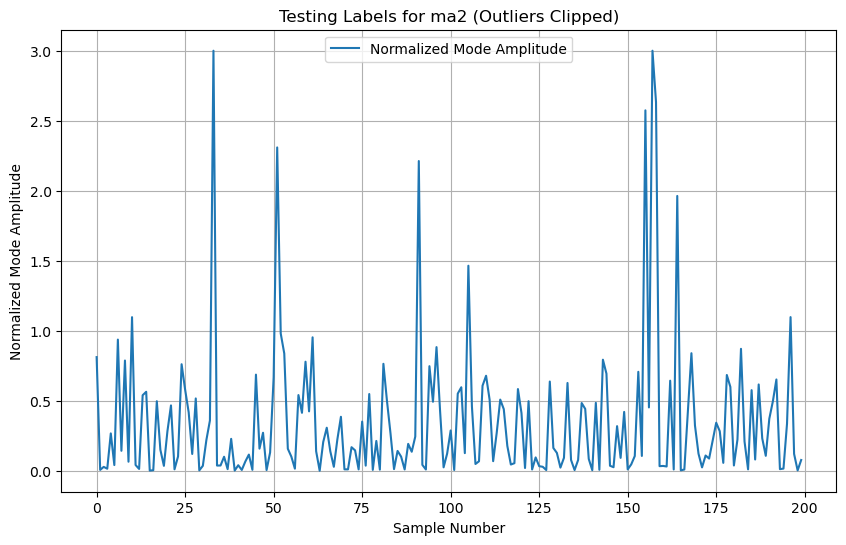

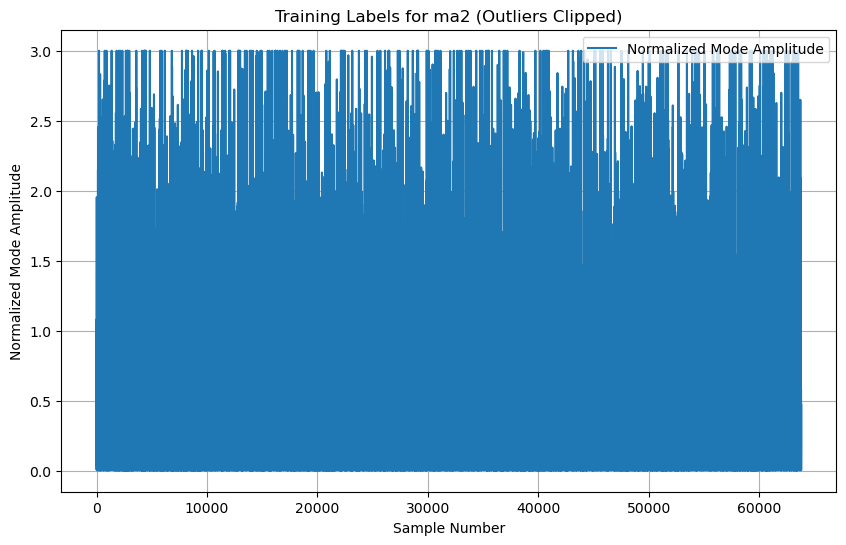

In [8]:
# Prepare data for HBT prediction model
target_data = hbt_dataType  # Using mode 2 amplitude as target
training_data = cut_training_data_2D

# Normalization factors
camera_norm = 1  # Camera data already normalized by max_pixel_value
# Compute ma_norm using 90th percentile to handle outliers
raw_target_vector = []
for i in range(len(valid_shots)):
    shot = valid_shots[i]
    if shot == RESERVED_SHOT:
        continue
    for j in range(len(target_data[i])):
        raw_target_vector.append(target_data[i][j])

raw_target_vector = np.asarray(raw_target_vector, dtype=np.float32)[:, 0]
percentile_cutoff = np.percentile(np.abs(raw_target_vector), OUTLIER_CUTOFF) #99%
ma_norm = percentile_cutoff if percentile_cutoff > 0 else 1.0  # Use 99th percentile for normalization
outlier_threshold = 3 * ma_norm  # Define outliers as values > 3 * normalization factor
outliers = np.abs(raw_target_vector) > outlier_threshold
print(f"Normalization factor ({OUTLIER_CUTOFF} percentile): {ma_norm:.2f}")
print(f"Number of outliers (|value| > {outlier_threshold:.2f}): {np.sum(outliers)}")

# Clip outliers for normalization
raw_target_vector = np.clip(raw_target_vector, -outlier_threshold, outlier_threshold)

# Reshape the training data and labels, excluding RESERVED_SHOT
target_vector = []
training_vector = []
for i in range(len(valid_shots)):
    shot = valid_shots[i]
    if shot == RESERVED_SHOT:
        continue
    for j in range(len(target_data[i])):
        target_vector.append(target_data[i][j])
        training_vector.append(training_data[i][j])

# Shuffle the data
random.seed(123)
zip_list = list(zip(target_vector, training_vector))
random.shuffle(zip_list)
target_vector, training_vector = zip(*zip_list)

# Convert to numpy arrays and normalize with clipping
target_vector = np.asarray(target_vector, dtype=np.float32)[:, 0]
target_vector = np.clip(target_vector, -outlier_threshold, outlier_threshold) / ma_norm
training_vector = np.asarray(training_vector, dtype=np.float32).reshape(-1, 32, 32, 1)

# Split into training and testing sets
test_size = 200
testing_inputs = training_vector[-test_size:]
testing_labels = target_vector[-test_size:]
training_vector = training_vector[:-test_size]
target_vector = target_vector[:-test_size]

# Save normalization info to a per-run file
normalization_filename = f"normalization_{notebook_type}_state_{state}.npz"
np.savez(normalization_filename,
         ma_norm=ma_norm,
         outlier_threshold=outlier_threshold,
         selected_data_type=selected_data_type)
print(f"Saved normalization info to {normalization_filename}")

print('Training shape:', training_vector.shape, 'Target shape:', target_vector.shape)
print('Testing shape:', testing_inputs.shape, 'Testing label shape:', testing_labels.shape)

# Plot testing labels
plt.figure(figsize=(10, 6))
plt.plot(testing_labels, label='Normalized Mode Amplitude')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'Testing Labels for {selected_data_type} (Outliers Clipped)')
plt.grid(True)
plt.legend()
plt.show()

# Plot training labels
plt.figure(figsize=(10, 6))
plt.plot(target_vector, label='Normalized Mode Amplitude')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'Training Labels for {selected_data_type} (Outliers Clipped)')
plt.grid(True)
plt.legend()
plt.show()

In [9]:
import ast

# Define model architecture
num_conv2d_layers = NUM_CONV2D_LAYERS #2
num_dense_layers = NUM_DENSE_LAYERS #1

conv2d_neurons = CONV2D_NEURONS #[16, 16]
conv2d_size = CONV2D_SIZE #[(8, 8), (8, 8)]
dense_layer_neurons = DENSE_LAYER_NEURONS #[10]
max_pooling_size = MAX_POOLING_SIZE #(4, 4)
activation_func = ACTIVATION_FUNC # 'relu'
loss_func = LOSS_FUNC #'mean_squared_error'
optimizer_func = OPTIMIZER_FUNC #'adam'

# Reinterpret conv2d_size to handle various input formats
conv2d_size = [
    tuple(int(x) for x in ast.literal_eval(size) if isinstance(x, (int, float)))
    if isinstance(size, str) else tuple(int(x) for x in size)
    for size in conv2d_size
]
# Reinterpret max_pooling_size to handle various input formats
max_pooling_size = (
    tuple(int(x) for x in ast.literal_eval(max_pooling_size) if isinstance(x, (int, float)))
    if isinstance(max_pooling_size, str) else tuple(int(x) for x in max_pooling_size)
)
# Create the model
william_model = tf.keras.models.Sequential()

# Add input layer
william_model.add(tf.keras.layers.InputLayer(shape=(32, 32, 1)))

# Add Conv2D layers
for i in range(num_conv2d_layers):
    william_model.add(tf.keras.layers.Conv2D(conv2d_neurons[i], conv2d_size[i], 1, activation=activation_func))
    william_model.add(tf.keras.layers.MaxPooling2D(max_pooling_size, 1))

# Flatten the output
william_model.add(tf.keras.layers.Flatten())

# Add dense layers
for i in range(num_dense_layers):
    william_model.add(tf.keras.layers.Dense(dense_layer_neurons[i], activation=activation_func))

# Output layer
william_model.add(tf.keras.layers.Dense(1))

# Compile the model
william_model.compile(optimizer=optimizer_func, loss=loss_func)

# Display model summary
william_model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 26, 26, 64)     │         3,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 16, 16, 32)     │       131,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 13, 13, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 5408)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │       173,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 309,537 (1.18 MB)

 Trainable params: 309,537 (1.18 MB)

 Non-trainable params: 0 (0.00 B)

In [10]:
# Train the model
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=20)
Model = william_model
history = Model.fit(training_vector, target_vector,
                       epochs=EPOCH_NUM,
                       validation_split=VALIDATION_SPLIT,
                       verbose=1,
                       callbacks=[early_stop])

Epoch 1/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 7:29 266ms/step - loss: 0.0855

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.3433  

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.3530

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.3489

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3363

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3254

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3178

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3126

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3066

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.3034

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.3011

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2988

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2958

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2932

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2908

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2888

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2867

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2844

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2823

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2802

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2783

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2764

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2744

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2725

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2708

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2690

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2673

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2656

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2639

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2623

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2608

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2594

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2580

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2565

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2550

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2537

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2524

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2512

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2502

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2492

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2484

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2476

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2468

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2460

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2452

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2444

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2436

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2429

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2422

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2416

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2410

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2404

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2399

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2393

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2387

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2382

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2377

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2372

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2366

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2361

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2356

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2350

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2345

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2340

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2336

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2331

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2327

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2323

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2319

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2315

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2310

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2306

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2302

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2298

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2294

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2290

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2286

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2283

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2280

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2277

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2274

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2271

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2269

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2266

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2263

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2261

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2258

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2255

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2252

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2250

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2248

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2245

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2243

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2241

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2238

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2236

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2234

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2232

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2230

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2228

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2226

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2224

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2221

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2219

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2217

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2215

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2213

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2211

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2209

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2207

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2205

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2203

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2201

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2199

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2198

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2196

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2194

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2192

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2190

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2188

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2186

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2184

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2183

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2181

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2179

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2177

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2175

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2174

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2172

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2170

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2168

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2166

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2165

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2163

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2161

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2159

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2157

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2155

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2154

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2152

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2150

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2149

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2147

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2145

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2144

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2142

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2141

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2139

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2138

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2137

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2136

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2134

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2133

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2132

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2131

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2129

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2128

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2127

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2125

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2124

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2123

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2122

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2120

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2119

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2118

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2117

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2116

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2114

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2113

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2112

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2111

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2110

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2109

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2107

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2106

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2105

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2104

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2103

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2102

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2101

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2100

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2099

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2098

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2097

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2096

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2095

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2094

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2093

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2092

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2090

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2089

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2088

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2087

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2086

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2085

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2084

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2082

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2081

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2080

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2079

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2078

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2077

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2076

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2074

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2073

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2072

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2071

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2070

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2069

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2068

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2066

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2065

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2064

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2063

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2062

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2061

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2060

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2059

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2058

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2057

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2056

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2055

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2054

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2052

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2051

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2050

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2049

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2048

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2047

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2046

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2045

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2044

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2043

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2042

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2041

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2040

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2039

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2037

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2036

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2035

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2034

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2033

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2032

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2031

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2030

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2029

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2028

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2027

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2026

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2025

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2024

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2023

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2022

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2021

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2020

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2019

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2018

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2017

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2016

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2015

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2014

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2014

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2013

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2012

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2011

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2010

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2009

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2008

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2007

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2006

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2005

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2004

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2003

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2002

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2001

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2000

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1999

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1998

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1998

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1997

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1996

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1995

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1994

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1993

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1992

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1991

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1990

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1989

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1989

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1988

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1987

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1986

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1985

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1984

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1983

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1982

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1981

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1980

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1980

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1979

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1978

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1977

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1976

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1975

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1975

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1974

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1973

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1972

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1971

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1970

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1970

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1969

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1968

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1967

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1966

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1966

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1965

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1964

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1963

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1962

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1962

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1961

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1960

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1960

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1959

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1958

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1957

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1957

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1956

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1955

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1954

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1954

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1953

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1952

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1952

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1951

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1950

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1949

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1949

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1948

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1947

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1947

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1946

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1945

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1944

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1944

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1943

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1942

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1942

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1941

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1940

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1940

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1939

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1938

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1938

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1937

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1936

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1936

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1935

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1934

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1934

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1933

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1932

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1932

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1931

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1930

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1930

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1929

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1929

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1928

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1927

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1927

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1926

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1925

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1925

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1924

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1924

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1923

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1923

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1922

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1921

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1921

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1920

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1920

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1919

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1918

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1918

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1917

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1917

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1916

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1915

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1915

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1914

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1914

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1913

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1912

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1912

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1911

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1911

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1910

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1910

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1909

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1908

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1908

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1907

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1907

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1906

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1906

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1905

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1905

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1904

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1903

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1903

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1902

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1902

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1901

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1901

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1900

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1900

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1899

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1899

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1898

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1897

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1897

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1896

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1896

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1895

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1895

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1894

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1894

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1893

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1893

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1892

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1892

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1891

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1891

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1890

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1890

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1889

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1889

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1888

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1888

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1887

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1887

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1886

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1886

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1885

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1885

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1884

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1884

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1883

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1883

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1882

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1882

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1882

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1881

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1881

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1880

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1880

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1879

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1879

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1878

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1878

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1877

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1877

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1876

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1876

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1875

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1875

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1874

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1874

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1873

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1873

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1873

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1872

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1872

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1871

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1871

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1870

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1870

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1869

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1869

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1868

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1868

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1868

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1867

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1867

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1866

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1866

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1865

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1865

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1864

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1864

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1864

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1863

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1863

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1862

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1862

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1861

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1861

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1860

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1860

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1860

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1859

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1859

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1858

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1858

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1857

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1857

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1857

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1856

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1856

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1855

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1855

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1855

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1854

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1854

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1853

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1853

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1853

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1852

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1852

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1851

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1851

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1850

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1850

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1850

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1849

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1849

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1848

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1848

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1848

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1847

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1847

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1846

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1846

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1846

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1845

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1845

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1844

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1844

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1844

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1843

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1843

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1843

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1842

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1842

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1841

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1841

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1841

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1840

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1840

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1839

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1839

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1839

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1838

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1838

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1837

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1837

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1837

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1836

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1836

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1836

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1835

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1835

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1834

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1834

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1834

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1833

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1833

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1833

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1832

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1832

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1831

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1831

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1831

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1830

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1830

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1830

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1829

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1829

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1828

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1828

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1828

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1827

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1827

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1827

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1826

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1826

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1825

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1825

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1825

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1824

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1824

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1824

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1823

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1823

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1823

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1822

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1822

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1822

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1821

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1821

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1820

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1820

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1820

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1819

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1819

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1819

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1818

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1818

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1818

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1817

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1817

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1817

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1816

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1816

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1815

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1815

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1815

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1814

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1814

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1814

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1813

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1813

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1813

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1812

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1812

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1812

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1811

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1811

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1811

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1810

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1810

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1810

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1809

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1809

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1809

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1808

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1808

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1808

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1807

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1807

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1807

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1806

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1806

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1806

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1805

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1805

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1805

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1804

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1804

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1804

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1803

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1803

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1803

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1803

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1802

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1802

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1802

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1801

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1801

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1801

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1800

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1800

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1800

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1800

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1799

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1799

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1799

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1798

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1798

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1798

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1797

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1797

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1797

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1797

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1796 

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1796

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1796

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1795

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1795

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1795

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1794

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1794

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1794

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1794

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1793

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1793

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1793

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1792

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1792

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1792

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1792

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1791

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1791

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1791

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1790

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1790

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1790

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1790

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1789

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1789

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1789

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1788

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1788

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1788

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1788

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1787

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1787

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1787

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1786

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1786

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1786

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1786

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1785

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1785

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1785

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1785

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1784

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1784

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1784

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1783

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1783

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1783

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1783

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1782

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1782

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1782

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1782

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1781

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1781

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1781

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1780

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1780

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1780

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1780

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1779

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1779

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1779

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1779

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1778

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1778

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1778

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1778

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1777

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1777

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1777

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1777

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1776

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1776

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1776

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1776

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1775

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1775

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1775

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1775

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1774

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1774

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1774

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1774

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1773

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1773

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1773

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1773

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1772

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1772

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1772

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1772

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1771

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1771

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1771

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1771

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1770

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1770

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1770

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1770

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1769

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1769

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1769

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1769

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1768

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1768

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1768

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1768

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1767

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1767

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1767

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1767

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1766

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1766

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1766

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1766

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1765

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1765

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1765

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1765

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1764

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1764

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1764

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1764

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1763

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1763

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1763

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1763

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1762

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1762

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1762

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1762

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1761

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1761

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1761

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1761

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1760

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1760

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1760

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1760

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1759

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1759

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1759

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1759

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1758

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1758

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1758

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1758

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1757

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1757

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1757

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1757

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1757

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1756

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1756

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1756

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1756

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1755

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1755

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1755

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1755

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1754

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1754

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1754

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1754

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1754

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1753

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1753

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1753

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1753

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1752

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.1752 - val_loss: 0.1519


Epoch 2/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1515

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1143

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1120

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1158

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1173

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1171

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1178

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1179

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1185

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1200

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1219

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1231

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1238

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1246

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1251

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1255

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1257

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1262

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1266

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1268

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1269

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1272

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1275

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1278

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1280

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1285

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1289

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1293

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1297

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1299

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1302

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1306

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1308

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1312

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1316

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1320

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1325

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1330

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1334

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1338

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1342

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1345

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1348

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1351

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1353

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1355

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1357

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1360

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1362

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1364

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1366

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1367

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1369

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1370

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1371

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1373

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1374

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1375

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1377

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1378

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1380

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1382

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1383

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1385

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1387

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1388

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1389

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1391

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1392

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1393

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1394

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1395

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1397

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1398

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1399

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1400

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1402

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1403

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1404

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1405

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1407

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1408

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1409

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1410

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1411

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1412

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1413

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1414

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1415

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1416

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1417

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1417

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1418

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1418

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1419

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1419

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1420

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1421

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1422

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1423

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1423

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1424

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1424

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1425

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1426

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1426

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1427

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1428

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1429

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1429

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1430

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1431

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1432

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1432

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1433

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1433

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1434

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1434

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1435

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1435

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1436

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1436

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1436

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1437

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1437

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1438

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1438

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1438

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1439

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1439

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1440

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1440

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1441

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1441

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1441

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1442

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1443

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1443

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1444

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1444

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1445

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1445

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1446

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1446

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1447

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1447

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1448

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1448

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1449

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1449

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1450

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1451

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1451

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1452

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1452

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1453

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1453

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1454

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1454

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1454

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1455

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1455

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1456

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1456

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1456

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1457

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1457

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1458

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1458

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1458

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1459

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1459

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1459

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1460

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1460

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1460

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1460

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1461

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1461

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1461

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1462

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1462

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1462

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1463

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1463

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1463

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1463

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1464

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1464

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1464

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1465

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1465

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1465

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1466

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1466

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1466

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1466

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1467

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1467

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1467

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1467

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1467

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1468

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1468

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1468

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1468

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1469

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1469

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1469

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1469

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1469

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1469

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1470

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1470

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1470

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1470

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1470

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1470

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1471

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1471

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1471

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1471

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1471

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1471

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1471

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1471

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1471

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1471

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1471

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1471

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1472

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1472

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1472

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1472

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1472

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1472

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1472

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1472

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1472

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1472

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1472

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1472

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1472

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1472

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1472

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1472

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1472

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1472

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1472

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1472

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1473

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1473

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1473

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1473

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1473

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1473

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1473

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1473

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1473

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1473

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1473

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1473

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1473

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1473

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1473

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1473

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1473

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1473

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1473

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1473

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1473

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1473

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1473

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1473

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1473

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1473

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1473

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1473

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1473

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1473

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1473

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1472

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1472

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1472

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1472

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1472

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1472

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1472

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1472

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1472

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1472

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1472

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1472

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1472

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1472

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1472

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1471

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1471

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1471

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1471

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1471

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1471

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1471

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1471

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1471

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1471

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1471

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1471

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1471

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1471

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1471

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1471

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1471

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1471

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1470

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1470

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1470

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1470

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1470

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1470

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1470

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1470

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1470

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1470

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1470

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1470

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1470

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1470

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1470

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1470

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1470

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1470

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1470

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1470

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1470

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1470

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1470

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1470

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1470

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1470

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1470

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1470

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1470

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1470

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1470

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1470

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1470

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1470

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1470

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1470

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1470

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1470

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1470

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1470

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1469

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1469

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1469

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1469

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1469

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1469

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1469

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1469

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1469

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1469

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1469

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1469

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1469

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1469

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1469

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1469

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1469

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1469

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1469

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1469

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1469

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1469

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1469

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1469

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1469

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1469

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1468

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1468

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1468

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1468

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1468

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1468

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1468

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1468

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1468

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1468

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1468

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1468

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1468

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1468

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1468

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1468

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1468

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1468

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1468

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1468

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1467

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1467

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1467

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1467

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1467

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1467

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1467

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1467

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1467

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1467

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1467

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1467

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1467

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1467

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1467

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1467

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1467

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1466

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1466

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1466

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1466

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1466

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1466

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1466

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1466

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1466

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1466

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1466

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1466

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1466

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1466

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1466

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1466

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1466

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1465

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1465

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1465

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1465

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1465

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1465

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1465

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1465

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1465

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1465

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1465

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1465

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1465

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1465

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1464

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1464

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1464

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1464

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1464

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1464

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1464

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1464

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1464

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1464

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1464

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1463

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1463

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1463

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1463

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1463

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1463

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1463

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1463

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1463

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1463

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1462

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1462

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1462

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1462

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1462

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1462

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1462

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1462

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1462

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1462

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1461

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1461

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1461

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1461

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1461

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1461

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1461

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1461

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1461

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1461

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1460

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1460

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1460

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1460

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1460

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1460

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1460

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1460

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1460

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1459

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1459

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1459

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1459

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1459

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1459

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1459

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1459

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1459

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1459

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1459

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1458

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1458

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1458

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1458

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1458

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1458

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1458

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1458

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1458

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1458

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1458

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1458

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1457

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1457

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1457

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1457

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1457

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1457

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1457

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1457

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1457

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1457

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1457

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1456

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1456

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1456

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1456

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1456

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1456

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1456

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1456

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1456

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1456

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1455

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1455

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1455

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1455

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1455

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1455

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1455

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1455

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1455

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1455

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1455

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1454

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1454

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1454

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1454

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1454

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1454

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1454

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1454

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1454

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1454

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1453

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1453

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1453

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1453

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1453

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1453

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1453

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1453

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1453

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1452

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1452

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1452

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1452

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1452

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1452

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1452

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1452

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1452

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1452

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1451

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1451

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1451

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1451

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1451

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1451

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1451

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1451

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1451

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1450

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1450

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1450

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1450

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1450

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1450

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1450

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1450

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1450

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1450

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1449

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1449

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1449

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1449

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1449

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1449

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1449

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1449

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1449

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1449

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1449

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1448

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1448

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1448

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1448

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1448

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1448

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1448

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1448

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1448

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1448

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1448

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1447

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1447

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1447

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1447

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1447

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1447

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1447

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1447

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1447

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1447

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1446

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1446

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1446

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1446

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1446

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1446

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1446

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1446

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1446

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1446

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1446

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1445

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1445

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1445

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1445

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1445

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1445

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1445

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1445

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1445

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1445

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1445

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1445

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1444

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1444

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1444

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1444

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1444

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1444

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1444

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1444

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1444

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1444

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1444

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1444

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1444

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1443

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1443

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1443

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1443

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1443

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1443

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1443

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1443

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1443

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1443

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1443

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1443 

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1442

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1442

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1442

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1442

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1442

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1442

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1442

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1442

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1442

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1442

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1442

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1442

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1442

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1442

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1441

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1441

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1441

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1441

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1441

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1441

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1441

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1441

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1441

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1441

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1441

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1441

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1441

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1440

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1440

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1440

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1440

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1440

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1440

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1440

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1440

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1440

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1440

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1440

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1440

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1440

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1439

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1439

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1439

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1439

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1439

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1439

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1439

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1439

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1439

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1439

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1439

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1439

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1439

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1439

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1438

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1438

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1438

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1438

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1438

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1438

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1438

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1438

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1438

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1438

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1438

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1438

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1438

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1437

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1437

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1437

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1437

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1437

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1437

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1437

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1437

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1437

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1437

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1437

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1437

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1437

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1437

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1437

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1436

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1436

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1436

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1436

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1436

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1436

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1436

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1436

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1436

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1436

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1436

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1436

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1436

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1436

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1436

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1436

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1435

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1435

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1435

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1435

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1435

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1435

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1435

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1435

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1435

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1435

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1435

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1435

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1435

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1435

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1435

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1435

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1435

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1434

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1434

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1434

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1434

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1434

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1434

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1434

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1434

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1434

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1434

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1434

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1434

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1434

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1434

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1434

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1434

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1434

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1434

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1434

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1433

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1433

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1433

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1433

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1433

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1433

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1433

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1433

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1433

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1433

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1433

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1433

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1433

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1433

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1433

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1433

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1433

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1433

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1433

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1433

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1433

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1433

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1433

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1433

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1432

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1432

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1432

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1432

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1432

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1432

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1432

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1432

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1432

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.1432 - val_loss: 0.1317


Epoch 3/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.1122

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1083

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0972

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1000

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0997

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0992

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0975

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0968

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0957

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0958

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0965

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0985

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1003

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1029

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1061

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1093

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1122

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1145

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1163

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1179

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1195

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1209

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1222

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 31ms/step - loss: 0.1234

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 31ms/step - loss: 0.1244

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 31ms/step - loss: 0.1253

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 31ms/step - loss: 0.1261

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 31ms/step - loss: 0.1267

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.1273

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.1278

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1281

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1285

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.1288

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1292

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1294

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1297

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1300

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1302

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1305

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1308

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1310

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1312

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1314

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1316

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1317

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1319

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1319

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1320

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1321

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1322

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1323

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1324

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1326

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1327

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1328

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1330

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1331

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1333

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1334

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1335

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1336

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1337

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1339

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1340

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1342

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1343

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1344

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1346

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1347

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1348

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1349

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1350

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1351

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1352

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1353

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1354

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1355

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1355

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1356

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1356

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1357

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1357

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1357

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1357

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1357

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1358

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1358

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1358

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1358

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1358

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1358

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1358

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1358

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1357

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1357

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1357

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1357

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1357

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1356

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1356

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1355

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1355

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1355

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1354

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1354

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1353

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1353

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1353

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1352

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1352

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1352

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1352

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1351

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1351

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1351

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1351

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1350

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1350

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1350

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1350

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1349

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1349

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1349

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1349

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1348

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1348

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1348

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1348

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1347

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1347

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1347

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1346

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1346

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1346

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1346

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1346

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1345

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1345

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1345

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1345

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1345

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1344

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1344

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1344

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1344

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1343

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1343

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1343

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1343

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1343

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1343

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1342

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1342

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1342

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1342

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1342

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1342

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1342

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1342

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1342

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1342

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1343

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1343

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1343

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1343

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1343

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1343

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1343

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1343

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1343

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1344

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1344

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1344

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1344

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1344

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1344

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1344

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1344

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1345

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1345

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1345

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1345

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1345

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1345

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1345

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1345

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1345

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1346

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1346

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1346

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1346

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1346

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1346

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1346

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1346

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1346

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1346

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1346

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1346

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1346

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1346

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1347

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1347

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1347

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1347

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1347

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1347

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1347

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1347

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1347

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1347

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1347

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1347

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1347

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1347

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1347

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1347

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1347

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1347

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1347

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1347

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1347

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1347

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1347

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1347

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1347

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1347

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1347

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1347

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1347

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1347

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1347

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1347

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1347

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1347

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1346

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1346

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1346

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1346

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1346

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1346

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1346

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1346

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1346

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1346

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1346

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1346

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1345

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1345

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1345

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1345

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1345

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1345

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1345

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1345

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1345

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1345

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1345

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1344

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1344

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1344

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1344

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1344

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1344

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1344

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1344

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1344

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1344

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1344

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1344

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1344

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1344

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1344

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1343

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1343

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1343

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1343

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1343

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1343

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1343

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1343

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1343

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1343

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1343

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1343

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1342

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1342

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1342

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1342

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1342

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1342

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1342

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1342

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1342

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1342

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1342

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1342

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1342

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1342

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1342

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1342

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1342

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1342

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1342

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1342

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1342

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1342

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1342

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1342

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1342

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1342

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1342

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1342

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1342

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1341

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1341

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1341

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1341

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1341

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1341

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1341

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1341

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1341

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1341

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1341

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1341

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1341

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1341

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1341

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1341

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1341

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1341

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1341

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1341

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1341

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1341

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1341

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1341

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1341

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1341

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1341

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1341

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1341

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1341

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1341

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1341

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1341

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1341

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1341

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1341

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1341

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1341

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1341

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1341

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1341

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1341

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1341

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1341

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1341

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1341

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1341

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1341

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1341

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1341

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1341

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1341

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1341

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1341

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1341

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1341

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1341

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1341

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1341

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1341

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1341

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1341

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1341

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1341

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1341

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1341

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1341

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1341

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1341

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1341

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1342

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1342

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1342

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1342

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1342

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1342

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1342

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1342

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1342

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1341

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1341

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1341

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1341

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1341

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1341

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1341

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1341

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1341

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1341

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1341

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1341

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1341

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1341

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1341

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1341

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1341

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1341

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1341

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1341

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1341

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1341

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1341

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1341

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1341

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1341

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1341

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1341

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1341

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1341

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1341

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1341

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1341

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1341

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1341

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1341

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1341

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1341

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1341

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1341

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1341

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1341

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1341

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1341

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1341

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1341

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1341

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1341

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1341

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1341

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1341

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1341

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1341

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1341

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1341

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1341

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1340

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1340

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1340

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1340

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1340

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1340

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1340

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1340

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1340

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1340

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1340

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1340

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1340

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1340

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1340

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1340

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1340

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1340

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1340

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1340

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1340

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1340

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1340

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1340

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1340

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1340

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1340

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1340

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1340

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1340

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1340

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1340

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1340

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1340

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1340

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1340

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1340

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1340

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1340

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1340

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1340

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1340

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1340

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1340

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1340

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1340

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1340

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1340

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1340

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1340

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1340

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1340

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1340

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1340

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1340

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1340

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1340

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1340

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1340

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1340

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1340

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1340

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1340

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1340

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1340

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1340

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1340

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1340

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1340

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1340

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1340

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1340

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1340

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1340

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1340

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1340

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1340

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1341

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1341

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1341

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1341

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1341

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1341

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1341

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1341

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1341

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1341

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1341

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1341

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1341

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1341

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1341

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1341

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1341

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1341

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1341

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1341

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1341

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1341

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1341

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1341

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1341

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1341

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1341

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1341

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1342

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1342

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1342

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1342

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1342

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1342

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1342

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1342

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1342

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1342

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1342

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1342

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1342

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1342

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1342

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1342

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1342

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1342

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1342

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1342

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1342

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1342

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1342

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1342

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1342

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1342

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1342

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1342

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1342

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1342

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1342

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1342

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1342

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1342

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1342

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1342

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1342

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1342

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1342

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1342

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1342

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1342

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1343

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1343

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1343

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1343

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1343

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1343

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1343

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1343

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1343

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1343

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1343

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1343

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1343

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1343

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1343

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1343

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1343

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1343

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1343

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1343

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1343

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1343

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1343

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1343

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1343

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1343

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1343

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1343

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1343

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1343

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1343

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1343

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1343

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1343

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1343

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1343

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1343

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1343

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1343

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1343

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1344

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1344

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1344

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1344

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1344

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1344

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1344

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1344

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1344

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1344

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1344

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1344

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1344

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1344

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1344

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1344

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1344

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1344

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1344

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1344

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1344

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1344

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1344

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1344

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1344

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1344

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1344

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1344

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1344

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1344

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1344

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1344

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1345

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1345

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1345

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1345

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1345

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1345

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1345

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1345

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1345

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1345

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1345

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1345

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1345

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1345

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1345

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1345

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1345

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1345

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1345 

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1345

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1345

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1345

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1345

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1345

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.1345

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.1345

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.1345

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.1345

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.1345

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.1346

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.1346

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.1346

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.1346

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.1346

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.1346

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.1346

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.1346

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.1346

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.1346

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.1346

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.1346

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.1346

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.1346

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.1346

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.1346

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.1346

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.1346

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.1346

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.1346

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.1346

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.1346

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.1346

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.1346

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.1346

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.1346

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.1346

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.1346

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.1346

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.1346

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.1346

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.1346

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.1346

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.1346

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.1346

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.1346

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.1346

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.1346

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.1347

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.1347

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.1347

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.1347

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.1347

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.1347

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.1347

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.1347

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.1347

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.1347

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.1347

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.1347

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.1347

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.1347

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.1347

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.1347

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.1347

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.1347

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.1347

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.1347

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.1347

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.1347

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.1347

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.1347

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.1347

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.1347

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.1347

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.1347

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.1347

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.1347

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.1347

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.1347

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.1347

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.1347

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.1347

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.1347

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.1347

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.1347

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.1347

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.1347

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.1347

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.1347

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.1347

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.1347

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.1347

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.1347

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.1347

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.1347

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.1348

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.1348

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.1348

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.1348

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.1348

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.1348

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.1348

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.1348

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.1348

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.1348

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.1348

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.1348

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.1348

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.1348

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.1348

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.1348

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.1348

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.1348

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.1348

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.1348

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.1348

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.1348

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.1348

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.1348

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.1348

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.1348

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.1348

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.1348

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.1348

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.1348

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.1348

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.1348

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.1348

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.1348

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.1348

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.1348

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.1348

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.1348

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.1348

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.1348

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.1348

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.1348

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.1348

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.1348

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.1348

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.1348

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.1348

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.1348

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.1348

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.1348

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.1348

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.1348

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1348

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1348

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1348

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1348

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1348

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1348

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1348

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1348

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1349

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1349

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1349

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1349

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1349

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1349

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1349

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1349

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1349 - val_loss: 0.1532


Epoch 4/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.1195

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1110 

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1048

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 31ms/step - loss: 0.1042

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 31ms/step - loss: 0.1117

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 31ms/step - loss: 0.1155

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 31ms/step - loss: 0.1176

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 31ms/step - loss: 0.1186

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 31ms/step - loss: 0.1193

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 31ms/step - loss: 0.1197

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 31ms/step - loss: 0.1207

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 31ms/step - loss: 0.1210

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 31ms/step - loss: 0.1211

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 31ms/step - loss: 0.1212

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 31ms/step - loss: 0.1211

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 31ms/step - loss: 0.1210

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1208

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1206

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1206

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1207

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1210

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1214

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1219

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1224

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1227

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1230

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1234

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1236

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1238

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1241

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 31ms/step - loss: 0.1245

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 31ms/step - loss: 0.1248

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.1251

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.1253

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.1256

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1259

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1262

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1265

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1267

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1269

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1271

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1271

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1272

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1272

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1272

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1273

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1274

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1275

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1277

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1278

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1280

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1281

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1283

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1285

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1286

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1288

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1289

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1290

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1291

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1292

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1293

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1294

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1295

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1295

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1296

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1297

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1297

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1298

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1298

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1298

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1298

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1298

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1298

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1298

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1298

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1298

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1297

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1297

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1297

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1297

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1297

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1296

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1296

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1296

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1296

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1296

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1295

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1295

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1295

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1295

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1294

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1294

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1294

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1293

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1293

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1293

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1292

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1292

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1291

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1291

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1290

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1290

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1289

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1289

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1288

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1288

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1288

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1288

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1287

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1287

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1287

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1286

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1286

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1286

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1286

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1286

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1286

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1286

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1286

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1286

 240/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1286

 242/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1286

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1286

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1286

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1286

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1286

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1286

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1286

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1286

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1286

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.1286

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.1285

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.1285

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.1285

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.1285

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.1285

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.1285

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.1284

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.1284

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.1284

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.1284

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.1284

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.1284

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.1284

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.1283

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.1283

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.1283

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.1283

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.1283

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.1283

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.1283

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.1283

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.1283

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.1283

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.1283

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.1283

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.1283

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.1282

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.1282

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.1282

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.1282

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.1282

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.1282

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.1282

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1282

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1282

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1282

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1281

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1281

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1281

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1281

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1281

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1281

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1281

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1280

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1280

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1280

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1280

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1280

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1280

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1280

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1280

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1280

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1279

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.1279

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.1279

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.1279

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.1279

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.1279

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.1279

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.1279

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.1279

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.1279

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.1279

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.1279

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.1279

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.1279

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.1279

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.1279

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.1279

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.1279

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.1279

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.1279

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.1279

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.1279

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.1279

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.1279

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.1279

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.1279

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.1279

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.1279

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.1279

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.1279

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.1279

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.1279

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.1279

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.1279

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.1279

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.1279

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.1279

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.1279

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.1279

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.1279

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.1280

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.1280

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.1280

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.1280

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.1280

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.1280

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.1280

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.1280

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.1280

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.1280

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.1281

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.1281

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.1281

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.1281

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.1281

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.1281

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.1281

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.1281

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1281

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1281

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1281

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1281

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1281

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1282

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1282

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1282

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1282

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1282

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1282

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1282

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1282

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1282

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1283

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1283

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1283

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1283

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1283

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1283

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1284

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1284

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1284

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1284

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1284

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1284

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1285

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1285

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1285

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1285

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1285

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1285

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1286

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1286

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1286

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1286

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1287

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1287

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1287

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1287

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1287

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1288

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1288

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1288

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1288

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1288

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1288

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1289

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1289

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1289

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1289

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1289

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1290

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1290

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1290

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1290

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1290

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1290

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1291

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1291

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1291

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1291

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1291

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1292

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1292

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1292

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1292

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1292

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1293

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1293

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1293

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1293

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1293

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1294

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1294

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1294

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1294

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1295

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1295

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1295

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1295

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1295

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1296

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1296

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1296

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1296

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1296

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1297

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1297

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1297

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1297

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1297

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1297

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1298

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1298

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1298

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1298

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1298

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1299

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1299

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1299

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1299

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1299

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1299

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1299

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1300

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1300

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1300

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1300

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1300

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1300

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1301

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1301

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1301

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1301

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1301

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1301

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1301

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1302

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1302

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1302

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1302

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1302

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1302

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1302

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1302

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1302

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1303

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1303

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1303

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1303

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1303

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1303

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1303

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1303

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1304

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1304

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1304

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1304

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1304

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1304

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1304

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1304

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1304

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1305

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1305

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1305

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1305

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1305

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1305

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1305

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1305

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1305

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1305

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1306

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1306

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1306

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1306

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1306

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1306

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1306

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1306

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1306

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1306

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1306

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1306

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1306

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1306

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1307

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1307

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1307

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1307

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1307

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1307

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1307

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1307

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1307

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1307

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1307

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1307

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1307

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1307

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1307

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1308

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1308

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1308

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1308

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1308

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1308

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1308

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1308

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1308

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1308

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1308

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1308

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1308

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1308

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1308

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1309

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1309

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1309

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1309

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1309

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1309

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1309

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1309

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1309

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1309

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1309

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1309

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1309

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1309

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1309

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1309

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1309

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1309

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1309

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1309

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1309

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1309

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1309

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1310

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1310

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1310

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1310

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1310

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1310

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1310

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1310

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1310

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1310

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1310

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1310

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.1310

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1310

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1310

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1310

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1310

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1310

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1310

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1310

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1310

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1310

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1310

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1311

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1311

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1311

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1311

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1311

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1311

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1311

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1311

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1311

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1311

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1311

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1311

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1311

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1311

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1311

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1311

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1311

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1311

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1311

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1311

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1311

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1311

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1311

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1311

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1311

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1311

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1311

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1311

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1311

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1311

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1312

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1312

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1312

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1312

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1312

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1312

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1312

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1312

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1312

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1312

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1312

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1312

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1312

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1312

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1312

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1312

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1312

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1312

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1312

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1312

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1312

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1312

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1312

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1312

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1312

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1312

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1312

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1312

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1312

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1312

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1312

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1312

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1312

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1312

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1312

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1312

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1312

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1312

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1312

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1312

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1312

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1312

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1312

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1312

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1312

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1313

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1313

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1313

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1313

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1313

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1313

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1313

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1313

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1313

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1313

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1313

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1313

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1313

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1313

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1313

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1313

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1313

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1313

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1313

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1313

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1313

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1313

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1313

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1313

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1313

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1313

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1313

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1313

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1313

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1313

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1313

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1313

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1313

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1313

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1313

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1313

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1313

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1313

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1313

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1313

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1313

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1313

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1314

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1314

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1314

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1314

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1314

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1314

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1314

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1314

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1314

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1314

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1314

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1314

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1314

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1314

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1314

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1314

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1314

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1314

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1314

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1314

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1314

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1314

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1314

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1314

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1314

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1314

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1314

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1314

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1314

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1314

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1314

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1314

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1314

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1314

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1314

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1314

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1314

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1314

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1314

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1314

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1314

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1314

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1314

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1314

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1314

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1314

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1315

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1315

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1315

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1315

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1315

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1315

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1315

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1315

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1315

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1315

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1315

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1315

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1315

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1315

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1315

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1315

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1315

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1315

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1315

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1315

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1315

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1315

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1315

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1315

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1315

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1315

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1315

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1315

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1315

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1315

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1315

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1315

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1315

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1315

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1315

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1315

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1315

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1315

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1315 

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1315

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1315

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1315

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1315

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1315

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1315

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1315

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1315

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1315

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1315

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1315

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1315

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1315

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1315

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1315

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1315

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1315

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1315

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1315

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1315

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1315

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1315

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1315

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1315

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1315

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1315

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1315

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1315

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1315

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1315

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1315

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1315

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1315

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1315

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1315

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1315

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1315

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1315

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1315

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1315

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1315

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1315

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1315

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1315

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1315

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1315

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1315

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1315

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1315

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1315

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1315

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1315

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1315

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1315

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1315

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1315

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1315

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1315

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1315

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1315

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1315

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1315

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1315

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1315

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1315

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1315

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1315

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1315

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1315

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1315

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1315

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1315

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1315

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1315

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1315

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1315

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1315

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1315

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1315

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1315

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1315

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1315

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1315

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1315

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1315

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1315

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1315

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1315

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1315

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1315

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1315

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1315

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1315

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1315

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1315

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1315

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1315

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1315

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1315

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1315

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1315

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1315

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1315

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1315

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1315

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1315

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1315

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1315

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1315

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1315

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1315

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1315

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1315

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1315

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1315

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1315

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1315

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1315

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1315

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1315

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1315

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1315

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1315

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1315

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1315

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1315

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1315

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1315

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1315

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1315

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1315

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1315

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1315

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1315

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1315

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1315

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1315

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1315

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1315

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1315

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1315

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1315

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1315

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1315

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1315

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1315

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1315

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1315

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1315

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1315

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1315

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1315

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1315

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1315

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1315

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1315

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1315

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1315

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1315

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1315

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1315

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1315

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1315

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1315

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.1315 - val_loss: 0.1272


Epoch 5/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.2607

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1975 

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1918

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1840

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1768

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1714

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1679

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1636

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1601

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1571

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1546

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1523

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1505

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1493

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1483

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1470

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1458

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1447

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1441

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1435

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1433

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1432

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1430

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1427

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1426

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1425

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1425

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1424

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1423

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1422

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1422

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1422

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1422

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1422

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1423

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1423

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1423

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1422

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1422

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1423

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1423

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1424

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1424

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1425

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1425

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1425

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1426

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1426

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1425

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1425

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1425

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1425

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1425

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1424

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1424

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1423

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1423

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1423

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1422

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1421

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1421

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1420

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1419

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1419

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1418

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1418

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1418

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1418

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1417

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1417

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1416

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1416

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1416

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1415

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1415

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1414

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1413

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1413

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1412

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1412

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1411

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1411

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1410

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1410

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1409

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1409

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1409

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1409

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1408

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1408

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1408

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1408

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1408

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1408

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1408

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1408

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1408

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1407

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1407

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1407

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1407

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1406

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1406

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1406

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1405

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1405

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1404

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1404

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1403

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1403

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1402

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1401

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1401

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1400

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1399

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1399

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1398

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1397

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1397

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1396

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1396

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1395

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1394

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1394

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1393

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1393

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1392

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1391

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1391

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1390

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1390

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1389

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1389

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1388

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1387

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1387

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1387

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1386

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1386

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1385

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1385

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1384

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1384

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1383

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1383

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1382

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1382

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1381

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1381

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1380

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1380

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1379

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1379

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1378

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1378

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1377

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1377

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1376

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1375

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1375

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1374

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1374

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1374

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1373

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1373

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1372

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1372

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1371

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1371

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1370

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1370

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1369

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1369

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1368

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1368

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1367

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1367

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1366

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1366

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1366

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1365

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1365

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1365

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1365

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1364

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1364

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1364

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1363

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1363

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1363

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1362

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1362

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1362

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1362

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1361

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1361

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1361

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1361

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1360

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1360

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1360

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1360

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1359

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1359

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1359

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1359

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1359

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1358

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1358

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1358

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1358

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1357

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1357

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1357

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1357

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1356

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1356

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1356

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1355

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1355

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1355

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1355

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1354

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1354

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1354

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1354

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1354

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1353

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1353

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1353

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1353

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1353

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1352

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1352

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1352

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1352

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1352

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1352

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1352

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1351

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1351

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1351

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1351

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1351

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1351

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1351

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1351

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1350

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1350

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1350

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1350

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1350

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1350

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1350

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1350

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1349

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1349

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1349

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1349

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1349

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1349

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1349

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1349

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1349

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1348

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1348

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1348

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1348

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1348

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1348

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1348

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1348

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1347

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1347

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1347

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1347

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1347

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1347

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1347

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1347

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1347

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1347

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1346

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1346

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1346

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1346

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1346

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1346

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1346

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1346

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1346

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1346

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1345

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1345

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1345

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1345

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1345

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1345

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1345

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1345

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1344

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1344

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1344

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1344

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1344

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1344

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1344

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1344

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1343

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1343

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1343

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1343

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1343

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1343

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1343

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1342

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1342

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1342

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1342

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1342

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1342

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1341

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1341

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1341

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1341

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1341

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1341

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1341

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1340

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1340

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1340

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1340

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1340

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1340

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1339

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1339

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1339

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1339

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1339

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1339

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1338

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1338

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1338

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1338

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1338

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1337

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1337

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1337

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1337

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1337

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1337

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1337

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1336

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1336

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1336

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1336

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1336

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1336

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1335

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1335

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1335

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1335

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1335

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1335

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1335

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1334

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1334

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1334

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1334

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1334

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1334

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1334

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1333

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1333

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1333

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1333

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1333

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1333

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1333

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1333

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1332

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1332

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1332

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1332

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1332

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1332

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1332

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1332

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1331

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1331

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1331

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1331

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1331

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1331

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1331

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1330

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1330

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1330

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1330

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1330

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1330

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1330

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1330

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1329

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1329

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1329

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1329

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1329

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1329

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1329

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1329

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1328

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1328

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1328

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1328

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1328

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1328

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1328

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1328

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1327

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1327

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1327

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1327

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1327

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1327

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1327

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1326

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1326

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1326

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1326

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1326

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1326

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1326

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1326

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1325

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1325

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1325

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1325

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1325

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1325

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1325

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1325

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1325

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1325

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1324

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1324

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1324

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1324

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1324

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1324

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1324

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1324

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1324

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1324

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1323

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1323

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1323

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1323

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1323

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1323

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1323

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1323

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1323

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1323

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1323

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1322

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1322

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1322

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1322

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1322

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1322

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1322

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1322

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1322

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1322

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1321

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1321

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1321

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1321

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1321

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1321

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1321

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1321

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1321

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1321

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1321

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1320

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1320

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1320

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1320

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1320

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1320

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1320

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1320

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1320

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1320

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1319

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1319

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1319

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1319

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1319

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1319

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1319

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1319

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1319

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1319

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1318

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1318

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1318

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1318

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1318

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1318

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1318

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1318

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1318

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1318

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1318

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1317

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1317

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1317

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1317

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1317

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1317

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1317

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1317

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1317

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1317

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1317

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1317

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1316

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1316

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1316

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1316

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1316

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1316

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1316

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1316

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1316

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1316

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1316

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1316

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1315

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1315

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1315

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1315

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1315

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1315

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1315

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1315

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1315

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1315

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1315

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1314

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1314

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1314

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1314

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1314

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1314

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1314

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1314

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1314

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1314

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1314

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1314

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1313

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1313

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1313

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1313

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1313

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1313

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1313

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1313

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1313

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1313

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1313

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1313

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1313

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1313

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1312

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1312

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1312

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1312

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1312

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1312

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1312

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1312

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1312

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1312

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1312

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1312

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1312

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1311

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1311

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1311

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1311

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1311

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1311

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1311

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1311

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1311

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1311

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1311

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1311

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1311

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1310

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1310

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1310

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1310

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1310

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1310

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1310

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1310

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1310

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1310

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1310

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1310

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1310

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1309

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1309

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1309

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1309

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1309

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1309

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1309

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1309

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1309

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1309

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1309

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1309

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1309

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1309

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1308

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1308

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1308

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1308

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1308

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1308

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1308

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1308

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1308

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1308

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1308

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1308

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1308

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1308

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1308

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1307

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1307

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1307

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1307

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1307

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1307

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1307

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1307

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1307

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1307

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1307

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1307

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1307

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1307

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1307

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1307

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1306

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1306

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1306

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1306

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1306

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1306

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1306

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1306

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1306 

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1306

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1306

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1306

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1306

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1306

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1306

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1306

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1306

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1305

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1305

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1305

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1305

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1305

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1305

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1305

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1305

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1305

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1305

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1305

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1305

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1305

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1305

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1305

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1305

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1304

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1304

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1304

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1304

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1304

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1304

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1304

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1304

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1304

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1304

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1304

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1304

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1304

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1304

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1304

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1304

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1304

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1304

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1303

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1303

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1303

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1303

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1303

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1303

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1303

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1303

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1303

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1303

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1303

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1303

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1303

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1303

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1303

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1303

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1303

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1303

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1303

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1302

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1302

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1302

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1302

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1302

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1302

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1302

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1302

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1302

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1302

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1302

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1302

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1302

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1302

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1302

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1302

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1302

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1302

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1301

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1301

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1301

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1301

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1301

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1301

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1301

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1301

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1301

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1301

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1301

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1301

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1301

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1301

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1301

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1301

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1301

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1301

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1301

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1301

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1301

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1300

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1300

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1300

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1300

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1300

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1300

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1300

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1300

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1300

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1300

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1300

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1300

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1300

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1300

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1300

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1300

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1300

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1300

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1300

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1300

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1300

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1300

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1300

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1300

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1299

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1299

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1299

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1299

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1299

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1299

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1299

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1299

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1299

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1299

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1299

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1299

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1299

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1299

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1299

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1299

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1299

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1299

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1299

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1299

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1299

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1299

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1299

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1299

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1299

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1299

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1298

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1298

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1298

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1298

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1298

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1298

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1298

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1298

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1298

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1298

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1298

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1298

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1298

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1298

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1298

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1298

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1298

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1298

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1298

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1298

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1298

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1298

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1298

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1298

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1298

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1298

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1298 - val_loss: 0.1226


Epoch 6/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.0424

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0777

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1025

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1118

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1164

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1162

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1155

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1151

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1169

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1189

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1201

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1215

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1225

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1234

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1245

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1253

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1259

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1264

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1267

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1269

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1271

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1272

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1271

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1270

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1268

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1267

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1266

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1265

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1265

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1264

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1264

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1262

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1260

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1258

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1256

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1254

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1253

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1252

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1251

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1250

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1249

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1248

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1247

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1246

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1246

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1245

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1245

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1245

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1244

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1243

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1242

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1240

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1239

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1238

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1238

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1237

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1236

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1236

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1236

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1236

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1236

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1236

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1236

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1236

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1235

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1235

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1234

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1234

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1234

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1234

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1234

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1234

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1233

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1233

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1233

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1233

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1232

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1232

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1232

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1231

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1231

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1231

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1231

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1231

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1231

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1231

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1231

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1231

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1231

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1231

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1231

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1231

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1231

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1231

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1231

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1231

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1231

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1231

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1232

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1232

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1232

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1232

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1233

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1233

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1233

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1234

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1234

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1235

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1235

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1235

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1236

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1236

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1236

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1236

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1237

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1237

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1237

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1237

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1238

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1238

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1238

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1238

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1239

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1239

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1239

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1239

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1240

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1240

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1240

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1240

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1240

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1240

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1240

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1240

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1240

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1240

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1240

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1240

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1240

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1240

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1240

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1240

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1240

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1240

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1240

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1240

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1239

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1239

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1239

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1239

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1239

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1239

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1239

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1239

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1238

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1238

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1238

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1238

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1238

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1238

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1237

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1237

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1237

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1237

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1237

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1237

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1236

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1236

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1236

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1236

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1236

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1236

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1236

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1236

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1236

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1236

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1236

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1236

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1236

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1236

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1236

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1236

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1236

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1236

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1235

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1235

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1235

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1235

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1235

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1235

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1235

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1235

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1235

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1235

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1235

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1235

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1235

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1235

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1235

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1235

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1235

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1235

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1235

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1235

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1235

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1235

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1235

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1235

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1235

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1235

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1235

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1235

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1235

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1235

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1235

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1235

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1235

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1235

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1235

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1235

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1235

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1235

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1235

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1235

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1235

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1235

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1235

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1235

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1235

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1235

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1235

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1235

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1235

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1235

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1235

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1235

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1235

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1235

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1235

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1235

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1235

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1235

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1235

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1235

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1235

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1235

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1235

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1235

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1235

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1235

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1235

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1235

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1235

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1235

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1235

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1235

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1235

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1234

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1234

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1234

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1234

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1234

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1234

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1234

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1234

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1234

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1234

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1234

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1234

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1234

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1234

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1234

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1234

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1234

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1234

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1234

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1234

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1234

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1234

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1234

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1234

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1233

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1233

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1233

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1233

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1233

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1233

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1233

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1233

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1233

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1233

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1233

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1233

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1232

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1232

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1232

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1232

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1232

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1232

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1232

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1232

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1232

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1232

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1232

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1232

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1232

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1232

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1232

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1232

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1232

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1232

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1232

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1232

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1232

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1232

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1231

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1231

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1231

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1231

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1231

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1231

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1231

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1231

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1231

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1231

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1231

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1231

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1231

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1231

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1231

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1231

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1231

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1231

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1231

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1231

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1231

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1231

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1231

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1231

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1231

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1231

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1231

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1231

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1231

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1231

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1231

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1231

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1231

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1231

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1231

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1231

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1231

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1231

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1231

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1231

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1232

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1232

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1232

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1232

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1232

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1232

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1232

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1232

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1232

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1232

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1232

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1232

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1232

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1232

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1232

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1232

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1232

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1232

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1232

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1233

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1233

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1233

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1233

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1233

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1233

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1233

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1233

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1233

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1233

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1233

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1233

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1233

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1234

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1234

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1234

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1234

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1234

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1234

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1234

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1234

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1234

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1234

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1234

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1234

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1234

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1235

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1235

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1235

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1235

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1235

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1235

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1235

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1235

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1235

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1235

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1235

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1235

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1236

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1236

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1236

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1236

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1236

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1236

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1236

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1236

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1236

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1236

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1236

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1237

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1237

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1237

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1237

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1237

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1237

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1237

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1237

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1237

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1237

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1237

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1237

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1238

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1238

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1238

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1238

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1238

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1238

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1238

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1238

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1238

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1238

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1238

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1238

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1238

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1239

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1239

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1239

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1239

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1239

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1239

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1239

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1239

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1239

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1239

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1239

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1239

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1239

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1240

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1240

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1240

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1240

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1240

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1240

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1240

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1240

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1240

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1240

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1240

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1240

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1241

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1241

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1241

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1241

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1241

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1241

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1241

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1241

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1241

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1241

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1241

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1241

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1241

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1242

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1242

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1242

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1242

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1242

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1242

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1242

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1242

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1242

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1242

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1242

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1242

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1242

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1242

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1242

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1243

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1243

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1243

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1243

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1243

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1243

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1243

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1243

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1243

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1243

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1243

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1243

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1244

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1244

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1244

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1244

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1244

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1244

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1244

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1244

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1244

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1244

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1244

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1244

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1244

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1245

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1245

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1245

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1245

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1245

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1245

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1245

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1245

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1245

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1245

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1245

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1245

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1245

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1245

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1246

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1246

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1246

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1246

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1246

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1246

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1246

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1246

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1246

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1246

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1246

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1246

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1246

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1246

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1246

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1246

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1247

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1247

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1247

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1247

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1247

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1247

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1247

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1247

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1247

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1247

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1247

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1247

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1247

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1247

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1247

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1247

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1247

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1247

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1248

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1248

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1248

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1248

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1248

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1248

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1248

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1248

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1248

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1248

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1248

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1248

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1248

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1248

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1248

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1248

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1249

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1249

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1249

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1249

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1249

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1249

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1249

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1249

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1249

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1249

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1249

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1249

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1249

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1249

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1249

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1249

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1249

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1249

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1249

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1250

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1250

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1250

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1250

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1250

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1250

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1250

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1250

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1250

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1250

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1250

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1250

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1250

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1250

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1250

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1250

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1250

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1250

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1250

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1250

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1250

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1250

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1250

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1250

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1250

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1250

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1250

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1251

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1251

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1251

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1251

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1251

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1251

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1251

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1251

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1251

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1251

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1251

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1251

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1251

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1251

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1251

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1251

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1251

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1251

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1251

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1251

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1251

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1251

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1251

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1251

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1251

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1251

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1251

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1252

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1252

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1252

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1252

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1252

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1252

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1252

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1252 

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1252

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1252

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1252

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1252

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1252

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1252

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1252

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1252

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1252

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1252

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1252

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1252

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1252

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1252

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1252

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1252

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1252

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1252

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1252

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1252

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1252

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1252

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1252

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1253

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1253

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1253

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1253

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1253

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1253

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1253

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1253

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1253

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1253

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1253

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1253

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1253

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1253

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1253

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1253

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1253

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1253

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1253

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1253

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1253

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1253

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1253

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1253

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1253

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1253

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1253

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1253

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1253

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1253

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1253

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1253

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1253

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1253

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1253

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1253

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1253

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1253

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1253

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1253

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1253

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1253

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1253

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1253

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1253

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1253

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1254

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1254

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1254

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1254

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1254

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1254

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1254

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1254

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1254

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1254

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1254

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1254

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1254

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1254

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1254

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1254

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1254

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1254

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1254

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1254

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1254

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1254

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1254

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1254

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1254

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1254

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1254

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1254

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1254

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1254

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1254

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1254

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1254

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1254

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1254

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1254

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1254

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1254

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1254

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1254

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1254

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1254

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1254

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1254

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1254

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1254

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1254

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1254

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1254

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1254

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1254

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1254

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1254

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1254

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1254

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1254

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1254

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1254

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1254

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1254

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1254

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1254

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1254

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1254

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1254

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1254

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1254

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1254

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1254

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1254

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1254

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1254

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1254

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1254

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1254

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1254

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1254

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1254

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1254

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1254

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1254

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1254

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1254

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1254

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1254

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1254

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1254

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1254

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1254

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1254

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1254

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1254

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1254

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1254

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1254

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1254

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1254

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1254

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1254

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1254

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1254

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1254

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1254

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1254

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1254

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1254

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1254

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1254 - val_loss: 0.1232


Epoch 7/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.1878

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1436

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1767

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1796

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1758

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1699

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1644

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1596

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1556

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1527

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1498

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1472

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1450

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1432

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1425

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1422

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1419

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1416

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1413

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1411

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1408

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1405

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1402

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1400

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1398

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1396

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1394

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1391

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1388

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1386

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1384

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1381

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1378

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1375

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1372

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1369

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1367

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1365

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1362

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1360

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1357

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1354

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1351

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1349

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1346

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1344

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1343

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1341

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1340

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1338

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1336

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1335

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1333

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1331

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1329

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1327

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1326

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1324

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1322

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1321

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1319

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1318

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1316

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1315

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1314

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1313

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1313

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1312

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1311

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1311

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1310

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1310

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1309

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1309

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1308

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1308

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1308

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1308

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1308

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1308

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1308

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1308

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1308

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1308

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1308

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1308

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1308

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1307

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1307

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1307

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1307

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1306

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1306

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1306

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1306

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1305

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1305

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1305

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1304

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1304

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1304

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1303

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1303

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1303

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1302

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1302

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1302

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1302

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1301

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1301

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1301

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1301

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1301

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1300

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1300

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1300

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1300

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1300

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1300

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1300

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1300

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1299

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1299

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1299

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1299

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1299

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1299

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1298

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1298

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1298

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1298

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1297

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1297

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1297

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1296

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1296

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1296

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1295

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1295

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1295

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1295

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1294

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1294

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1294

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1294

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1293

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1293

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1293

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1293

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1292

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1292

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1292

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1291

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1291

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1291

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1291

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1290

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1290

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1290

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1290

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1289

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1289

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1289

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1289

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1288

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1288

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1288

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1288

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1287

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1287

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1287

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1286

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1286

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1286

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1286

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1285

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1285

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1285

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1284

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1284

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1284

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1284

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1283

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1283

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1283

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1282

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1282

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1282

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1281

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1281

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1281

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1281

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1280

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1280

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1280

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1279

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1279

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1279

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1278

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1278

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1278

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1277

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1277

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1277

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1277

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1276

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1276

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1276

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1275

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1275

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1275

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1274

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1274

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1274

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1273

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1273

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1272

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1272

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1272

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1271

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1271

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1271

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1270

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1270

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1270

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1269

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.1269

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1269

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1268

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1268

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1268

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1267

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1267

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1267

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1266

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1266

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1266

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1265

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1265

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1265

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1265

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1264

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1264

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1264

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.1264

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1263

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1263

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1263

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1262

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1262

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1262

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1262

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1261

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1261

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1261

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1261

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1260

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1260

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1260

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1260

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1259

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.1259

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1259

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1259

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1259

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1258

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1258

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1258

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1258

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1258

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1257

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1257

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1257

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1257

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1257

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1256

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1256

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1256

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.1256

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1256

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1256

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1256

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1255

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1255

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1255

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1255

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1255

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1255

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1255

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1254

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1254

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1254

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1254

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1254

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1254

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1254

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1254

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.1254

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1253

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1253

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1253

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1253

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1253

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1253

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1253

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1253

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1253

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1253

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1253

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1253

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1252

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1252

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1252

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1252

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1252

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.1252

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1252

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1252

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1252

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1252

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1251

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1251

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1251

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1251

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1251

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1251

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1251

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1251

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1250

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1250

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1250

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1250

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1250

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1250

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1250

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.1250

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1250

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1250

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1249

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1249

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1249

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1249

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1249

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1249

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1249

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1249

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1249

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1248

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1248

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1248

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1248

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1248

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1248

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1248

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.1248

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1248

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1248

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1248

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1248

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1248

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1247

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1247

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1247

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1247

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1247

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1247

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1247

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1247

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1247

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1247

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1247

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.1247

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1246

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1246

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1246

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1246

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1246

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1246

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1246

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1246

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1246

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1246

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1246

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1246

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1246

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1245

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1245

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1245

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1245

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.1245

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1245

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1245

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1245

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1245

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1245

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1245

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1245

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1245

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1245

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1245

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1245

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1244

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1244

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1244

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1244

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1244

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.1244

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1244

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1244

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1244

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1244

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1244

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1244

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1244

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1244

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1244

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1244

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1244

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1243

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1243

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1243

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1243

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1243

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1243

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.1243

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1243

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1243

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1243

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1243

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1243

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1243

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1243

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1243

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1243

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1243

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1243

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1242

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1242

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1242

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1242

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1242

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.1242

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1242

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1242

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1242

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1242

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1242

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1242

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1242

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1242

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1242

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1242

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1242

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1242

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1242

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1242

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1242

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1242

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1242

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1242

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.1242

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1242

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1241

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1241

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1241

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1241

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1241

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1241

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1241

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1241

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1241

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1241

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1241

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1241

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1241

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1241

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1241

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.1241

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1241

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1241

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1241

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1241

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1241

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1241

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1241

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1241

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1240

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1240

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1240

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1240

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1240

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1240

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1240

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1240

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1240

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.1240

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1240

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1240

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1240

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1240

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1240

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1240

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1240

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1240

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1240

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1240

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1240

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1240

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1240

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1240

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1240

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1240

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.1240

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1240

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1240

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1240

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1240

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1240

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1240

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1240

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1240

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1240

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1240

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1240

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1240

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1240

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1240

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1240

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1240

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1240

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.1240

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1240

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1240

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1240

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1240

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1240

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1240

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1240

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1240

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1240

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1240

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1240

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1240

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1240

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1240

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1240

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1240

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.1240

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1240

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1240

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1240

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1240

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1240

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1240

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1240

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1240

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1240

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1240

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1240

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1240

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1240

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1240

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1240

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1240

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1240

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.1240

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1240

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1240

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1240

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1240

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1240

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1240

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1240

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1240

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1240

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1240

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1240

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1240

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1240

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1240

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1240

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1240

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.1240

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1240

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1240

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1240

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1240

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1240

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1240

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1240

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1240

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1240

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1240

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1240

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1240

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1240

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1240

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1240

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1240

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1240

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.1240

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1240

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1240

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1240

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1241

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1241

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1241

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1241

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1241

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1241

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1241

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1241

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1241

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1241

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1241

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1241

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1241

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1241

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1241

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1241

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1241

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1241

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1241

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1241

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1241

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1241

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1241

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1241

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1241

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1241

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1241

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1241

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1241

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1241

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1241

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1241

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.1241

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1241

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1241

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1241

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1241

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1241

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1241

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1241

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1241

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1241

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1241

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1241

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1241

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1241

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1241

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1241

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1241

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.1241

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1241

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1241

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1241

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1241

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1241

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1241

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1240

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1240

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1240

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1240

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1240

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1240

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1240

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1240

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1240

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1240

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1240

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.1240

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1240 

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1240

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1240

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1240

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1240

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1240

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1240

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1240

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1240

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1240

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1240

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1240

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1240

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1240

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1240

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1240

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.1240

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1240

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1240

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1240

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1240

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1240

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1240

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1240

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1240

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1240

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1240

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1240

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1240

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1240

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1240

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1240

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1240

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1240

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.1240

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1240

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1240

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1240

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1240

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1240

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1240

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1240

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1240

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1240

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1240

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1240

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1240

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1240

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1240

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1240

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1240

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.1240

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1240

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1240

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1240

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1240

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1240

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1240

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1240

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1240

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1240

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1240

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1240

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1240

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1240

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1240

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1240

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1240

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1240

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.1240

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1240

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1240

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1240

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1240

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1240

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1240

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1240

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1240

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1240

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1239

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1239

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1239

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1239

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1239

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1239

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1239

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1239

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.1239

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1239

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1239

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1239

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1239

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1239

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1239

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1239

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1239

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1239

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1239

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1239

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1239

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1239

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1239

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1239

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1239

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.1239

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1239

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1239

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1239

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1239

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1239

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1239

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1239

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1239

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1239

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1239

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1239

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1239

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1239

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1239

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1239

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1239

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1239

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.1239

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1239

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1239

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1239

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1238

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1238

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1238

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1238

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1238

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1238

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1238

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1238

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1238

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1238

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1238

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1238

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1238

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.1238

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1238

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1238

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1238

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1238

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1238

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1238

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1238

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1238

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1238

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1238

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1238

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1238

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1238

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1238

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1238

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1238

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1238

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.1238

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1238

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1238

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1238

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1238

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1238

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1238

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1238

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1238

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1238

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1238

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1238

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1238

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1238

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1237

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1237

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1237

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.1237

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1237 - val_loss: 0.1199


Epoch 8/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.0461

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0547

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0571

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0694

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.0768

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0832

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0906

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0951

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0974

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0991

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1006

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1015

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1025

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1033

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1042

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1049

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1056

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1061

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1068

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1076

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1085

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1092

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1099

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1105

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1111

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1117

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1123

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1129

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1135

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1139

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1143

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1146

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1148

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1151

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1152

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1154

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1155

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1156

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1156

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1157

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1157

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1157

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1159

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1160

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1162

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1163

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1164

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1165

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1167

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1168

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1168

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1169

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1169

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1170

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1170

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1170

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1170

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1171

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1171

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1172

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1173

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1173

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1173

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1174

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1175

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1176

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1177

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1177

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1177

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1178

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1178

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1178

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1178

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1178

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1178

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1178

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1178

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1178

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1178

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1178

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1178

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1178

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1179

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1179

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1179

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1180

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1180

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1180

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1180

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1180

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1181

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1181

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1181

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1182

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1182

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1182

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1183

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1183

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1183

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1184

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1184

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1185

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1185

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1185

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1186

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1186

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1186

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1187

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1187

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1187

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1188

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1188

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1188

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1188

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1189

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1189

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1189

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1189

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1190

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1190

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1190

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1190

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1191

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1191

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1191

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1192

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1192

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1192

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1193

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1193

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1194

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1194

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1194

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1195

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1195

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1195

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1196

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1196

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1196

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1196

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1197

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1197

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1197

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1197

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1198

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1198

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1198

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1198

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1198

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1199

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1199

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1199

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1199

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1199

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1200

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1200

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1200

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1200

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1200

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1201

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1201

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1201

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1201

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1201

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1201

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1201

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1201

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1201

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1202

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1202

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1202

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1202

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1202

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1202

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1202

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1202

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1202

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1202

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1202

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1202

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1202

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1202

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1202

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1202

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1202

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1202

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1203

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1203

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1203

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1203

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1203

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1203

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1203

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1203

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1203

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1203

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1203

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1203

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1203

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1203

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1203

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1203

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1203

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1203

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1203

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1203

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1203

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1203

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1203

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1203

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1204

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1204

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1204

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1204

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1204

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1204

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1204

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1204

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1204

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1204

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1204

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1204

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1204

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1204

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1204

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1204

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1204

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1204

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1204

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1205

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1205

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1205

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1205

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1205

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1205

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1205

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1205

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1205

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1205

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1205

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1205

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1205

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1205

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1205

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1205

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1205

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1205

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1205

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1206

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1206

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1206

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1206

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1206

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1206

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1206

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1206

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1206

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1206

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1206

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1206

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1206

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1206

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1206

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1206

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1206

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1206

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1206

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1207

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1207

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1207

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1207

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1207

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1207

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1207

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1207

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1207

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1207

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1207

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1207

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1207

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1207

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1207

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1207

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1207

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1207

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1207

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1207

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1207

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1207

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1207

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1207

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1207

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1207

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1207

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1207

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1208

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1208

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1208

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1208

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1208

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1208

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1208

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1208

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1208

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1208

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1208

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1208

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1209

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1209

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1209

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1209

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1209

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1209

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1209

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1209

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1209

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1209

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1210

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1210

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1210

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1210

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1210

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1210

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1210

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1210

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1210

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1210

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1211

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1211

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1211

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1211

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1211

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1211

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1211

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1211

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1211

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1211

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1211

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1212

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1212

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1212

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1212

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1212

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1212

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1212

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1212

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1212

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1212

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1212

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1212

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1213

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1213

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1213

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1213

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1213

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1213

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1213

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1213

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1213

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1213

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1213

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1213

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1213

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1213

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1213

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1214

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1214

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1214

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1214

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1214

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1214

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1214

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1214

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1214

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1214

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1214

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1214

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1214

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1214

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1214

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1214

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1214

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1214

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1214

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1214

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1214

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1215

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1215

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1215

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1215

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1215

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1215

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1215

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1215

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1215

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1215

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1215

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1215

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1215

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1215

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1215

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1215

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1215

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1216

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1216

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1216

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1216

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1216

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1216

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1216

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1216

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1216

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1216

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1216

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1216

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1216

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1216

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1217

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1217

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1217

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1217

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1217

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1217

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1217

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1217

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1217

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1217

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1217

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1217

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1217

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1217

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1217

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1217

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1218

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1218

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1218

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1218

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1218

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1218

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1218

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1218

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1218

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1218

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1218

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1218

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1218

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1218

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1218

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1218

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1219

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1219

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1219

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1219

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1219

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1219

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1219

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1219

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1219

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1219

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1219

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1219

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1219

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1219

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1219

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1219

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1220

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1220

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1220

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1220

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1220

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1220

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1220

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1220

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1220

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1220

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1220

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1220

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1220

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1220

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1220

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1220

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1220

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1220

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1220

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1220

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1220

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1220

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1220

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1220

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1221

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1221

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1221

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1221

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1221

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1221

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1221

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1221

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1221

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1221

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1221

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1221

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1221

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1221

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1221

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1221

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1221

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1221

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1221

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1221

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1221

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1221

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1221

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1221

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1221

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1221

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1221

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1221

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1221

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1221

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1221

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1221

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1221

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1221

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1221

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1221

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1221

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1221

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1221

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1221

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1221

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1221

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1221

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1221

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1221

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1221

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1221

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1221

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1221

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1221

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1221

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1221

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1221

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1221

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1221

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1221

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1221

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1221

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1221

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1221

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1221

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1221

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1221

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1221

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1221

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1221

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1221

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1221

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1221

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1221

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1221

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1221

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1221

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1221

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1221

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1221

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1221

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1221

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1221

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1221

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1221

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1221

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1221

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1221

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1221

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1221

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1221

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1221

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1221

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1221

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1221

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1221

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1221

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1221

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1222

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1222

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1222

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1222

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1222

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1222

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1222

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1222

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1222

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1222

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1222

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1222

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1222

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1222

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1222

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1222

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1222

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1222

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1222

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1222

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1222

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1222

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1222

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1222

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1222

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1222

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1222

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1222

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1222

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1222

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1222

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1222

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1222

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1222

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1222

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1222

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1222

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1222

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1222

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1222

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1222

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1222

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1222

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1222

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1222

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1222

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1222

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1222

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1222

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1222

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1222

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1222

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1222

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1222

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1222

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1222

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1222

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1222

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1222

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1222

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1222

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1222

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1222

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1222

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1222

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1222

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1222

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1222

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1222

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1222

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1222

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1222

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1222

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1222 

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1222

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1222

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1222

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1222

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1222

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1222

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1222

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1222

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1222

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1222

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1222

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1222

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1222

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1222

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1222

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1222

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1222

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1222

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1222

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1222

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1222

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1222

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1222

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1222

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1222

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1222

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1222

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1222

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1222

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1222

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1222

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1222

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1222

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1222

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1222

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1222

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1222

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1222

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1222

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1222

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1222

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1222

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1222

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1222

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1222

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1222

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1222

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1222

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1222

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1222

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1222

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1222

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1222

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1222

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1222

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1222

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1222

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1222

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1222

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1222

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1222

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1222

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1222

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1222

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1222

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1222

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1222

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1222

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1222

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1222

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1222

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1222

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1222

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1222

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1222

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1222

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1222

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1222

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1222

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1222

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1222

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1222

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1222

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1222

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1222

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1222

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1222

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1222

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1222

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1222

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1222

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1222

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1222

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1222

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1222

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1222

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1222

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1222

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1222

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1222

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1222

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1222

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1222

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1222

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1222

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1222

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1222

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1222

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1222

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1222

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1222

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1222

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1222

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1222

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1222

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1222

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1222

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1222

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1222

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1222

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1222

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1222

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1222

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1222

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1222

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1222

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1222

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1222

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1222

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1222

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1222

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1222

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1222

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1222

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1222

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1222

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1222

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1222

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1222

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1222

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1222

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1222

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1222

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1222

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1222

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1222

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1221

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1221

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1221

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1221

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1221

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1221

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1221

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1221

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1221

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1221

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1221

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1221

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1221

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1221

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1221

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1221

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1221

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1221

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1221

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1221

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1221

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1221

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1221

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1221

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1221

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1221

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1221

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1221 - val_loss: 0.1178


Epoch 9/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.1348

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1167

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1151

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1170

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1221

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1229

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1238

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1242

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1236

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1220

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1202

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1188

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1177

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1166

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1157

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1150

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1144

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1143

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1141

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1139

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1136

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1133

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1131

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1131

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1130

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1130

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1129

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1129

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1128

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1128

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1127

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1127

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1126

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1126

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1127

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1127

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1127

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1126

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1126

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1126

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1127

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1128

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1129

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1129

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1130

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1130

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1131

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1131

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1131

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1131

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1131

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.1131

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1131

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1131

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1131

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1131

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1131

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1131

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1131

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1130

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1130

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1129

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1129

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1128

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1128

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1127

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1126

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.1125

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1125

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1124

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1123

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1122

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1122

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1121

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1121

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1120

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1120

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1120

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1120

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1120

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1120

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1120

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1120

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1120

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.1120

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1120

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1120

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1120

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1120

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1120

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1120

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1120

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1121

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1121

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1121

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1121

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1120

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1120

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1120

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1120

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1120

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1120

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.1120

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1120

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1120

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1120

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1120

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1120

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1121

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1121

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1121

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1121

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1121

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1121

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1121

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1121

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1121

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1121

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1122

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.1122

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1122

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1122

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1122

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1122

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1122

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1123

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1123

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1123

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1123

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1123

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1123

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1123

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1123

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1123

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1123

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1123

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1123

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.1123

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1123

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1123

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1123

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1123

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1123

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1123

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1123

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1123

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1123

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1123

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1123

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1123

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1123

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1123

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1123

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1123

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1123

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.1123

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1123

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1123

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1123

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1123

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1123

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1123

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1122

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1122

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1122

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1122

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1122

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1122

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1122

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1122

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1122

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1122

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1122

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1122

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1122

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1122

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.1122

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1122

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1122

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1122

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1122

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1122

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1123

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1123

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1123

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1123

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1123

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1123

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1123

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1123

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1123

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1124

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1124

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1124

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1124

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1124

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.1124

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.1124

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1124

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1125

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1125

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1125

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1125

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1125

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1125

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1125

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1125

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1125

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1126

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1126

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1126

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1126

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1126

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1126

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1126

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1126

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1126

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1127

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1127

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1127

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1127

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1127

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1127

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1127

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1127

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1127

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1128

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1128

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1128

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1128

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1128

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1128

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1128

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1128

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1129

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1129

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1129

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1129

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1129

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1129

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1129

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1130

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1130

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1130

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1130

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1130

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1130

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1130

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1131

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1131

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1131

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1131

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1131

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1131

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1131

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1132

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1132

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1132

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1132

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1132

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1132

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1132

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1132

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1133

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1133

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1133

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1133

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1133

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1133

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1133

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1133

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1133

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1133

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1133

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1134

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1134

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1134

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1134

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1134

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1134

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1134

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1134

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1134

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1134

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1134

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1134

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1135

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1135

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1135

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1135

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1135

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1135

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1135

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1135

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1135

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1135

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1135

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1135

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1136

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1136

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1136

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1136

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1136

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1136

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1136

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1136

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1136

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1136

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1136

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1136

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1136

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1137

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1137

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1137

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1137

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1137

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1137

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1137

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1137

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1137

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1137

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1137

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1137

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1137

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1138

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1138

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1138

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1138

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1138

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1138

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1138

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1138

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1138

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1138

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1138

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1138

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1138

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1138

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1139

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1139

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1139

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1139

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1139

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1139

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1139

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1139

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1139

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1139

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1139

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1139

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1139

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1139

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1139

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1140

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1140

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1140

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1140

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1140

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1140

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1140

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1140

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1140

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1140

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1140

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1140

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1141

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1141

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1141

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1141

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1141

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1141

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1141

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1141

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1141

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1141

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1141

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1142

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1142

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1142

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1142

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1142

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1142

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1142

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1142

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1142

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1142

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1142

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1142

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1142

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1142

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1143

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1143

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1143

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1143

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1143

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1143

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1143

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1143

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1143

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1143

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1143

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1143

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1143

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1143

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1143

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1143

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1143

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1143

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1144

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1144

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1144

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1144

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1144

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1144

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1144

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1144

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1144

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1144

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1144

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1144

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1144

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1144

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1144

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1144

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1144

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1144

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1145

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1145

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1145

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1145

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1145

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1145

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1145

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1145

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1145

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1145

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1145

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1145

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1145

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1145

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1145

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1145

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1145

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1145

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1145

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1145

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1145

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1145

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1145

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1145

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1145

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1145

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1145

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1145

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1145

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1145

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1145

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1145

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1145

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1145

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1145

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1145

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1145

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1145

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1145

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1145

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1145

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1145

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1145

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1145

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1145

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1145

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1145

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1145

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1145

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1145

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1145

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1145

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1145

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1145

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1145

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1145

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1145

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1145

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1145

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1145

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1145

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1145

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1145

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1145

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1145

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1145

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1145

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1145

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1145

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1145

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1145

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1145

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1145

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1145

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1145

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1145

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1145

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1145

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1145

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1145

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1145

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1145

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1145

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1145

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1145

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1145

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1145

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1145

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1145

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1145

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1145

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1145

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1145

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1145

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1145

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1145

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1145

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1145

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1145

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1145

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1145

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1145

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1145

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1145

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1145

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1145

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1145

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1145

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1145

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1145

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1145

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1145

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1145

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1145

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1145

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1145

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1145

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1145

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1145

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1145

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1145

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1145

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1145

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1145

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1145

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1145

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1145

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1145

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1145

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1145

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1145

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1145

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1145

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1145

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1145

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1145

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1145

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1145

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1145

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1145

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1145

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1145

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1145

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1146

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1146

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1146

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1146

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1146

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1146

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1146

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1146

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1146

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1146

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1146

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1146

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1146

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1146

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1146

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1146

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1146

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1146

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1146

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1146

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1146

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1146

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1146

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1146

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1146

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1146

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1146

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1146

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1146

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1146

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1146

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1146

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1146

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1147

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1147

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1147

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1147

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1147

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1147

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1147

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1147

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1147

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1147

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1147

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1147

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1147

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1147

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1147

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1147

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1147

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1147

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1147

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1147

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1147

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1147

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1147

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1147

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1147

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1147

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1147

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1147

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1147

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1148

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1148

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1148

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1148

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1148

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1148

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1148

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1148

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1148

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1148

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1148

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1148

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1148

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1148

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1148

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1148

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1148

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1148

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1148

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1148

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1148

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1148

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1148

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1148

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1148

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1148

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1148

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1148

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1148

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1149

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1149

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1149

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1149

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1149

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1149

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1149

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1149

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1149

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1149

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1149

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1149

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1149

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1149 

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1149

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1149

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1149

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1149

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1149

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1149

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1149

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1149

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1149

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1149

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1149

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1149

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1150

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1150

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1150

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1150

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1150

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1150

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1150

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1150

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1150

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1150

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1150

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1150

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1150

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1150

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1150

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1150

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1150

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1150

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1150

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1150

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1150

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1150

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1150

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1150

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1150

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1150

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1150

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1150

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1151

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1151

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1151

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1151

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1151

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1151

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1151

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1151

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1151

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1151

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1151

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1151

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1151

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1151

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1151

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1151

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1151

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1151

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1151

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1151

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1151

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1151

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1151

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1151

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1151

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1151

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1151

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1151

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1151

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1151

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1151

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1151

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1151

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1152

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1152

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1152

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1152

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1152

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1152

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1152

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1152

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1152

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1152

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1152

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1152

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1152

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1152

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1152

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1152

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1152

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1152

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1152

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1152

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1152

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1152

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1152

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1152

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1152

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1152

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1152

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1152

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1152

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1152

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1152

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1152

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1152

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1153

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1153

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1153

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1153

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1153

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1153

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1153

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1153

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1153

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1153

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1153

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1153

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1153

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1153

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1153

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1153

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1153

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1153

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1153

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1153

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1153

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1153

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1153

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1153

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1153

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1153

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1154

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1154

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1154

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1154

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1154

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1154

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1154

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1154

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1154

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1154

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1154

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1154

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1154

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1154

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1154

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1154

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1154

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1154

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1154

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1154

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1154

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1154

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1154

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1154

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1154

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1154

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1154

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1155

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1155

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1155

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1155

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1155

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1155

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1155

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1155

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1155

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1155

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1155

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1155

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1155

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1155

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1155

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1155 - val_loss: 0.1140


Epoch 10/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.0916

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0734

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0819

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0899

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0952

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0959

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0961

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0986

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1013

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1031

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1049

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1068

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1082

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1094

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1105

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1113

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1122

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1128

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1132

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1135

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1136

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1137

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1141

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1144

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1148

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1153

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1158

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1163

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1168

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1172

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1175

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1178

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1181

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1185

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1188

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1193

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1196

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1199

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1202

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1204

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1207

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1209

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1211

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1213

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1214

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1216

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1217

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1219

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1220

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1220

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1222

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1224

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1225

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1226

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1227

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1228

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1229

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1229

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1230

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1230

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1230

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1230

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1230

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1230

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1230

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1230

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1230

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1230

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1229

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1229

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1229

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1229

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1230

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1230

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1229

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1229

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1230

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1230

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1230

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1230

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1230

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1230

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1230

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1230

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1229

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1229

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1229

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1229

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1229

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1229

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1229

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1229

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1229

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1229

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1229

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1228

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1228

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1228

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1228

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1228

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1228

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1227

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1227

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1227

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1227

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1227

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1226

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1226

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1226

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1226

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1225

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1225

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1225

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1225

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1225

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1225

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1224

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1224

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1224

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1224

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1223

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1223

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1223

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1223

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1222

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1222

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1222

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1222

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1222

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1221

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1221

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1221

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1221

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1221

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1221

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1221

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1220

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1220

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1220

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1220

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1220

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1220

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1220

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1220

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1220

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1220

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1220

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1220

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1220

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1220

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1220

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1220

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1221

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1221

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1221

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1221

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1221

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1221

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1221

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1221

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1221

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1222

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1222

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1222

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1222

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1222

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1222

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1222

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1222

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1222

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1222

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1222

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1222

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1222

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1222

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1222

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1222

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1222

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1222

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1222

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1223

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1223

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1223

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1223

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1223

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1223

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1223

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1223

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1223

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1223

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1223

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1223

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1223

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1223

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1223

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1223

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1223

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1223

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1223

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1224

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1224

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1224

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1224

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1224

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1224

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1224

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1224

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1224

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1224

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1224

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1224

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1224

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1224

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1224

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1224

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1224

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1224

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1224

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1224

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1224

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1224

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1224

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1224

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1224

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1224

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1224

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1224

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1224

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1224

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1224

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1224

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1224

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1224

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1224

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1224

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1224

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1224

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1224

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1224

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1224

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1224

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1223

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1223

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1223

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1223

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1223

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1223

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1223

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1223

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1223

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1223

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1223

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1223

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1223

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1223

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1223

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1223

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1223

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1223

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1223

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1222

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1222

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1222

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1222

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1222

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1222

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1222

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1222

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1222

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1222

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1222

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1222

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1222

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1222

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1222

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1222

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1222

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1222

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1222

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1222

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1222

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1222

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1222

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1222

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1222

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1222

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1222

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1222

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1222

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1222

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1222

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1222

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1222

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1222

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1222

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1222

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1222

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1222

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1222

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1222

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1222

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1222

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1222

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1222

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1222

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1222

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1222

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1222

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1222

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1222

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1222

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1222

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1222

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1222

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1222

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1222

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1222

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1222

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1222

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1222

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1222

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1222

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1222

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1222

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1222

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1222

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1222

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1222

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1222

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1222

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1222

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1222

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1222

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1222

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1222

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1222

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1222

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1222

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1222

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1222

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1222

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1222

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1222

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1222

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1222

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1222

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1222

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1222

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1222

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1222

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1222

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1222

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1222

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1222

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1222

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1222

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1222

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1222

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1222

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1222

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1222

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1222

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1222

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1222

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1222

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1222

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1222

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1222

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1222

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1222

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1222

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1222

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1222

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1222

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1222

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1222

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1222

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1222

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1223

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1223

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1223

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1223

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1223

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1223

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1223

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1223

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1223

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1223

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1223

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1223

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1223

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1223

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1223

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1223

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1223

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1223

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1223

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1223

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1223

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1223

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1223

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1223

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1223

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1223

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1223

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1223

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1223

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1223

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1223

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1223

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1223

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1223

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1223

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1223

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1223

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1223

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1223

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1223

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1223

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1223

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1223

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1223

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1223

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1223

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1223

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1223

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1223

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1223

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1223

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1223

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1223

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1223

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1223

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1223

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1223

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1223

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1224

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1224

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1224

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1224

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1224

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1224

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1224

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1224

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1224

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1224

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1224

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1224

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1224

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1224

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1224

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1224

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1224

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1224

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1224

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1224

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1224

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1224

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1224

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1224

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1224

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1224

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1224

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1224

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1224

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1224

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1224

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1224

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1224

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1224

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1224

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1224

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1224

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1224

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1224

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1224

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1224

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1224

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1224

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1224

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1224

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1224

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1224

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1224

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1224

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1224

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1224

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1224

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1224

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1224

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1224

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1224

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1224

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1224

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1224

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1224

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1224

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1224

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1224

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1224

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1224

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1224

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1224

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1224

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1224

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1224

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1224

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1224

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1224

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1224

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1224

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1224

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1224

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1224

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1224

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1224

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1224

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1224

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1224

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1224

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1224

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1224

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1224

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1224

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1224

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1224

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1224

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1224

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1224

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1224

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1224

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1224

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1224

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1224

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1224

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1224

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1224

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1224

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1224

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1224

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1224

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1224

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1224

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1224

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1224

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1224

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1224

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1224

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1224

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1224

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1224

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1224

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1224

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1224

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1224

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1224

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1224

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1224

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1224

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1224

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1224

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1224

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1224

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1224

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1224

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1224

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1224

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1224

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1224

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1224

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1224

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1224

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1224

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1224

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1224

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1224

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1224

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1224

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1224

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1224

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1224

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1224

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1224

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1224

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1224

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1224

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1224

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1224

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1224

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1224

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1224

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1224

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1224

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1223

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1223

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1223

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1223

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1223

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1223

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1223

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1223

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1223

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1223

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1223

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1223

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1223

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1223

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1223

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1223

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1223

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1223

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1223

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1223

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1223

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1223

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1223

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1223

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1223

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1223

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1223

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1223

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1223

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1223

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1223

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1223

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1223

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1223

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1223

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1223

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1223

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1223

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1223

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1223

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1223

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1223

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1223

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1222

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1222

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1222

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1222

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1222

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1222

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1222

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1222

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1222

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1222

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1222

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1222

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1222

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1222

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1222

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1221

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1221

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1221

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1221

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1221

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1221

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1221

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1221 

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1221

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1221

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1221

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1221

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1221

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1221

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1221

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1221

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1221

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1221

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1221

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1221

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1221

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1221

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1221

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1221

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1221

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1221

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1221

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1221

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1221

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1221

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1221

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1221

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1221

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1221

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1220

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1220

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1220

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1220

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1220

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1220

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1220

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1220

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1220

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1220

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1220

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1220

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1220

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1220

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1220

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1220

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1220

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1220

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1220

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1220

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1220

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1220

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1220

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1220

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1220

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1220

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1220

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1220

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1220

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1220

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1220

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1220

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1220

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1220

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1219

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1219

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1219

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1219

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1219

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1219

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1219

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1219

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1219

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1219

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1219

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1219

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1219

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1219

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1219

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1219

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1219

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1219

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1219

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1219

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1219

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1219

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1219

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1219

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1219

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1219

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1219

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1219

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1219

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1219

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1219

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1218

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1218

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1218

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1218

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1218

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1218

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1218

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1218

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1218

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1218

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1218

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1218

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1218

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1218

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1218

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1218

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1218

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1218

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1218

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1218

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1218

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1218

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1218

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1218

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1218

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1218

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1218

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1218

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1218

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1217

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1217

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1217

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1217

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1217

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1217

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1217

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1217

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1217

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1217

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1217

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1217

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1217

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1217

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1217

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1217

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1217

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1217

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1217

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1217

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1217

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1217

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1217

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1217

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1217

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1217

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1217

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1217

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1217

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1217

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1217

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1217

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1217

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1217

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1217

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1217

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1217

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1217

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1216

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1216

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1216

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1216

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1216

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1216

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1216

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1216

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1216

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1216

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1216

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1216

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1216

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1216

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1216

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1216 - val_loss: 0.1132


Epoch 11/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 1:05 39ms/step - loss: 0.2781

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.2782 

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.2477

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 31ms/step - loss: 0.2249

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2095

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1970

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1871

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1790

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1754

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1720

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1696

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1677

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1658

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1640

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1625

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1612

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1596

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1581

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1567

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1554

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1542

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1532

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1521

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1513

  48/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1509

  50/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1501

  52/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1494

  54/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1487

  56/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1482

  58/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1477

  60/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1473

  62/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1469

  64/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1465

  66/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1461

  68/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1457

  70/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1454

  72/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1450

  74/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1447

  76/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1443

  78/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1440

  80/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1437

  82/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1434

  84/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1430

  86/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1427

  88/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1425

  90/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1422

  92/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1420

  94/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1417

  96/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1414

  98/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1411

 100/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1408

 102/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1405

 104/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1402

 106/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1399

 108/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1396

 110/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1394

 112/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1391

 114/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1388

 116/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1385

 118/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1383

 120/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1380

 122/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1378

 124/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1375

 126/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1373

 128/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1371

 130/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1369

 132/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1367

 134/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1365

 136/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1363

 138/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1361

 140/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1359

 142/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1356

 144/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1354

 146/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1352

 148/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1350

 150/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1349

 152/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1347

 154/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1345

 156/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1343

 158/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1341

 160/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1340

 162/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1338

 164/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1336

 166/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1335

 168/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1333

 170/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1331

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1330

 174/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1328

 176/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1326

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1324

 180/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1323

 182/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1321

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1319

 186/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1317

 188/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1316

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1314

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1312

 194/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1311

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1309

 198/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1308

 200/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1306

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1304

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1303

 206/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1301

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1300

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1298

 212/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1297

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1295

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1294

 218/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1293

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1291

 222/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1290

 224/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1289

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1288

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1286

 230/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1285

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1284

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1282

 236/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1281

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1280

 240/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1279

 242/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1278

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1277

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1275

 248/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1274

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1273

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1272

 254/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1271

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1270

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1269

 260/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1268

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1267

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1266

 266/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1265

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1264

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1263

 272/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1262

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1261

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1260

 278/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1260

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1259

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1258

 284/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1257

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1256

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1256

 290/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1255

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1254

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1254

 296/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1253

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1252

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1252

 302/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1251

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1250

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1250

 308/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1249

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1249

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1248

 314/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1247

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.1247

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.1246

 320/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1246

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1245

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1245

 326/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1244

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1243

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1243

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1242

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1242

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1241

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1241

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.1240

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1239

 344/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1239

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1238

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1238

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1237

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1236

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1236

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1235

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1235

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1234

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1234

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1233

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1232

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1232

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1231

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1231

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1230

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1230

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1229

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1229

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1229

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1228

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1228

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1227

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1227

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1227

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1226

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1226

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1225

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1225

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1225

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1224

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1224

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1223

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1223

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1223

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1222

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1222

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1221

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1221

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1221

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1220

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1220

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1220

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1219

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1219

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1219

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1218

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1218

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1218

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1218

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1217

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1217

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1217

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1216

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1216

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1216

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1216

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1215

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1215

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1215

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1215

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1214

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1214

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1214

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1214

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1214

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1213

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1213

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1213

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1213

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1212

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1212

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1212

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1212

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1212

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1211

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1211

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1211

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1211

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1210

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1210

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1210

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1210

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1209

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1209

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1209

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1209

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1209

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1208

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1208

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1208

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1208

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1207

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1207

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1207

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1207

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1207

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1206

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1206

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1206

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1206

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1206

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1205

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1205

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1205

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1205

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1205

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1205

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1204

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1204

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1204

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1204

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1204

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1204

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1203

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1203

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1203

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1203

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1203

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1203

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1202

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1202

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1202

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1202

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1202

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1202

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1202

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1201

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1201

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1201

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1201

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1201

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1201

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1201

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1200

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1200

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1200

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1200

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1200

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1200

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1200

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1200

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1199

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1199

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1199

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1199

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1199

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1199

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1199

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1199

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1198

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1198

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1198

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1198

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1198

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1198

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1198

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1198

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1197

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1197

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1197

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1197

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1197

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1197

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1197

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1197

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1197

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1197

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1196

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1196

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1196

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1196

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1196

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1196

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1196

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1196

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1196

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1196

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1196

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1195

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1195

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1195

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1195

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1195

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1195

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1195

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1195

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1195

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1195

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1195

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1195

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1195

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1194

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1194

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1194

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1194

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1194

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1194

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1194

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1194

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1194

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1194

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1194

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1194

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1194

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1194

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1194

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1194

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1193

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1193

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1193

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1193

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1193

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1193

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1193

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1193

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1193

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1193

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1193

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1193

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1193

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1193

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1193

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1192

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1192

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1192

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1192

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1192

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1192

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1192

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1192

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1192

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1192

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1192

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1192

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1192

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1192

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1192

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1192

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1192

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1192

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1192

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1192

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1192

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1192

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1192

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1191

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1191

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1191

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1191

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1191

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1191

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1191

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1191

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1191

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1191

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1191

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1191

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1191

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1191

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1191

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1191

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1191

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1191

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1191

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1191

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1191

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1191

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1191

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1191

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1191

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1190

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1190

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1190

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1190

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1190

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1190

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1190

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1190

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1190

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1190

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1190

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1190

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1190

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1190

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1190

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1190

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1190

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1190

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1190

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1190

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1190

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1190

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1190

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1190

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1190

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1190

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1190

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1190

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1190

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1190

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1190

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1190

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1190

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1190

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1189

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1189

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1189

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1189

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1189

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1189

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1189

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1189

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1189

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1189

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1189

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1189

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1189

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1189

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1189

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1189

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1189

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1189

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1189

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1189

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1189

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1189

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1189

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1189

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1189

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1189

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1189

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1188

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1188

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1188

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1188

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1188

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1188

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1188

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1188

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1188

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1188

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1188

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1188

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1188

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1188

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1188

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1188

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1188

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1188

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1188

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1188

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1188

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1188

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1188

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1188

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1188

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1187

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1187

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1187

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1187

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1187

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1187

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1187

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1187

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1187

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1187

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1187

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1187

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1187

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1187

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1187

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1187

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1187

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1187

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1187

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1186

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1186

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1186

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1186

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1186

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1186

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1186

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1186

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1186

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1186

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1186

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1186

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1186

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1186

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1186

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1186

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1186

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1186

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1185

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1185

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1185

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1185

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1185

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1185

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1185

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1185

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1185

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1185

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1185

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1185

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1185

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1185

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1185

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1185

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1185

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1185

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1184

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1184

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1184

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1184

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1184

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1184

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1184

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1184

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1184

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1184

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1184

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1184

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1184

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1184

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1184

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1184

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1184

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1184

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1183

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1183

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1183

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1183

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1183

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1183

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1183

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1183

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1183

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1183

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1183

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1183

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1183

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1183

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1183

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1183

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1183

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1183

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1183

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1183

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1183

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1183

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1183

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1182

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1182

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1182

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1182

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1182

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1182

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1182

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1182

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1182

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1182

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1182

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1182

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1182

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1182

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1182

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1182

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1182

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1182

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1182

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1182

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1182

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1182

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1182

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1182

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1181

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1181

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1181

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1181

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1181

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1181

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1181

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1181

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1181

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1181

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1181

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1181

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1181

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1181

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1181

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1181

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1181

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1181

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1181

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1181

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1181

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1181

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1181

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1181

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1181

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1181

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1181

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1180

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1180 

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1180

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1180

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1180

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1180

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1180

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1180

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1180

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1180

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1180

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1180

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1180

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1180

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1180

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1180

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1180

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1180

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1180

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1180

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1180

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1180

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1180

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1180

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1180

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1180

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1180

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1180

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1180

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1180

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1180

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1180

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1180

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1180

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1180

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1180

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1180

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1180

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1180

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1180

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1180

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1180

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1180

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1180

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1180

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1180

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1180

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1180

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1180

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1180

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1180

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1180

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1180

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1180

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1180

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1180

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1180

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1180

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1180

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1180

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1180

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1180

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1180

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1180

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1180

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1180

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1180

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1180

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1179

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1179

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1179

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1179

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1179

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1179

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1179

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1179

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1179

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1179

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1179

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1179

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1179

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1179

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1179

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1179

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1179

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1179

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1179

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1179

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1179

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1179

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1179

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1179

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1179

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1179

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1179

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1179

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1179

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1179

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1179

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1179

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1179

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1179

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1179

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1179

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1179

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1179

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1179

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1179

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1179

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1179

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1179

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1179

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1179

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1179

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1179

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1179

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1179

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1179

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1179

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1179

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1179

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1179

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1179

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1179

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1179

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1179

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1179

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1179

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1179

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1179

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1179

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1179

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1179

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1179

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1179

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1179

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1179

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1179

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1179

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1179

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1179

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1179

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1179

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1179

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1179

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1179

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1179

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1179

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1179

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1179

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1179

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1179

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1179

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1179

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1179

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1179

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1179

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1179

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1179

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1179

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1179

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1179

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1179

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1179

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1179

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1179

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1179

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1179

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1179

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1179

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1179

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1179

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1179 - val_loss: 0.1167


Epoch 12/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1005

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0729

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.0704

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0763

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0808

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0838

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0887

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0918

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0944

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0959

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0967

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0969

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0967

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0962

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0964

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0971

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0976

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0980

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0983

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0989

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0994

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1000

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1004

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1009

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1016

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1022

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1028

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1033

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1038

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1041

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1046

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1051

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1056

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1060

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1066

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1072

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1078

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1084

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1090

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1095

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1100

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1104

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1110

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1115

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1120

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1124

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1128

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1132

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1135

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1138

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1141

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1144

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1147

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1150

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1152

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1155

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1157

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1158

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1160

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1162

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1164

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1166

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1167

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1169

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1170

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1171

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1172

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1173

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1173

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1174

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1174

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1175

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1175

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1176

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1176

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1176

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1177

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1177

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1177

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1177

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1177

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1177

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1177

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1177

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1178

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1178

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1178

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1178

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1179

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1179

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1179

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1179

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1179

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1179

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1180

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1180

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1180

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1180

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1180

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1181

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1181

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1182

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1182

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1182

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1182

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1183

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1183

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1183

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1184

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1184

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1184

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1184

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1185

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1185

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1185

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1186

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1186

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1187

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1187

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1188

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1188

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1188

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1189

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1189

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1189

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1190

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1190

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1190

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1190

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1191

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1191

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1191

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1191

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1191

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1192

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1192

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1192

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1192

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1193

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1193

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1193

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1193

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1194

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1194

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1194

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1194

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1195

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1195

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1195

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1195

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1195

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1195

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1195

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1195

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1195

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1195

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1195

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1195

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1195

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1195

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1195

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1195

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1195

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1195

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1195

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1195

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1195

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1195

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1195

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1195

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1195

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1196

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1196

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1196

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1196

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1196

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1196

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1196

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1196

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1196

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1196

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1196

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1196

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1196

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1196

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1196

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1196

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1196

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1196

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1196

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1196

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1196

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1196

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1196

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1196

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1196

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1196

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1196

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1196

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1196

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1196

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1196

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1196

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1196

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1196

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1196

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1196

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1196

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1195

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1195

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1195

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1195

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1195

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1195

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1195

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1195

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1195

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1194

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1194

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1194

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1194

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1194

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1194

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1194

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1194

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1193

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1193

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1193

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1193

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1193

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1193

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1193

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1192

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1192

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1192

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1192

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1192

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1192

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1192

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1192

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1192

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1191

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1191

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1191

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1191

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1191

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1191

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1191

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1191

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1191

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1191

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1191

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1191

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1191

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1190

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1190

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1190

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1190

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1190

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1190

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1190

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1190

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1190

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1190

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1190

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1190

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1190

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1189

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1189

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1189

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1189

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1189

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1189

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1189

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1189

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1188

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1188

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1188

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1188

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1188

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1188

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1188

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1188

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1188

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1187

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1187

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1187

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1187

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1187

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1187

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1187

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1187

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1187

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1186

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1186

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1186

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1186

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1186

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1186

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1186

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1186

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1186

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1185

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1185

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1185

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1185

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1185

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1185

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1185

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1185

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1185

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1184

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1184

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1184

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1184

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1184

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1184

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1184

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1184

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1183

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1183

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1183

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1183

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1183

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1183

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1183

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1183

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1183

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1182

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1182

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1182

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1182

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1182

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1182

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1182

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1182

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1181

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1181

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1181

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1181

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1181

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1181

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1181

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1181

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1181

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1181

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1181

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1180

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1180

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1180

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1180

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1180

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1180

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1180

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1180

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1180

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1180

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1180

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1180

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1179

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1179

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1179

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1179

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1179

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1179

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1179

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1179

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1179

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1179

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1179

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1179

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1178

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1178

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1178

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1178

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1178

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1178

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1178

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1178

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1178

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1178

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1178

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1178

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1178

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1177

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1177

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1177

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1177

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1177

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1177

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1177

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1177

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1177

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1177

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1177

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1177

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1177

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1177

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1177

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1177

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1177

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1177

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1176

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1176

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1176

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1176

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1176

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1176

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1176

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1176

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1176

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1176

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1176

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1176

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1176

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1176

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1176

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1176

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1176

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1176

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1175

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1175

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1175

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1175

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1175

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1175

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1175

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1175

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1175

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1175

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1175

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1175

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1175

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1175

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1175

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1175

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1175

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1175

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1175

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1175

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1175

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1175

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1174

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1174

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1174

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1174

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1174

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1174

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1174

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1174

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1174

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1174

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1174

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1174

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1174

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1174

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1174

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1174

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1174

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1174

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1174

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1174

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1174

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1173

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1173

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1173

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1173

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1173

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1173

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1173

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1173

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1173

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1173

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1173

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1173

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1173

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1173

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1173

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1173

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1173

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1173

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1173

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1173

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1173

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1173

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1173

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1173

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1173

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1173

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1173

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1173

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1173

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1173

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1173

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1173

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1173

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1173

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1173

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1173

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1173

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1173

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1173

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1173

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1173

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1173

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1173

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1173

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1173

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1173

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1173

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1173

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1173

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1173

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1173

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1173

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1173

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1173

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1173

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1173

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1173

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1173

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1173

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1173

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1173

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1173

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1173

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1173

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1173

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1173

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1173

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1172

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1172

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1172

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1172

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1172

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1172

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1172

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1172

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1172

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1172

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1172

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1172

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1172

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1172

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1172

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1172

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1172

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1172

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1172

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1172

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1172

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1172

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1172

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1172

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1172

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1172

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1172

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1172

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1172

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1172

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1172

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1172

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1172

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1172

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1172

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1172

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1172

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1172

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1172

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1172

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1172

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1172

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1172

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1172

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1172

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1172

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1172

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1172

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1172

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1172

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1172

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1172

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1172

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1172

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1172

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1172

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1172

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1172

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1172

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1172

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1172

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1172

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1172

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1172

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1172

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1172

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1172

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1172

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1172

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1172

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1172

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1172

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1172

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1172

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1172

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1172

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1172

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1172

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1171

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1171

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1171

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1171

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1171

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1171

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1171

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1171

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1171

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1171

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1171

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1171

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1171

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1171

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1171

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1171

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1171

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1171

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1171

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1171

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1171

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1171

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1171

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1171

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1171

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1171

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1171

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1171

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1171

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1171

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1171

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1171

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1171

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1171

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1171

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1171

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1171

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1171

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1171

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1171

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1171

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1171

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1171

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1171

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1171

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1171

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1171

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1171

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1171

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1171

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1171

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1171

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1171

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1171

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1171

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1171

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1171

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1171

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1171

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1171

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1171

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1171

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1171

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1171

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1171

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1171

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1171 

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1171

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1171

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1171

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1171

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1170

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1170

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1170

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1170

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1170

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1170

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1170

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1170

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1170

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1170

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1170

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1170

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1170

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1170

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1170

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1170

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1170

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1170

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1170

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1170

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1170

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1170

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1170

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1170

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1170

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1170

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1170

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1170

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1170

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1170

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1170

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1170

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1170

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1170

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1170

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1170

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1170

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1170

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1170

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1170

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1170

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1170

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1170

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1170

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1170

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1170

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1170

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1170

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1170

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1170

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1170

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1170

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1170

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1170

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1170

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1170

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1170

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1170

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1170

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1170

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1170

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1170

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1170

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1170

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1170

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1170

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1170

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1170

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1170

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1170

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1170

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1170

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1170

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1170

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1170

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1170

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1170

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1170

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1170

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1170

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1170

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1170

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1170

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1170

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1170

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1170

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1170

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1170

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1170

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1170

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1170

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1170

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1170

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1169

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1169

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1169

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1169

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1169

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1169

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1169

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1169

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1169

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1169

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1169

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1169

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1169

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1169

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1169

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1169

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1169

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1169

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1169

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1169

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1169

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1169

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1169

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1169

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1169

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1169

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1169

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1169

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1169

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1169

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1169

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1169

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1169

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1169

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1169

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1169

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1169

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1169

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1169

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1169

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1169

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1169

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1169

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1169

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1169

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1169

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1169

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1169

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1169

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1169

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1169

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1169

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1169

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1169

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1169

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1169

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1169

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1169

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1169

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1169

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1169

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1169

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1169

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1169

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1169

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1169

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1169

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1169

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1169

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1169

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1169

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1169

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1169

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1169

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1169

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1169

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1169 - val_loss: 0.1314


Epoch 13/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.3074

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2206

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1880

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1737

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1633

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1576

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1531

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1498

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1465

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1431

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1402

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1389

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1380

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1376

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1371

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1364

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1356

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1350

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1343

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1336

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1329

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1321

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1316

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1311

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1304

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1299

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1294

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1291

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1289

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1287

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1286

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1284

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1281

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1278

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1276

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1274

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1271

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1269

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1265

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1262

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1259

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1256

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1252

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1250

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1248

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1246

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1244

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1242

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1240

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1238

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1236

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1234

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1232

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1230

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1229

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1227

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1225

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1224

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1222

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1220

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1218

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1216

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1214

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1213

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1211

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1209

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1208

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1206

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1205

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1203

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1202

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1201

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1200

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1199

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1198

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1197

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1196

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1195

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1195

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1194

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1193

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1192

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1192

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1191

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1190

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1190

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1189

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1188

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1188

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1187

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1187

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1186

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1186

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1185

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1184

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1184

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1183

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1183

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1182

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1182

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1181

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1181

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1180

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1180

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1179

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1179

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1179

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1178

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1178

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1178

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1177

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1177

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1176

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1176

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1176

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1175

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1175

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1175

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1175

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1174

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1174

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1174

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1174

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1173

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1173

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1173

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1173

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1173

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1172

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1172

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1172

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1172

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1171

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1171

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1171

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1171

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1170

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1170

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1170

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1170

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1169

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1169

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1169

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1169

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1168

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1168

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1168

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1168

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1167

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1167

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1167

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1167

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1167

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1167

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1166

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1166

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1166

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1166

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1166

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1166

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1166

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1166

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1166

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1165

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1165

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1165

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1165

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1165

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1165

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1165

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1165

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1164

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1164

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1164

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1164

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1164

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1164

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1163

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1163

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1163

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1163

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1163

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1162

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1162

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1162

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1162

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1162

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1162

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1162

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1161

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1161

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1161

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1161

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1161

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1160

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1160

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1160

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1160

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1160

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1159

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1159

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1159

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1159

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1159

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1158

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1158

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1158

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1158

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1158

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1157

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1157

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1157

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1157

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1157

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1157

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1157

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1156

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1156

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1156

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1156

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1156

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1156

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1156

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1155

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1155

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1155

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1155

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1155

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1155

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1155

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1155

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1155

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1154

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1154

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1154

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1154

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1154

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1154

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1154

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1154

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1154

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1154

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1154

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1153

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1153

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1153

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1153

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1153

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1153

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1153

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1153

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1152

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1152

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1152

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1152

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1152

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1152

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1152

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1152

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1152

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1152

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1152

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1152

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1152

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1152

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1151

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1151

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1151

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1151

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1151

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1151

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1151

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1151

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1151

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1151

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1151

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1151

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1151

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1151

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1151

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1151

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1151

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1151

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1151

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1151

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1151

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1151

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1151

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1151

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1151

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1151

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1151

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1151

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1151

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1151

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1151

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1151

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1151

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1151

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1151

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1151

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1151

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1151

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1151

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1151

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1151

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1151

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1151

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1151

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1151

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1151

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1151

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1151

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1151

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1151

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1151

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1151

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1151

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1151

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1151

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1151

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1151

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1151

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1151

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1151

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1151

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1151

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1151

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1151

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1151

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1151

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1151

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1151

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1151

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1151

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1151

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1151

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1151

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1151

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1151

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1151

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1151

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1151

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1151

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1151

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1151

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1151

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1151

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1151

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1151

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1151

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1151

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1151

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1151

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1151

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1151

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1151

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1151

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1151

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1151

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1151

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1151

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1151

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1151

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1151

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1151

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1151

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1151

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1151

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1151

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1151

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1151

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1151

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1151

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1151

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1151

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1151

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1151

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1151

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1151

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1151

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1151

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1151

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1151

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1151

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1151

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1151

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1151

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1151

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1151

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1151

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1151

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1151

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1151

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1151

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1151

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1151

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1151

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1151

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1151

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1151

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1151

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1151

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1151

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1151

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1151

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1151

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1151

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1150

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1150

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1150

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1150

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1150

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1150

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1150

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1150

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1150

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1150

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1150

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1150

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1150

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1150

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1150

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1150

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1150

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1150

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1150

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1150

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1150

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1150

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1150

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1150

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1150

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1150

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1150

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1150

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1150

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1150

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1150

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1150

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1150

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1150

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1150

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1150

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1150

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1150

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1150

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1150

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1150

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1150

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1150

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1150

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1150

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1150

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1150

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1150

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1150

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1150

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1149

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1149

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1149

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1149

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1149

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1149

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1149

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1149

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1149

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1149

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1149

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1149

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1149

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1149

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1149

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1149

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1149

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1149

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1149

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1149

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1149

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1149

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1149

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1149

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1149

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1149

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1149

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1149

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1149

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1149

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1149

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1149

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1149

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1149

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1149

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1149

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1149

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1149

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1149

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1149

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1149

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1149

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1149

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1149

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1149

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1149

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1148

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1148

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1148

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1148

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1148

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1148

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1148

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1148

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1148

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1148

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1148

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1148

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1148

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1148

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1148

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1148

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1148

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1148

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1148

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1148

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1148

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1148

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1148

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1148

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1148

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1148

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1148

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1148

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1148

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1148

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1148

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1148

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1148

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1148

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1148

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1148

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1148

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1148

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1148

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1148

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1148

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1148

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1148

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1148

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1148

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1148

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1148

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1147

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1147

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1147

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1147

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1147

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1147

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1147

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1147

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1147

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1147

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1147

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1147

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1147

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1147

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1147

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1147

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1147

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1147

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1147

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1147

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1147

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1147

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1147

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1147

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1147

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1147

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1147

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1147

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1147

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1147

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1147

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1147

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1147

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1147

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1147

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1147

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1147

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1147

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1147

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1147

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1147

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1147

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1147

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1147

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1147

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1147

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1147

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1147

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1147

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1146

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1146

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1146

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1146

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1146

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1146

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1146

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1146

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1146

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1146

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1146

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1146

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1146

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1146

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1146

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1146

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1146

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1146

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1146

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1146

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1146

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1146

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1146

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1146

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1146

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1146

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1146

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1146

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1146

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1146

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1146

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1146

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1146

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1146

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1146

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1146

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1146

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1146

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1146

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1146

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1146

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1146

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1146

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1146

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1146

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1146

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1146

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1146

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1146

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1146

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1146

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1146

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1146

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1146

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1146

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1146

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1146

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1146

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1146

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1146

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1146

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1146

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1146

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1146

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1146

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1146

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1146

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1146

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1146

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1146

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1146

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1146

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1146

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1146

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1146 

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1146

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1146

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1146

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1146

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1146

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1146

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1146

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1146

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1146

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1146

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1146

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1146

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1146

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1146

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1146

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1146

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1146

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1146

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1146

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1146

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1146

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1146

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1146

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1146

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1146

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1146

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1146

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1146

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1146

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1146

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1146

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1146

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1146

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1146

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1146

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1146

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1146

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1146

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1146

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1146

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1146

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1146

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1146

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1146

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1146

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1146

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1146

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1146

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1146

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1146

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1146

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1146

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1146

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1146

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1146

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1146

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1147

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1147

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1147

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1147

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1147

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1147

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1147

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1147

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1147

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1147

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1147

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1147

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1147

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1147

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1147

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1147

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1147

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1147

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1147

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1147

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1147

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1147

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1147

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1147

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1147

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1147

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1147

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1147

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1147

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1147

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1147

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1147

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1147

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1147

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1147

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1147

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1147

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1147

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1147

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1147

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1147

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1147

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1147

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1147

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1147

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1147

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1147

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1147

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1147

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1147

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1147

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1147

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1147

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1147

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1147

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1147

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1147

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1147

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1147

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1147

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1147

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1147

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1147

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1147

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1147

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1147

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1147

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1147

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1147

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1147

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1147

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1147

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1147

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1147

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1147

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1147

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1147

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1147

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1147

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1147

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1147

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1147

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1147

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1147

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1147

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1147

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1147

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1147

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1147

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1147

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1147

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1147

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1147

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1147

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1147

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1147

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1147

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1147

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1147

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1147

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1147

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1147

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1147

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1147

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1147

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1147

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1147

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1147

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1147

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1147

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1147

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1147

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1147

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1147

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1147

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1147

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1147 - val_loss: 0.1117


Epoch 14/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 1:10 42ms/step - loss: 0.0439

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.1142

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.1518

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.1606

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 35ms/step - loss: 0.1624 

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.1617

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.1596

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.1568

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1543

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1520

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1515

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.1507

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.1497

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 31ms/step - loss: 0.1488

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 31ms/step - loss: 0.1479

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 31ms/step - loss: 0.1468

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 31ms/step - loss: 0.1457

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 31ms/step - loss: 0.1446

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1437

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1430

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1423

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1416

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1412

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1409

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1404

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1401

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1400

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1398

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1396

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1393

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1390

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1386

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1383

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1379

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1374

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1370

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1367

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1364

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1362

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1360

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1357

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1355

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1352

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1348

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1345

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1343

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1340

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1337

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1334

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1331

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1329

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1326

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1323

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1320

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1318

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1315

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1313

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1311

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1309

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1308

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1306

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1305

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1303

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1302

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1300

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1299

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1297

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1296

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1294

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1293

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1291

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1290

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1289

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1288

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1287

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1286

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1285

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1284

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1283

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1282

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1281

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1280

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1279

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1278

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1277

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1276

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1275

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1274

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1273

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1272

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1271

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1270

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1269

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1268

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1267

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1266

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1265

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1264

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1263

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1262

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1261

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1260

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1259

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1258

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1257

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1256

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1255

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1254

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1253

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1252

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1251

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1250

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1249

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1249

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1248

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1247

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1246

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1246

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1245

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1244

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1243

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1242

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1242

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1241

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1240

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1239

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1238

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1238

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1237

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1236

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1236

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1235

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1234

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1234

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1233

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1232

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1232

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1231

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1230

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1230

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1229

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1229

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1228

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1227

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1227

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1226

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1225

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1225

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1224

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1224

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1223

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1223

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1222

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1222

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1222

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1221

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1221

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1221

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1220

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1220

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1219

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1219

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1219

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1218

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1218

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1217

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1217

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1217

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1216

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1216

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1215

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1215

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1215

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1214

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1214

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1213

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1213

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1213

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1212

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1212

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1212

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1211

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1211

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1211

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1210

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1210

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1210

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1209

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1209

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1209

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1208

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1208

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1208

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1207

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1207

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1207

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1206

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1206

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1206

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1205

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1205

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1205

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1204

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1204

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1204

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1204

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1203

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1203

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1203

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1203

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1202

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1202

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1202

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1201

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1201

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1201

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1201

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1200

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1200

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1200

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1200

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1199

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1199

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1199

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1199

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1199

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1198

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1198

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1198

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1198

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1198

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1198

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1198

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1197

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1197

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1197

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1197

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1197

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1197

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1197

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1196

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1196

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1196

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1196

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1196

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1196

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1195

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1195

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1195

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1195

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1195

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1195

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1194

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1194

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1194

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1194

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1194

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1194

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1194

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1193

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1193

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1193

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1193

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1193

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1193

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1193

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1192

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1192

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1192

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1192

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1192

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1192

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1192

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1191

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1191

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1191

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1191

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1191

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1191

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1191

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1190

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1190

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1190

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1190

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1190

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1190

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1190

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1190

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1189

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1189

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1189

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1189

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1189

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1189

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1189

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1189

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1189

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1189

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1188

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1188

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1188

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1188

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1188

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1188

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1188

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1188

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1188

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1187

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1187

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1187

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1187

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1187

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1187

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1187

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1186

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1186

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1186

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1186

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1186

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1186

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1186

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1186

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1185

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1185

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1185

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1185

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1185

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1185

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1185

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1184

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1184

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1184

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1184

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1184

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1184

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1184

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1184

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1184

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1183

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1183

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1183

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1183

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1183

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1183

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1183

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1183

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1183

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1183

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1183

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1183

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1183

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1182

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1182

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1182

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1182

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1182

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1182

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1182

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1182

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1182

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1182

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1182

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1181

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1181

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1181

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1181

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1181

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1181

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1181

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1181

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1181

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1181

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1180

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1180

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1180

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1180

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1180

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1180

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1180

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1180

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1180

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1179

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1179

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1179

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1179

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1179

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1179

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1179

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1179

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1179

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1179

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1178

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1178

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1178

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1178

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1178

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1178

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1178

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1178

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1178

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1178

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1178

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1178

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1177

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1177

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1177

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1177

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1177

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1177

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1177

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1177

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1177

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1177

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1177

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1177

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1176

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1176

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1176

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1176

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1176

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1176

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1176

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1176

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1176

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1176

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1176

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1176

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1176

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1175

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1175

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1175

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1175

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1175

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1175

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1175

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1175

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1175

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1175

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1175

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1175

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1175

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1175

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1174

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1174

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1174

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1174

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1174

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1174

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1174

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1174

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1174

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1174

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1174

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1174

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1174

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1174

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1174

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1173

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1173

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1173

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1173

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1173

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1173

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1173

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1173

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1173

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1173

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1173

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1173

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1173

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1173

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1173

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1173

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1173

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1172

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1172

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1172

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1172

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1172

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1172

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1172

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1172

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1172

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1172

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1172

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1172

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1172

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1172

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1172

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1172

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1172

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1172

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1171

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1171

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1171

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1171

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1171

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1171

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1171

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1171

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1171

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1171

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1171

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1171

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1171

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1171

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1171

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1171

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1171

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1171

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1171

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1170

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1170

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1170

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1170

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1170

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1170

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1170

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1170

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1170

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1170

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1170

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1170

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1170

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1170

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1170

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1170

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1170

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1170

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1170

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1170

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1170

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1169

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1169

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1169

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1169

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1169

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1169

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1169

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1169

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1169

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1169

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1169

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1169

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1169

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1169

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1169

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1169

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1169

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1169

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1169

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1169

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1169

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1168

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1168

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1168

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1168

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1168

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1168

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1168

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1168

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1168

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1168

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1168

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1168

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1168

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1168

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1168

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1168

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1168

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1168

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1168

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1167

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1167

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1167

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1167

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1167

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1167

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1167

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1167

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1167

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1167

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1167

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1167

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1167

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1167

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1167

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1167

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1167

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1167

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1167

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1166

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1166

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1166

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1166

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1166

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1166

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1166

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1166

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1166

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1166

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1166

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1166

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1166

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1166

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1166

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1166

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1166

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1166

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1165

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1165

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1165

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1165

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1165

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1165

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1165

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1165

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1165

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1165

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1165

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1165

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1165

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1165

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1165

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1165

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1165

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1165

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1164

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1164

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1164

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1164

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1164

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1164

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1164

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1164

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1164

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1164

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1164

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1164

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1164

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1164

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1164

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1164

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1164

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1164

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1164

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1163

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1163

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1163

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1163

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1163

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1163

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1163

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1163

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1163

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1163

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1163

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1163

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1163

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1163

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1163

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1163

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1163

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1163

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1163

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1162

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1162

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1162

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1162

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1162

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1162

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1162

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1162

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1162 

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1162

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1162

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1162

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1162

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1162

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1162

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1162

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1162

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1162

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1162

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1162

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1162

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1161

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1161

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1161

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1161

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1161

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1161

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1161

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1161

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1161

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1161

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1161

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1161

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1161

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1161

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1161

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1161

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1161

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1161

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1161

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1161

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1161

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1161

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1161

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1161

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1161

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1161

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1160

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1160

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1160

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1160

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1160

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1160

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1160

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1160

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1160

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1160

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1160

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1160

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1160

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1160

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1160

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1160

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1160

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1160

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1160

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1160

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1160

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1160

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1160

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1160

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1160

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1160

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1160

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1159

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1159

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1159

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1159

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1159

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1159

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1159

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1159

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1159

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1159

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1159

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1159

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1159

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1159

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1159

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1159

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1159

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1159

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1159

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1159

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1159

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1159

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1159

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1159

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1159

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1159

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1158

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1158

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1158

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1158

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1158

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1158

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1158

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1158

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1158

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1158

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1158

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1158

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1158

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1158

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1158

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1158

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1158

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1158

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1158

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1158

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1158

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1158

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1158

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1158

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1158

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1158

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1158

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1157

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1157

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1157

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1157

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1157

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1157

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1157

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1157

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1157

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1157

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1157

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1157

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1157

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1157

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1157

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1157

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1157

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1157

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1157

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1157

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1157

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1157

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1157

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1157

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1157

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1157

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1157

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1157

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1157

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1157

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1156

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1156

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1156

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1156

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1156

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1156

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1156

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1156

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1156

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1156

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1156

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1156

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1156

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1156

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1156

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1156

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1156

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1156

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1156

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1156

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1156

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1156

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1156

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1156

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1156

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1156

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1156 - val_loss: 0.1133


Epoch 15/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.1194

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.0898

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0803

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0764

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0749

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0751

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0747

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0747

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0747

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0750

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0754

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0765

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0775

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0782

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0788

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0797

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0805

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0811

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0817

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0823

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0829

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0836

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0842

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0848

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0855

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0862

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0867

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0872

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0876

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0881

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0887

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0895

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0901

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0908

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0914

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0920

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0925

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0930

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0935

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0939

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0943

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0947

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0950

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0953

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0957

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0960

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0963

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0966

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0969

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0971

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0974

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0976

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0978

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0981

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0983

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0985

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0987

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0989

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0991

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0992

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0994

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0995

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0996

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0998

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0999

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1000

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1001

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1002

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1003

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1003

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1005

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1006

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1007

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1008

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1010

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1011

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1012

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1013

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1014

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1015

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1016

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1018

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1019

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1020

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1021

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1022

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1023

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1025

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1026

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1027

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1028

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1029

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1030

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1031

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1031

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1032

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1033

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1034

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1035

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1036

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1037

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1038

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1039

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1039

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1040

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1041

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1042

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1043

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1044

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1044

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1045

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1046

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1046

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1047

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1048

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1049

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1050

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1050

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1051

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1052

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1053

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1053

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1054

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1055

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1055

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1056

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1057

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1057

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1058

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1059

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1059

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1060

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1061

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1061

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1062

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1062

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1063

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1064

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1064

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1065

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1065

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1066

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1066

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1067

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1068

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1068

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1069

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1069

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1070

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1070

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1071

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1071

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1071

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1072

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1072

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1073

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1073

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1073

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1074

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1074

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1074

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1075

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1075

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1075

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1075

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1076

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1076

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1076

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1077

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1077

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1077

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1077

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1077

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1078

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1078

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1078

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1078

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1079

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1079

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1079

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1079

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1080

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1080

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1080

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1080

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1080

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1081

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1081

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1081

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1081

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1081

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1082

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1082

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1082

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1082

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1082

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1082

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1082

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1083

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1083

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1083

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1083

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1083

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1083

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1083

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1084

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1084

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1084

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1084

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1084

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1084

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1084

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1084

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1085

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1085

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1085

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1085

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1085

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1085

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1085

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1086

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1086

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1086

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1086

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1086

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1086

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1086

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1087

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1087

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1087

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1087

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1087

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1087

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1088

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1088

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1088

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1088

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1088

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1088

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1088

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1089

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1089

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1089

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1089

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1089

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1089

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1090

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1090

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1090

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1090

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1090

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1090

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1091

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1091

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1091

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1091

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1091

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1091

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1091

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1092

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1092

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1092

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1092

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1092

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1092

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1093

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1093

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1093

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1093

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1093

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1094

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1094

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1094

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1094

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1094

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1094

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1095

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1095

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1095

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1095

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1095

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1096

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1096

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1096

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1096

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1096

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1097

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1097

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1097

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1097

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1097

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1098

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1098

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1098

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1098

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1098

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1098

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1099

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1099

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1099

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1099

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1099

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1099

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1099

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1099

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1100

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1100

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1100

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1100

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1100

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1100

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1100

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1100

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1100

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1100

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1101

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1101

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1101

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1101

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1101

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1101

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1101

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1101

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1101

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1101

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1101

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1101

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1102

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1102

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1102

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1102

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1102

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1102

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1102

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1102

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1102

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1103

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1103

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1103

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1103

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1103

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1103

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1103

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1103

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1103

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1103

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1103

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1104

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1104

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1104

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1104

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1104

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1104

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1104

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1104

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1104

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1104

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1104

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1104

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1105

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1105

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1105

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1105

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1105

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1105

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1105

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1105

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1105

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1105

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1105

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1105

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1105

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1105

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1105

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1106

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1106

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1106

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1106

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1106

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1106

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1106

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1106

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1106

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1106

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1106

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1106

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1106

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1106

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1107

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1107

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1107

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1107

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1107

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1107

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1107

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1107

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1107

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1107

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1107

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1107

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1107

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1107

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1107

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1107

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1107

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1108

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1108

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1108

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1108

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1108

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1109

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1109

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1109

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1109

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1109

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1109

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1109

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1109

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1109

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1109

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1109

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1109

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1109

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1109

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1109

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1109

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1109

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1109

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1110

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1110

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1110

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1110

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1110

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1110

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1110

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1110

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1110

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1110

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1110

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1110

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1110

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1110

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1110

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1110

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1111

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1111

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1111

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1111

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1111

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1111

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1111

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1111

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1111

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1111

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1111

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1111

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1111

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1111

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1112

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1112

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1112

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1112

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1112

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1112

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1112

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1112

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1112

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1112

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1112

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1112

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1112

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1112

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1112

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1112

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1112

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1113

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1113

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1113

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1113

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1113

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1113

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1113

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1113

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1113

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1113

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1113

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1113

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1113

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1113

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1113

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1113

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1113

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1113

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1114

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1114

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1114

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1114

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1114

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1114

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1114

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1114

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1114

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1114

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1114

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1114

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1114

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1114

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1114

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1114

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1114

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1114

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1114

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1114

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1114

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1115

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1115

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1115

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1115

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1115

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1115

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1115

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1115

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1115

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1115

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1115

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1115

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1115

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1115

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1115

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1115

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1115

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1115

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1115

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1115

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1115

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1115

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1115

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1115

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1116

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1116

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1116

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1116

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1116

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1116

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1116

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1116

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1116

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1116

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1116

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1116

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1116

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1116

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1116

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1116

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1116

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1116

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1116

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1116

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1116

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1117

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1117

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1117

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1117

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1117

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1117

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1117

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1117

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1117

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1117

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1117

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1118

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1118

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1118

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1118

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1118

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1118

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1118

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1118

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1118

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1118

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1118

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1118

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1118

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1118

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1118

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1118

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1118

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1118

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1118

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1118

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1118

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1118

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1118

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1118

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1118

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1118

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1118

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1118

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1118

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1118

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1118

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1118

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1118

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1118

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1118

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1118

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1118

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1118

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1118

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1119

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1119

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1119

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1119

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1119

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1119

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1119

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1119

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1119

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1119

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1119

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1119

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1119

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1119

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1119

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1119

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1119

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1119

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1119

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1119

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1119

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1119

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1119

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1119

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1119

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1119

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1119

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1119

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1119

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1119

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1119

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1119

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1119

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1119

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1119

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1119

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1119

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1119

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1119 

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1119

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1119

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1119

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1119

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1119

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1119

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1119

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1119

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1119

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1119

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1119

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1119

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1119

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1119

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1119

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1119

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1119

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1119

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1119

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1119

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1119

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1119

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1119

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1119

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1119

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1119

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1119

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1119

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1119

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1119

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1119

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1119

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1119

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1119

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1119

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1119

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1119

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1119

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1119

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1119

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1119

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1119

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1119

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1119

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1119

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1119

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1119

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1119

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1119

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1119

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1119

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1119

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1119

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1119

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1119

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1119

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1119

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1119

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1119

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1119

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1119

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1119

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1119

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1119

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1119

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1119

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1119

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1119

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1119

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1119

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1119

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1119

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1119

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1119

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1119

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1119

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1119

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1119

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1119

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1119

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1119

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1119

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1119

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1119

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1119

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1119

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1119

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1119

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1119

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1119

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1119

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1119

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1119

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1119

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1119

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1119

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1119

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1119

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1119

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1119

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1119

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1119

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1119

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1119

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1119

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1119

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1119

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1119

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1119

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1119

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1119

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1119

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1119

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1119

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1119

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1119

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1119

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1119

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1119

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1119

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1119

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1119

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1119

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1120

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1120

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1120

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1120

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1120

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1120

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1120

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1120

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1120

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1120

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1120

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1120

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1120

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1120

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1120

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1120

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1120

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1120

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1120

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1120

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1120

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1120

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1120

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1120

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1120

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1120

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1120

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1120

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1120

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1120

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1120

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1120

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1120

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1120

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1120

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1120

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1120

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1120

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1120

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1120

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1120

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1120

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1120

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1120

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1120

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1120

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1120

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1120

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1120

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1120

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1120 - val_loss: 0.1056


Epoch 16/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.0213

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0334

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0493

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0656

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0732

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0774

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0811

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0845

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0860

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0869

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0874

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0885

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0898

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0913

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0926

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0936

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0947

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0958

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0968

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0976

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0984

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0991

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0995

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0998

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1001

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1003

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1006

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1010

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1013

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1015

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1018

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1019

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1022

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1025

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1028

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1031

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1032

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1034

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1035

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1036

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1036

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1037

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1036

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1036

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1036

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1035

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1034

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1034

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1034

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1034

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1034

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1033

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1034

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1033

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1033

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1033

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1033

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1033

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1033

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1032

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1032

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1032

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1031

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1031

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1031

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1030

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1030

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1030

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1029

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1029

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1029

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1028

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1028

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1028

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1028

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1028

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1028

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1028

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1028

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1028

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1028

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1028

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1028

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1028

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1028

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1028

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1028

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1028

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1028

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1028

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1028

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1028

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1029

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1029

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1029

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1029

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1030

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1030

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1030

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1030

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1031

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1031

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1031

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1031

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1031

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1032

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1032

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1032

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1032

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1032

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1032

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1032

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1032

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1033

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1033

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1033

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1033

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1033

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1033

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1033

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1034

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1034

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1034

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1034

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1034

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1034

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1034

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1035

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1035

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1035

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1035

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1036

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1036

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1036

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1037

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1037

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1037

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1038

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1038

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1038

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1039

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1039

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1039

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1039

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1040

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1040

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1040

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1040

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1041

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1041

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1041

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1041

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1041

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1041

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1041

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1042

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1042

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1042

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1042

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1042

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1042

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1042

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1042

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1042

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1042

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1043

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1043

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1043

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1043

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1043

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1043

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1044

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1044

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1044

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1044

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1044

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1045

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1045

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1045

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1045

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1045

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1046

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1046

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1046

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1046

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1046

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1046

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1047

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1047

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1047

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1047

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1047

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1047

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1048

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1048

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1048

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1048

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1048

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1048

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1048

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1049

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1049

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1049

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1049

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1049

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1049

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1049

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1050

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1050

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1050

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1050

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1050

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1050

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1051

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1051

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1051

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1051

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1051

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1051

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1052

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1052

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1052

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1052

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1052

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1052

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1053

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1053

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1053

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1053

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1054

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1054

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1054

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1054

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1054

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1055

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1055

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1055

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1055

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1055

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1055

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1056

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1056

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1056

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1056

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1056

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1056

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1057

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1057

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1057

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1057

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1057

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1057

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1058

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1058

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1058

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1058

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1058

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1058

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1058

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1058

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1059

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1059

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1059

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1059

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1059

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1059

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1059

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1059

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1060

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1060

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1060

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1060

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1060

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1060

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1060

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1060

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1061

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1061

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1061

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1061

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1061

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1061

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1061

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1061

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1062

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1062

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1062

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1062

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1062

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1062

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1062

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1062

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1062

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1063

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1063

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1063

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1063

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1063

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1063

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1063

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1063

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1063

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1063

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1064

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1064

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1064

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1064

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1064

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1064

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1064

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1064

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1064

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1064

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1064

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1065

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1065

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1065

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1065

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1065

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1065

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1065

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1065

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1066

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1066

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1066

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1066

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1066

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1066

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1066

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1066

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1066

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1067

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1067

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1067

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1067

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1067

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1067

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1067

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1067

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1067

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1068

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1068

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1068

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1068

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1068

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1068

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1068

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1068

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1068

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1069

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1069

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1069

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1069

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1069

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1069

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1069

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1069

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1069

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1069

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1070

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1070

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1070

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1070

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1070

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1070

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1070

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1070

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1070

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1070

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1070

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1070

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1070

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1070

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1071

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1071

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1071

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1071

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1071

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1071

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1071

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1071

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1071

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1071

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1071

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1071

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1071

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1071

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1071

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1071

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1071

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1071

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1071

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1071

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1071

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1071

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1071

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1071

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1071

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1072

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1072

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1072

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1072

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1072

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1072

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1072

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1072

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1072

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1072

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1072

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1072

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1072

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1072

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1072

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1072

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1072

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1072

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1072

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1072

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1072

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1072

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1072

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1072

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1072

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1072

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1072

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1072

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1072

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1072

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1072

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1072

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1073

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1073

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1073

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1073

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1073

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1073

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1073

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1073

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1073

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1073

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1073

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1073

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1073

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1073

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1073

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1073

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1074

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1074

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1074

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1074

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1074

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1074

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1074

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1074

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1074

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1074

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1074

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1074

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1074

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1074

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1074

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1074

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1074

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1074

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1074

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1074

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1075

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1075

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1075

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1075

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1075

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1075

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1075

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1075

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1075

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1075

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1075

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1075

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1075

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1075

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1075

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1075

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1075

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1075

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1075

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1076

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1076

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1076

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1076

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1076

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1076

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1076

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1076

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1076

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1076

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1076

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1076

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1076

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1076

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1076

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1076

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1076

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1076

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1076

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1077

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1077

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1077

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1078

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1078

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1078

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1078

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1078

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1078

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1078

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1078

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1078

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1078

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1078

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1078

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1078

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1078

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1078

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1079

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1079

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1079

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1079

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1079

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1079

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1079

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1079

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1079

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1079

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1079

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1079

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1079

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1079

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1079

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1079

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1081

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1081

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1081

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1081

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1081

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1081

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1081

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1081

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1081

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1081

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1081

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1081

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1081

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1081

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1081

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1081

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1081

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1082

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1082

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1082

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1082

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1082

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1082

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1082

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1082

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1082

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1082

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1082

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1082

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1082

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1082

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1082

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1082

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1082

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1082

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1083

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1083

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1083

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1083

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1083

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1083

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1083

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1083

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1083

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1083

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1083

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1083

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1083

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1083

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1083

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1083

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1083

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1083

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1083

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1083

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1084

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1084

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1084

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1084

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1085

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1085

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1085

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1085

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1085

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1085

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1085

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1085

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1085

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1085

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1085

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1085

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1085

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1085

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1085

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1085

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1085

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1085

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1085

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1085

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1085

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1086

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1086

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1086

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1086

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1086

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1086

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1086

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1086

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1086

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1086

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1086 

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1086

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1086

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1086

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1086

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1086

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1086

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1086

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1086

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1086

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1086

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1086

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1086

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1086

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1086

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1086

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1087

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1087

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1087

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1087

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1087

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1087

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1087

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1087

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1087

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1087

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1087

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1087

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1087

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1087

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1087

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1087

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1087

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1087

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1087

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1087

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1087

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1087

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1087

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1087

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1087

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1087

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1087

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1088

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1088

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1088

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1088

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1088

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1088

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1088

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1088

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1088

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1088

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1088

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1088

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1088

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1088

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1088

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1088

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1088

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1088

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1088

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1088

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1088

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1088

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1088

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1088

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1088

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1088

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1088

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1088

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1088

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1088

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1089

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1089

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1089

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1089

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1089

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1089

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1089

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1089

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1089

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1089

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1089

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1089

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1089

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1089

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1089

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1089

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1089

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1089

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1089

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1089

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1089

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1089

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1089

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1089

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1089

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1089

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1089

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1089

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1089

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1089

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1089

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1089

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1089

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1089

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1089

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1090

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1090

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1090

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1090

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1090

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1090

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1090

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1090

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1090

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1090

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1090

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1090

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1090

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1090

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1090

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1090

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1090

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1090

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1090

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1090

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1090

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1090

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1090

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1090

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1090

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1090

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1090

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1090

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1090

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1090

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1090

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1090

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1090

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1090

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1090

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1090

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1090

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1091

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1091

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1091

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1091

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1091

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1091

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1091

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1091

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1091

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1091

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1091

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1091

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1091

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1091

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1091

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1091

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1091

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1091

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1091

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1091

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1091

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1091

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1091

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1091

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1091

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1091

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1091

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1091 - val_loss: 0.1067


Epoch 17/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 38ms/step - loss: 0.0464

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.0644 

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.0657

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.0665

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.0669

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 31ms/step - loss: 0.0668

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.0665

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0680

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0689

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0695

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0696

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0699

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0705

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0712

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0719

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0729

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0742

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0755

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0765

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0774

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0783

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0791

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0797

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0802

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0807

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0811

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0815

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0818

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0821

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0825

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0828

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0832

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0835

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0839

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0845

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0850

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0855

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0859

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0863

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0867

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0871

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0875

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0878

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0882

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0885

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0887

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0891

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0893

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0896

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0899

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0902

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0904

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0907

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0910

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0913

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0916

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0919

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0922

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0925

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0927

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0930

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0933

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0935

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0937

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0940

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0942

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0944

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0946

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0948

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0949

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0951

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0952

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0954

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0955

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0957

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0958

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0959

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0961

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0962

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0963

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0964

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0966

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0967

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0969

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0970

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0971

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0973

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0974

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0975

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0976

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0978

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0979

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0980

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0982

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0983

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0984

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0986

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0987

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0988

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0989

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0991

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0992

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0993

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0994

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0995

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0996

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0997

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0998

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0999

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1000

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1002

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1003

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1004

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1005

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1005

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1006

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1007

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1008

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1009

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1010

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1011

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1012

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1013

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1013

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1014

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1015

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1016

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1016

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1017

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1018

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1019

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1020

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1021

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1021

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1022

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1023

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1023

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1024

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1025

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1025

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1026

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1027

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1027

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1028

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1028

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1029

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1029

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1030

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1030

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1031

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1031

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1032

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1032

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1033

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1033

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1034

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1035

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1035

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1036

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1036

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1037

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1037

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1038

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1038

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1039

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1039

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1040

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1040

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1041

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1041

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1042

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1042

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1043

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1043

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1044

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1044

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1044

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1045

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1045

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1046

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1046

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1046

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1047

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1047

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1047

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1047

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1048

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1048

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1048

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1049

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1049

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1049

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1050

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1050

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1050

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1051

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1051

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1051

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1051

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1052

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1052

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1052

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1053

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1053

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1053

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1054

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1054

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1054

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1055

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1055

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1055

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1055

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1056

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1056

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1056

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1057

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1057

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1057

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1058

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1058

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1058

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1059

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1059

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1059

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1060

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1060

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1060

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1061

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1061

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1061

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1061

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1062

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1062

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1062

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1063

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1063

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1063

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1064

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1064

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1064

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1065

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1065

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1065

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1066

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1066

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1066

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1066

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1067

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1067

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1067

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1068

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1068

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1068

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1068

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1069

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1069

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1069

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1069

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1070

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1070

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1070

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1070

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1071

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1071

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1071

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1071

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1072

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1072

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1072

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1072

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1073

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1073

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1073

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1073

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1073

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1074

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1074

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1074

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1074

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1075

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1075

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1075

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1075

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1076

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1076

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1076

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1076

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1076

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1077

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1077

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1077

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1077

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1078

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1078

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1078

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1078

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.1078

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.1079

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.1079

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.1079

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.1079

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.1079

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.1079

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.1080

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.1080

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.1080

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.1080

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.1080

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.1080

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.1081

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.1081

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.1081

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.1081

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.1081

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.1081

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.1081

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.1082

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.1082

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.1082

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.1082

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.1082

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.1082

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.1082

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.1083

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.1083

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.1083

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.1083

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.1083

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.1083

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.1083

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.1083

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.1084

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.1084

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.1084

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.1084

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.1084

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.1084

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.1084

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.1085

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.1085

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.1085

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.1085

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.1085

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.1085

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.1085

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1085

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1086

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1086

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1086

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1086

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1086

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1086

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1086

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1086

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1087

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1087

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1087

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1087

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1087

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1087

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.1087

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.1087

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.1087

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.1088

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.1088

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.1088

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.1088

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.1088

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.1088

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.1088

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.1088

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.1088

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.1088

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.1088

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.1089

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.1089

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.1089

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.1089

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.1089

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.1089

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.1089

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.1089

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.1089

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.1089

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.1089

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.1090

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.1090

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.1090

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.1090

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.1090

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.1090

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.1090

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.1090

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1090

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1090

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1091

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1091

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1091

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1091

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1091

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1091

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1091

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1091

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1091

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1091

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1091

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1092

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1092

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.1092

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1092

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1092

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1092

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1092

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1092

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1092

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1092

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1093

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1093

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1093

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1093

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1093

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1093

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1093

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.1093

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1093

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1093

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1094

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1094

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1094

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1094

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1094

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1094

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1094

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1094

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1094

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1094

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1095

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1095

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1095

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.1095

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1095

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1095

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1095

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1095

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1095

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1095

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1095

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1095

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1096

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1096

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1096

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1096

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1096

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1096

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1096

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.1096

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1096

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1096

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1096

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1096

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1096

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1096

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1096

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1096

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1097

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1097

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1097

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1097

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1097

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1097

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.1097

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.1097

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.1097

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.1097

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.1097

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.1097

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.1097

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.1097

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.1097

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.1097

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.1097

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.1098

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.1098

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.1098

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.1098

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.1098

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.1098

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.1098

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.1098

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.1098

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.1098

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.1098

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.1098

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.1098

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.1099

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.1099

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.1099

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.1099

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.1099

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.1099

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.1099

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.1099

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.1099

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.1099

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.1099

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.1099

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.1099

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.1100

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.1100

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.1100

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.1100

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.1100

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.1100

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.1100

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.1100

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.1100

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.1100

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.1100

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.1100

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.1100

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.1101

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.1101

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.1101

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.1101

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.1101

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.1101

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.1101

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.1101

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.1101

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1101

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1101

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1101

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1101

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1101

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1102

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1102

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1102

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1102

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1102

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1102

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1102

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1102

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1102

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1102

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1102

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1102

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1102

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1102

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1102

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1102

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1103

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1103

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1103

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1103

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1103

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1103

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1103

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1103

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1103

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1103

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1103

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1103

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1103

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1103

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1103

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1104

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1104

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1104

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1104

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1104

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1104

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1104

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1104

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1104

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1104

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1104

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1104

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1104

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1104

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1104

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1104

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1104

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1105

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1105

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1105

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1105

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1105

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1105

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1105

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1105

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1105

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1105

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1105

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1105

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1105

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1105

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1105

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1105

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1105

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1105

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1105

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1105

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1105

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1105

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1105

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1106

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1106

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1106

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1106

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1106

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1106

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1106

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1106

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1106

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1106

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1106

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1106

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1106

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1106

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1106

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1106

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1106

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1106

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1106

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1106

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1106

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1106

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1106

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1106

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1106

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1106

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1106

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1106

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1106

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1106

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1106

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1106

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1106

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1106

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1107

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1107

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1107

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1107

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1107

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1107

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1107

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1107

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1107

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1107

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1107

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1107

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1107

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1107

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1107

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1107

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1107

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1107

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1107

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1107

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1107

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1107

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1107

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1107

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1107

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1107

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1107

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1107

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1107

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1107

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1107

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1107

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1107

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1107

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1107

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1107

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1107

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1107

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1107

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1107

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1107

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1107

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1107

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1107

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1107 

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1107

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1107

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1107

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1107

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1107

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1107

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1107

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1107

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1107

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1108

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1108

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1108

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1108

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1108

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1108

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1108

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1108

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1108

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1108

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1108

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1108

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1108

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1108

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1108

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1108

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1108

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1108

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1108

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1108

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1108

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1108

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1108

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1108

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1108

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1108

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1108

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1108

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1108

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1108

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1108

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1108

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1108

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1108

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1108

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1108

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1108

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1108

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1108

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1108

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1108

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1108

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1108

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1108

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1108

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1108

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1108

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1108

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1108

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1108

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1108

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1108

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1108

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1108

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1108

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1108

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1108

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1108

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1108

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1108

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1108

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1108

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1108

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1108

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1108

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1108

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1108

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1108

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1108

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1108

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1108

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1108

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1109

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1109

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1109

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1109

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1109

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1109

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1109

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1109

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1109

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1109

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1109

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1109

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1109

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1109

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1109

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1109

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1109

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1109

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1109

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1109

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1109

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1109

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1109

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1109

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1109

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1109

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1109

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1109

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1109

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1109

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1109

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1109

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1109

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1109

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1109

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1109

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1109

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1109

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1109

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1109

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1109

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1109

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1109

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1109

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1109

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1109

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1109

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1109

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1109

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1109

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1109

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1109

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1109

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1109

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1109

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1109

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1109

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1109

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1109

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1109

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1109

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1109

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1109

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1109

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1109

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1109

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1109

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1109

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1109

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1109

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1109

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1109

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1109

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1109

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1109

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1109

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1109

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1109

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1109

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1109

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1109

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1109

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1109

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1109 - val_loss: 0.1040


Epoch 18/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.1003

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0972 

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1034

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1022

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1011

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0988

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1010

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1045

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1060

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1070

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1087

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1096

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1100

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1103

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1112

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1121

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1126

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1130

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1134

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1138

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1142

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1145

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1148

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1153

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1157

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1160

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1163

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1166

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1169

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1171

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1173

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1175

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1176

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1178

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1181

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1183

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1185

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1186

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1187

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1187

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1186

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1186

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1185

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1185

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1184

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1183

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1183

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1181

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.1180

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1180

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1179

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1178

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1177

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1176

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1175

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1175

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1174

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1173

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1172

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1171

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1170

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1169

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1168

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1167

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1166

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1165

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1164

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1163

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1162

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1161

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1161

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1160

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1160

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1159

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1158

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1157

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1156

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1156

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1155

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1154

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1153

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1152

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1151

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1150

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1149

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1148

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1148

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1147

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1146

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1145

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1144

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1143

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1142

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1141

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1140

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1140

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1139

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1138

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1138

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1137

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1136

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1136

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1135

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1134

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1134

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1133

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1133

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1132

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1131

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1131

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1131

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1130

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1130

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1129

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1129

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1128

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1128

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1127

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1127

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1126

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1126

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1125

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1125

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1124

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1124

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1123

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1123

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1122

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1122

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1121

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1121

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1120

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1120

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1120

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1119

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1119

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1118

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1118

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1118

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1117

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1117

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1117

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1116

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1116

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1115

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1115

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1115

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1114

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1114

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1114

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1114

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1113

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1113

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1113

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1112

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1112

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1112

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1112

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1111

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1111

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1111

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1110

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1110

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1110

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1110

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1109

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1109

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1109

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1109

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1108

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1108

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1108

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1108

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1107

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1107

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1107

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1107

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1106

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1106

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1106

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1106

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1105

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1105

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1105

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1105

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1104

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1104

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1104

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1104

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1103

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1103

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1103

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1103

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1103

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1103

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1102

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1102

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1102

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1102

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1102

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1102

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1102

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1102

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1102

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1101

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1101

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1101

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1101

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1101

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1101

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1101

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1101

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1100

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1100

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1100

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1100

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1100

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1100

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1100

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1099

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1099

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1099

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1099

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1099

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1099

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1098

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1098

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1098

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1098

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1098

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1098

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1097

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1097

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1097

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1097

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1097

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1096

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1096

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1096

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1096

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1096

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1096

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1096

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1095

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1095

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1095

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1095

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1095

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1095

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1094

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1094

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1094

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1094

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1094

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1094

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1094

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1094

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1094

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1093

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1093

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1093

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1093

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1093

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1093

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1093

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1093

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1093

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1093

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1093

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1092

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1092

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1092

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1092

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1092

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1092

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1092

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1092

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1092

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1092

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1092

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1091

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1091

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1091

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1091

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1091

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1091

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1091

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1091

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1091

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1091

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1090

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1090

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1090

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1090

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1090

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1090

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1090

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1090

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1090

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1090

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1090

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1090

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1090

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1090

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1090

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1089

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1089

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1089

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1089

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1089

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1089

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1089

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1089

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1089

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1089

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1089

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1089

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1089

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1089

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1089

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1089

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1089

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1089

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1088

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1088

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1088

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1088

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1088

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1088

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1088

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1088

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1088

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1088

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1088

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1088

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1088

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1088

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1088

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1088

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1088

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1087

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1087

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1087

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1087

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1087

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1087

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1087

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1087

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1087

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1087

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1087

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1087

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1087

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1087

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1087

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1087

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1087

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1087

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1087

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1087

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1086

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1086

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1086

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1086

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1086

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1086

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1086

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1086

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1086

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1086

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1086

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1086

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1086

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1086

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1086

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1086

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1086

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1086

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1086

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1086

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1086

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1085

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1085

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1085

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1085

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1085

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1085

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1085

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1085

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1085

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1085

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1085

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1085

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1085

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1085

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1085

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1085

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1085

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1085

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1084

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1084

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1084

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1084

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1084

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1084

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1084

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1084

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1084

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1084

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1084

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1084

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1084

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1084

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1083

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1083

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1083

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1083

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1083

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1083

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1083

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1083

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1083

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1083

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1083

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1083

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1083

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1083

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1083

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1083

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1082

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1082

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1082

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1082

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1082

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1082

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1082

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1082

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1082

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1082

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1082

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1082

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1082

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1082

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1082

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1082

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1082

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1082

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1082

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1081

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1081

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1081

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1081

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1081

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1081

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1081

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1081

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1081

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1081

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1081

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1081

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1081

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1081

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1081

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1081

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1081

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1081

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1081

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1080

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1080

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1080

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1080

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1080

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1080

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1080

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1080

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1080

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1080

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1080

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1080

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1080

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1080

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1080

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1080

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1080

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1080

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1080

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1080

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1080

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1080

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1080

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1080

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1080

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1080

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1080

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1080

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1080

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1079

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1079

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1079

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1079

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1079

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1079

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1079

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1079

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1079

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1079

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1079

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1079

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1079

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1079

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1079

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1079

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1079

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1079

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1079

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1079

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1079

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1079

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1079

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1079

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1079

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1079

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1079

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1079

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1079

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1079

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1079

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1079

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1079

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1079

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1079

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1078

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1078

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1078

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1078

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1078

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1078

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1078

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1078

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1078

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1078

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1078

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1078

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1078

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1078

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1078

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1078

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1078

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1078

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1078

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1078

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1078

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1078

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1078

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1078

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1078

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1078

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1078

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1078

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1078

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1078

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1078

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1078

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1078

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1078

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1078

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1078

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1077

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1077

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1077

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1077

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1077

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1077

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1077

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1077

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1077

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1077

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1077

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1077

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1077

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1077

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1077

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1077

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1077

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1077

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1077

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1077

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1077

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1077

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1077

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1077

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1077

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1077

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1077

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1077

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1077

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1077

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1077

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1077

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1077

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1076

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1076

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1076

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1076

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1076

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1076

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1076

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1076

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1076

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1076

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1076

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1076

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1076

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1076

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1076

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1076

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1076

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1076

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1076

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1076

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1076

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1076

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1076

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1076

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1076

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1076

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1076

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1076

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1076

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1076

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1076

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1076

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1076

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1076

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1076

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1076

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1076

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1076

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1076

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1076

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1076

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1076

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1076

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1076

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1076

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1076

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1076

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1076

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1076

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1076

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1076

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1076

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1076

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1076

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1076

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1076

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1076

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1076

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1076

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1076

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1076

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1076

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1076

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1076

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1076

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1076

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1076

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1076

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1076

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1076

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1076

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1076

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1076

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1076

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1076

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1076

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1076

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1076

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1076

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1076

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076 

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1076

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1076

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1076

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1076

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1076

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1076

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1076

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1076

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1076

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1076

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1076

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1076

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1076

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1076

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1076

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1076

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1076

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1076

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1077

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1077

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1077

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1077

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1077

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1077

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1077

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1077

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1077

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1077

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1077

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1077

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1077

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1077

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1077

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1077

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1077

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1077

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1077

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1077

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1077

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1077

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1077

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1077

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1077

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1077

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1077

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1077

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1077

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1077

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1077

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1077

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1077

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1077

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1077

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1077

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1077

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1077

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1077

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1077

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1077

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1077

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1077

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1077

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1077

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1077

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1077

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1077

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1077

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1077

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1077

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1077

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1077

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1077

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1077

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1077

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1077

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1077

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1077

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1077

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1077

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1077

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1077

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1077

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1077

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1077

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1077

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1077

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1077

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1077

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1077

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1077

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1077

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1077

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1077

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1077

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1078

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1078

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1078

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1078

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1078

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1078

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1078

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1078

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1078

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1078

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1078

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1078

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1078

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1078

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1078

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1078

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1078

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1078

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1078

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1078

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1078

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1078

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1078

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1078

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1078

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1078

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1078

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1078

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1078

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1078

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1078

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1078

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1078

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1078

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1078

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1078

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1078

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1078

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1078

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1078

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1078

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1078

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1078

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1078

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1078

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1078

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1078

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1078

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1078

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1078

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1079

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1079

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1079

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1079

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1079

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1079

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1079

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1079 - val_loss: 0.1081


Epoch 19/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 35ms/step - loss: 0.1231

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1065

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1043

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1042

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1033

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1028

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1031

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1023

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1017

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1019

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1021

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1023

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1027

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1034

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1039

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1041

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1039

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1038

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1038

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1039

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1039

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1038

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1037

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1037

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1039

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1041

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1043

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1044

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1045

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1046

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1047

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1047

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1048

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1049

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1050

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1051

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1052

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1052

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1053

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1053

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1053

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1054

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1054

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1054

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1055

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1056

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1056

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1057

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1058

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1058

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1059

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1060

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1060

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1061

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1062

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1063

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1064

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1065

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1065

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1066

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1067

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1068

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1069

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1069

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1070

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1070

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1071

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1072

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1073

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1073

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1074

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1075

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1075

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1076

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1076

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1076

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1077

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1077

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1078

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1078

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1078

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1078

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1079

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1079

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1079

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1079

 172/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1080

 174/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1080

 176/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1080

 178/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1080

 180/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1080

 182/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1080

 184/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1080

 186/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1081

 188/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1081

 190/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1081

 192/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1081

 194/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1082

 196/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1082

 198/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1082

 200/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1083

 202/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1083

 204/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1083

 206/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1084

 208/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1084

 210/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1084

 212/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1085

 214/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1085

 216/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1086

 218/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1086

 220/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1086

 222/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1087

 224/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1087

 226/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1088

 228/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1088

 230/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1089

 232/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1089

 234/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1089

 236/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1090

 238/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1090

 240/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1090

 242/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1091

 244/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1091

 246/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1091

 248/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1092

 250/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1092

 252/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1092

 254/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1092

 256/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1093

 258/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1093

 260/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1093

 262/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1093

 264/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1093

 266/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1094

 268/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1094

 270/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1094

 272/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1094

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1095

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1095

 278/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1095

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1095

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1095

 284/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1095

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1096

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1096

 290/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1096

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1096

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1096

 296/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1096

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1096

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1096

 302/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1097

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1097

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1097

 308/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1097

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1097

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1098

 314/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1098

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1098

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1098

 320/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1098

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1099

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1099

 326/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1099

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1099

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1099

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1100

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1100

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1100

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1100

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1101

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1101

 344/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1101

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1101

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1101

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1102

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1102

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1102

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1102

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1102

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1103

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1103

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1103

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1103

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1103

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1103

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1103

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1104

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1104

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1104

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1104

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1104

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1104

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1104

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1105

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1105

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1105

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1105

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1105

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1105

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1105

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1105

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1105

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1106

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1106

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1106

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1106

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1106

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1106

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1106

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1107

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1107

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1107

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1107

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1107

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1107

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1108

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1108

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1108

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1108

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1108

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1108

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1108

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1108

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1109

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1109

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1109

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1109

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1109

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1109

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1109

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1110

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1110

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1110

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1110

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1110

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1110

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1112

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1112

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1112

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1112

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1112

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1113

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1113

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1113

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1113

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1113

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1113

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1114

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1114

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1114

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1114

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1114

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1114

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1115

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1115

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1115

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1115

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1115

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1115

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1116

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1116

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1116

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1116

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1116

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1116

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1117

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1117

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1117

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1117

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1117

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1117

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1117

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1117

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1118

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1118

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1118

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1118

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1118

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1118

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1118

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1118

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1118

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1118

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1118

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1119

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1119

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1119

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1119

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1119

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1119

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1119

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1119

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1119

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1119

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1120

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1120

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1120

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1120

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1120

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1120

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1120

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1120

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1120

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1120

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1120

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1120

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1121

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1121

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1121

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1121

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1121

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1121

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1121

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1121

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1121

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1121

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1121

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1121

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1121

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1121

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1121

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1121

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1122

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1122

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1122

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1122

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1122

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1122

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1122

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1122

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1122

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1122

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1122

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1122

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1122

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1122

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1122

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1122

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1122

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1122

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1122

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1122

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1122

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1122

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1122

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1122

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1122

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1122

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1122

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1122

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1122

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1122

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1122

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1122

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1122

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1122

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1122

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1122

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1122

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1122

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1122

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1122

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1122

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1122

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1122

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1122

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1122

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1122

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1122

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1122

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1122

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1122

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1122

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1122

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1122

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1122

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1122

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1122

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1122

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1122

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1122

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1122

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1122

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1122

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1122

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1122

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1122

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1122

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1122

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1122

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1122

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1122

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1122

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1122

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1122

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1122

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1122

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1122

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1122

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1121

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1121

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1121

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1121

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1121

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1121

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1121

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1121

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1121

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1121

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1121

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1121

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1121

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1121

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1121

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1121

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1121

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1121

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1121

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1121

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1121

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1121

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1121

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1121

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1121

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1121

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1121

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1121

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1121

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1121

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1121

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1121

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1121

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1121

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1121

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1121

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1121

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1121

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1121

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1121

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1121

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1121

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1121

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1121

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1121

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1121

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1121

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1121

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1120

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1120

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1120

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1120

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1120

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1120

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1120

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1120

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1120

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1120

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1120

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1120

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1120

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1120

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1120

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1120

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1120

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1120

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1120

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1120

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1120

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1120

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1120

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1120

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1120

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1120

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1120

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1120

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1120

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1120

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1120

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1120

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1120

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1120

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1120

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1120

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1120

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1120

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1120

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1120

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1120

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1120

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1120

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1120

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1120

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1120

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1120

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1119

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1119

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1119

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1119

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1119

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1119

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1119

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1119

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1119

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1119

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1119

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1119

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1119

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1119

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1119

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1119

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1119

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1119

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1119

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1119

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1119

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1119

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1119

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1119

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1119

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1119

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1119

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1119

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1119

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1119

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1119

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1118

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1118

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1118

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1118

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1118

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1118

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1118

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1118

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1118

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1118

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1118

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1118

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1118

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1118

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1118

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1118

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1118

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1118

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1118

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1118

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1118

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1118

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1118

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1118

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1118

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1118

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1118

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1118

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1118

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1118

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1118

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1118

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1118

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1118

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1117

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1117

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1117

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1117

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1117

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1117

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1117

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1117

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1117

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1117

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1117

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1117

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1117

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1117

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1117

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1117

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1116

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1116

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1116

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1116

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1116

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1116

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1116

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1116

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1116

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1116

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1116

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1116

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1116

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1116

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1116

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1116

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1116

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1116

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1116

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1116

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1116

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1116

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1116

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1116

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1116

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1116

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1116

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1116

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1116

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1116

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1116

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1116

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1116

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1116

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1116

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1116

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1116

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1116

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1115

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1115

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1115

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1115

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1115

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1115

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1115

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1115

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1115

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1115

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1115

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1115

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1115

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1115

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1115

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1115

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1115

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1115

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1115

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1115

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1115

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1115

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1115

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1115

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1115

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1115

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1115

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1115

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1115

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1115

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1115

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1115

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1115

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1115

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1115

1338/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1115

1340/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1115

1342/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1115

1344/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1115

1346/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1115

1348/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1115

1350/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1114

1352/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1114 

1354/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1114

1356/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1114

1358/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1114

1360/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1114

1362/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1114

1364/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1114

1366/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1114

1368/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1114

1370/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1114

1372/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1114

1374/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1114

1376/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1114

1378/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1114

1380/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1114

1382/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1114

1384/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1114

1386/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1114

1388/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1114

1390/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1114

1392/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1114

1394/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1114

1396/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1114

1398/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1114

1400/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1114

1402/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1114

1404/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1114

1406/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1114

1408/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1114

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1114

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1114

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1114

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1114

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1114

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1114

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1114

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1114

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1114

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1114

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1114

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1114

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1114

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1114

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1114

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1114

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1114

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1114

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1114

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1114

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1114

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1114

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1114

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1114

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1114

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1114

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1114

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1114

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1114

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1114

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1114

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1114

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1114

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1114

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1114

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1114

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1114

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1114

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1114

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1114

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1113

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1113

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1113

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1113

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1113

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1113

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1113

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1113

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1113

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1113

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1113

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1113

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1113

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1113

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1113

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1113

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1113

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1113

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1113

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1113

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1113

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1113

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1113

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1113

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1113

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1113

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1113

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1113

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1113

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1113

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1113

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1113

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1113

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1113

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1113

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1113

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1113

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1113

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1113

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1113

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1113

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1113

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1113

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1113

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1113

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1113

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1113

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1113

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1113

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1113

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1113

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1113

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1113

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1113

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1113

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1113

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1113

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1113

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1113

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1113

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1113

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1113

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1113

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1113

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1113

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1113

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1113

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1113

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1113

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1113

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1113

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1113

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1113

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1113

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1113

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1113

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1113

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1113

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1112

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1112

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1112

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1112

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1112

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1112

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1112

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1112

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1112

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1112

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1112

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1112

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1112

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1112

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1112

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1112

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1112

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1112

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1112

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1112

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1112

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1112

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1112

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1112

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1112

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1112 - val_loss: 0.1079


Epoch 20/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.1119

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0933

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0979

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0989

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0985

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0993

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1033

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1063

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1080

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1089

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1090

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1091

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1090

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1088

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1089

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1088

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1092

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1095

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1099

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1104

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1108

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1110

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1113

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1116

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1119

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1122

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1124

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1126

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1129

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1130

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1132

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1134

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1135

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1136

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1137

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1139

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1141

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1143

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1145

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1147

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1150

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1153

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1155

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1156

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1157

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1158

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1159

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1161

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1162

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1165

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1166

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1168

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1170

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1171

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1172

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1173

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1175

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1176

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1177

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1178

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1179

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1181

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1182

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1183

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1184

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1185

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1187

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1188

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1189

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1191

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1192

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1193

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1194

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1194

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1195

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1196

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1197

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1198

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1198

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1199

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1200

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1200

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1201

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1202

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1202

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1203

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1204

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1204

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1205

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1205

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1206

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1207

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1207

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1208

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1208

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1209

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1209

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1210

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1210

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1211

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1211

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1212

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1212

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1213

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1213

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1213

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1214

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1214

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1214

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1215

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1215

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1215

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1215

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1215

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1215

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1216

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1216

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1216

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1216

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1216

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1216

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1217

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1217

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1217

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1217

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1217

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1217

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1217

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1217

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1217

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1217

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1217

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1218

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1218

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1218

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1218

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1218

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1218

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1218

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1218

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1218

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1218

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1218

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1218

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1218

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1217

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1217

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1217

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1217

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1217

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1217

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1217

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1216

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1216

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1216

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1216

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1216

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1216

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1215

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1215

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1215

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1215

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1215

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1215

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1214

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1214

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1214

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1214

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1214

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1213

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1213

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1213

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1213

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1212

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1212

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1212

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1212

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1212

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1211

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1211

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1211

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1211

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1211

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1211

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1210

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1210

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1210

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1210

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1210

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1210

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1209

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1209

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1209

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1209

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1209

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1208

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1208

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1208

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1208

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1207

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1207

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1207

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1207

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1206

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1206

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1206

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1206

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1206

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1206

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1205

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1205

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1205

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1205

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1205

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1204

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1204

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1204

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1204

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1204

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1204

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1203

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1203

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1203

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1203

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1203

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1202

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1202

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1202

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1202

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1202

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1201

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1201

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1201

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1201

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1201

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1200

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1200

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1200

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1200

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1200

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1200

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1199

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1199

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1199

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1199

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1199

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1199

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1199

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1199

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1198

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1198

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1198

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1198

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1198

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1198

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1198

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1197

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1197

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1197

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1197

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1197

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1197

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1197

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1197

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1196

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1196

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1196

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1196

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1196

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1196

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1196

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1196

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1196

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1196

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1195

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1195

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1195

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1195

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1195

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1195

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1195

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1195

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1195

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1195

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1194

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1194

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1194

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1194

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1194

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1194

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1194

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1194

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1194

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1193

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1193

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1193

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1193

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1193

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1193

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1193

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1192

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1192

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1192

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1192

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1192

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1192

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1192

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1191

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1191

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1191

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1191

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1191

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1191

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1190

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1190

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1190

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1190

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1190

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1190

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1189

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1189

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1189

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1189

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1189

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1189

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1188

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1188

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1188

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1188

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1188

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1187

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1187

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1187

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1187

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1187

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1186

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1186

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1186

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1186

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1186

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1185

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1185

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1185

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1185

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1185

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1185

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1184

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1184

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1184

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1184

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1184

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1183

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1183

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1183

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1183

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1183

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1182

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1182

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1182

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1182

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1182

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1182

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1181

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1181

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1181

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1181

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1181

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1181

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1180

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1180

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1180

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1180

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1180

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1180

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1179

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1179

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1179

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1179

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1179

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1179

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1178

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1178

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1178

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1178

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1178

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1178

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1178

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1177

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1177

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1177

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1177

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1177

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1177

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1176

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1176

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1176

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1176

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1176

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1176

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1176

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1175

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1175

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1175

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1175

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1175

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1175

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1175

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1174

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1174

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1174

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1174

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1174

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1174

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1173

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1173

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1173

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1173

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1173

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1173

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1172

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1172

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1172

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1172

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1172

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1172

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1171

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1171

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1171

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1171

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1171

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1171

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1171

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1170

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1170

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1170

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1170

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1170

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1170

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1169

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1169

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1169

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1169

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1169

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1169

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1169

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1168

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1168

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1168

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1168

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1168

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1168

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1167

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1167

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1167

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1167

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1167

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1167

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1167

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1166

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1166

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1166

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1166

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1166

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1166

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1165

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1165

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1165

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1165

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1165

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1165

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1165

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1164

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1164

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1164

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1164

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1164

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1164

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1163

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1163

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1163

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1163

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1163

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1163

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1163

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1162

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1162

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1162

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1162

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1162

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1162

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1162

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1161

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1161

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1161

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1161

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1161

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1161

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1161

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1160

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1160

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1160

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1160

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1160

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1160

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1160

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1159

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1159

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1159

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1159

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1159

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1159

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1159

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1159

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1158

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1158

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1158

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1158

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1158

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1158

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1158

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1158

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1157

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1157

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1157

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1157

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1157

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1157

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1157

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1156

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1156

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1156

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1156

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1156

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1156

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1156

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1156

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1155

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1155

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1155

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1155

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1155

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1155

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1155

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1155

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1154

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1154

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1154

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1154

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1154

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1154

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1154

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1154

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1154

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1153

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1153

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1153

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1153

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1153

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1153

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1153

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1153

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1152

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1152

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1152

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1152

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1152

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1152

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1152

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1152

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1152

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1151

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1151

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1151

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1151

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1151

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1151

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1151

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1151

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1151

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1151

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1150

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1150

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1150

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1150

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1150

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1150

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1150

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1150

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1150

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1150

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1150

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1150

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1149

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1149

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1149

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1149

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1149

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1149

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1149

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1149

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1149

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1149

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1149

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1148

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1148

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1148

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1148

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1148

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1148

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1148

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1148

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1148

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1148

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1148

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1147

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1147

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1147

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1147

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1147

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1147

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1147

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1147

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1147

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1147

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1147

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1147

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1146

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1146

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1146

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1146

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1146

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1146

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1146

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1146

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1146

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1146

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1146

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1145

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1145

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1145

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1145

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1145

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1145

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1145

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1145

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1145

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1145

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1145

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1144

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1144

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1144

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1144

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1144

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1144

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1144

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1144

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1144

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1144

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1144

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1143

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1143

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1143

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1143

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1143

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1143

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1143

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1143

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1143

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1143

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1143

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1143

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1142

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1142

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1142

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1142

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1142 

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1142

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1142

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1142

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1142

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1142

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1141

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1141

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1141

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1141

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1141

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1141

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1141

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1141

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1141

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1141

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1141

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1141

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1140

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1140

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1140

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1140

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1140

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1140

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1140

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1140

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1140

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1140

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1140

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1140

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1139

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1139

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1139

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1139

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1139

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1139

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1139

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1139

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1139

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1139

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1139

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1139

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1138

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1138

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1138

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1138

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1138

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1138

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1138

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1138

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1138

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1138

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1138

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1138

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1138

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1137

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1137

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1137

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1137

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1137

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1137

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1137

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1137

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1137

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1137

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1137

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1137

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1137

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1136

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1136

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1136

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1136

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1136

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1136

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1136

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1136

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1136

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1136

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1136

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1136

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1136

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1135

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1135

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1135

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1135

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1135

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1135

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1135

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1135

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1135

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1135

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1135

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1135

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1135

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1134

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1134

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1134

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1134

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1134

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1134

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1134

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1134

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1134

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1134

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1134

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1134

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1134

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1134

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1133

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1133

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1133

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1133

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1133

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1133

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1133

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1133

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1133

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1133

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1133

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1133

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1133

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1133

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1132

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1132

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1132

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1132

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1132

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1132

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1132

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1132

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1132

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1132

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1132

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1132

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1132

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1132

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1132

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1132

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1131

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1131

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1131

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1131

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1131

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1131

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1131

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1131

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1131

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1131

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1131

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1131

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1131

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1131

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1131

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1131

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1131

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1131

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1131

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1130

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1130

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1130

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1130

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1130

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1130

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1130

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1130

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1130

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1130

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1130

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1130

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1130

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1130

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1130

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1130

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1130 - val_loss: 0.1091


Epoch 21/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.0390

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0644 

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0769

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0875

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0910

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0921

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0935

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0937

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0942

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0946

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0947

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0947

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0949

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0952

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0955

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0955

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0954

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0955

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0955

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0958

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0960

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0965

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0971

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0976

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0980

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0983

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0987

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0990

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0992

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0995

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0998

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1001

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1004

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1006

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1009

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1012

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1014

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1016

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1018

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1019

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1020

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1021

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1022

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1023

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1023

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1024

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1024

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1024

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1024

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1024

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1024

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1024

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1024

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1024

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1024

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1024

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1024

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1023

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1023

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1023

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1022

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1022

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1022

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1022

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1021

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1022

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1022

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1022

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1022

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1022

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1022

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1023

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1024

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1024

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1025

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1026

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1026

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1027

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1027

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1028

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1029

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1029

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1030

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1030

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1031

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1031

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1032

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1032

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1033

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1033

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1034

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1034

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1035

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1035

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1036

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1036

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1036

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1037

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1037

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1037

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1038

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1038

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1039

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1040

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1040

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1041

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1041

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1042

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1043

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1043

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1044

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1045

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1045

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1046

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1046

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1047

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1047

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1048

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1048

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1049

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1049

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1049

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1050

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1050

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1051

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1051

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1051

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1052

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1052

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1052

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1052

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1053

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1053

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1053

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1053

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1054

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1054

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1054

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1054

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1054

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1054

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1055

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1055

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1055

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1055

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1055

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1056

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1056

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1056

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1056

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1057

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1057

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1057

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1057

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1058

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1058

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1058

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1059

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1059

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1059

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1059

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1060

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1060

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1060

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1061

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1061

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1061

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1062

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1062

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1062

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1063

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1063

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1063

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1063

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1064

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1064

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1064

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1065

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1065

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1065

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1066

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1066

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1066

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1066

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1067

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1067

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1067

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1067

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1068

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1068

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1068

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1068

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1069

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1069

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1069

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1069

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1069

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1069

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1070

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1070

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1070

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1070

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1070

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1070

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1070

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1071

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1071

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1071

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1071

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1071

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1072

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1072

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1072

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1072

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1072

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1072

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1072

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1073

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1073

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1073

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1073

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1073

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1073

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1073

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1073

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1074

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1074

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1074

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1074

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1074

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1074

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1074

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1074

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1074

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1074

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1075

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1075

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1075

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1075

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1075

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1075

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1075

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1075

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1075

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1076

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1076

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1076

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1076

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1076

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1076

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1076

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1076

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1076

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1076

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1076

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1076

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1077

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1077

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1077

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1077

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1077

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1077

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1077

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1077

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1077

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1077

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1077

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1077

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1077

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1077

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1077

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1077

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1077

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1077

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1077

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1077

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1077

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1077

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1077

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1077

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1078

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1078

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1078

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1078

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1078

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1078

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1078

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1078

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1078

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1078

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1078

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1078

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1078

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1078

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1078

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1078

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1078

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1078

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1078

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1078

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1078

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1078

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1078

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1078

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1078

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1078

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1078

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1079

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1079

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1079

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1079

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1079

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1079

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1079

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1079

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1079

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1079

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1079

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1079

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1079

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1079

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1079

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1079

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1079

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1079

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1079

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1079

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1079

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1079

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1079

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1080

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1080

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1080

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1080

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1080

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1080

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1080

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1080

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1080

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1080

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1080

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1080

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1080

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1080

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1080

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1080

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1080

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1080

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1080

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1080

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1080

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1080

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1080

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1080

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1080

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1080

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1080

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1080

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1080

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1080

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1080

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1080

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1080

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1080

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1080

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1080

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1080

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1080

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1080

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1080

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1080

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1080

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1080

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1080

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1079

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1079

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1079

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1079

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1079

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1079

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1079

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1079

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1079

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1079

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1079

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1079

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1079

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1079

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1079

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1079

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1079

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1079

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1079

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1079

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1079

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1079

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1079

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1079

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1080

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1080

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1080

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1080

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1080

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1080

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1080

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1080

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1080

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1080

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1080

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1079

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1079

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1079

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1079

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1079

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1079

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1079

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1079

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1079

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1079

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1079

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1079

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1079

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1078

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1078

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1078

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1078

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1078

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1078

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1078

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1078

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1078

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1078

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1078

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1078

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1078

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1078

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1078

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1078

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1078

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1078

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1078

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1078

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1078

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1078

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1078

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1078

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1078

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1078

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1078

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1078

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1078

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1078

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1078

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1078

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1078

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1078

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1078

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1078

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1077

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1077

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1077

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1077

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1077

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1077

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1077

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1077

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1077

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1077

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1077

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1077

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1077

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1077

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1077

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1077

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1077

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1077

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1077

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1077

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1077

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1077

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1077

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1077

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1077

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1077

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1077

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1077

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1077

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1077

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1077

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1077

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1077

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1077

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1077

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1077

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1077

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1077

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1077

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1077

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1077

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1077

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1077

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1077

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1077

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1077

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1077

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1076

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1076

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1076

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1076

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1076

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1076

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1076

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1076

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1076

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1076

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1076

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1076

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1076

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1076

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1076

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1076

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1076

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1076

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1076

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1076

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1076

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1076

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1076

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1076

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1076

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1076

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1076

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1076

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1076

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1076

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1076

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1076

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1076

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1076

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1076

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1076

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1076

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1076

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1076

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1076

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1076

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1076

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1076

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1076

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1076

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1076

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1076

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1076

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1076

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1076

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1076

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1076

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1076

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1076

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1076

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1076

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1076

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1076

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1076

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1076

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1076

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1076

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1076

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1076

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1076

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1076

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1076

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1076

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1076

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1076

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1076

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1076

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1076

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1076

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1076

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1076

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1076

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1076

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1076

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1076

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1076

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1076

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1076

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1076

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1076

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1076

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1076

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1076

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1076

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1076

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1076

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1076

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1076

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1076

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1076

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1076

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1076

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1076

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1076

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1076

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1076

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1076

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1076

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1076

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1076

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1076

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1076

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1076

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1076

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1076

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1076

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1076

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1076

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1076

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1076

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1076

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1076

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1076

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1076

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1076

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076 

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1076

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1076

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1076

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1076

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1076

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1076

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1076

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1076

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1076

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1076

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1076

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1076

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1076

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1076

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1076

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1076

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1076

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1076

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1076

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1076

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1076

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1076

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1076

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1076

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1076

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1076

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1076

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1076

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1076

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1076

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1076

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1076

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1076

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1076

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1076

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1076

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1076

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1076

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1076

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1076

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1076

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1076

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1076

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1076

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1076

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1076

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1076

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1075

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1075

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1075

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1075

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1075

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1075

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1075

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1075

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1075

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1075

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1075

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1075

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1075

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1075

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1075

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1075

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1075

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1075

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1075

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1075

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1075

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1075

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1075

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1075

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1075

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1075

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1075

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1075

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1075

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1075

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1075

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1075

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1075

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1075

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1075

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1075

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1075

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1075

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1075

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1075

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1075

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1075

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1075

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1075

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1075

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1075

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1075

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1075

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1075

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1075

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1075

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1075

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1075

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1075

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1075

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1075

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1075

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1075

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1075

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1075

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1075

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1075

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1075

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1075

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1075

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1075

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1075

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1075

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1075

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1075

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1075

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1075

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1075

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1075

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1075

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1075

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1075

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1075

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1075

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1075

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1075

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1075

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1075

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1075

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1075

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1075

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1075

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1075

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1075

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1075

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1075

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1075

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1075

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1075

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1075

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1075

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1075

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1075

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1075

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1075

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1075

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1075

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1075

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1075

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1075

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1075

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1075

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1075

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1075 - val_loss: 0.1070


Epoch 22/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 35ms/step - loss: 0.1152

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1111

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1021

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0972

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0977

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0994

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1021

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1035

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.1044

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1047

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.1047

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.1043

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.1037

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1030

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.1024

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.1020

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.1016

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.1013

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.1010

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 31ms/step - loss: 0.1008

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 31ms/step - loss: 0.1006

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 31ms/step - loss: 0.1005

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 31ms/step - loss: 0.1004

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 31ms/step - loss: 0.1001

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 31ms/step - loss: 0.0999

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 31ms/step - loss: 0.0998

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 31ms/step - loss: 0.0995

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 31ms/step - loss: 0.0994

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0992

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0990

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0989

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0987

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0986

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0986

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0986

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0986

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0987

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0987

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0988

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0989

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0990

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0991

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0992

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0993

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0993

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0994

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0995

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0995

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0996

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0996

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0997

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0997

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0998

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0999

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1000

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1002

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1003

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1004

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1005

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1006

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1007

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1008

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1010

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1011

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1013

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1014

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1015

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1017

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1018

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1020

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1021

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1023

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1024

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1026

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1027

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1028

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1030

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1031

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1033

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1034

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1035

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1037

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1038

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1039

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1040

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1041

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1042

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1044

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1045

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1047

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1048

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1050

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1051

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1053

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1054

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1056

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1057

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1058

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1060

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1061

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1062

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1063

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1064

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1065

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1066

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1067

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1068

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1069

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1070

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1071

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1072

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1073

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1074

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1074

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1075

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1076

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1077

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1077

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1078

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1079

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1080

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1080

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1081

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1082

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1082

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1083

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1084

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1084

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1085

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1085

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1086

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1086

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1087

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1088

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1088

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1088

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1089

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1089

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1090

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1090

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1091

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1091

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1092

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1092

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1093

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1093

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1094

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1094

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1095

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1095

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1096

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1096

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1097

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1097

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1097

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1098

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1098

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1098

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1099

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1099

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1099

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1100

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1100

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1100

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1101

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1101

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1101

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1102

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1102

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1102

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1102

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1103

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1103

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1103

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1103

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1104

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1104

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1104

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1104

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1105

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1105

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1105

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1105

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1105

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1106

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1106

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1106

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1106

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1106

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1106

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1106

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1107

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1107

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1107

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1107

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1107

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1107

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1107

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1107

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1108

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1108

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1108

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1108

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1108

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1108

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1108

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1108

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1108

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1108

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1108

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1108

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1108

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1109

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1109

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1109

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1109

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1109

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1109

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1109

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1109

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1109

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1109

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1110

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1110

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1110

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1110

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1110

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1110

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1110

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1110

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1110

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1110

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1111

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1111

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1111

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1111

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1111

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1112

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1112

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1112

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1112

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1112

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1112

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1112

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1112

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1112

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1112

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1112

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1112

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1112

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1112

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1112

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1112

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1112

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1111

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1111

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1111

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1111

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1111

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1111

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1111

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1111

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1111

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1111

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1111

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1111

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1111

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1111

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1111

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1111

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1111

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1111

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1111

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1111

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1111

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1110

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1110

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1110

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1110

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1110

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1110

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1110

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1110

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1110

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1110

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1110

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1110

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1110

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1110

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1110

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1110

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1110

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1110

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1109

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1109

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1109

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1109

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1109

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1109

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1109

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1109

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1109

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1109

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1109

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1109

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1109

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1109

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1109

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1109

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1109

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1109

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1109

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1109

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1109

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1109

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1109

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1109

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1109

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1109

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1109

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1109

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1109

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1109

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1109

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1109

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1109

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1109

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1109

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1109

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1109

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1109

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1109

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1109

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1109

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1109

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1109

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1109

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1109

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1109

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1109

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1109

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1109

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1109

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1109

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1109

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1109

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1109

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1108

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1108

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1108

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1108

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1108

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1108

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1108

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1108

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1108

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1108

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1108

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1108

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1108

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1108

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1108

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1108

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1108

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1108

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1108

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1108

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1108

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1108

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1108

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1108

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1108

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1108

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1108

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1108

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1108

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1108

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1108

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1108

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1108

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1108

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1108

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1108

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1108

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1108

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1108

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1108

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1108

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1108

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1108

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1108

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1108

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1108

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1108

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1107

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1107

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1107

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1107

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1107

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1107

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1107

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1107

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1107

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1107

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1107

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1107

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1107

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1107

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1107

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1107

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1107

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1107

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1107

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1107

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1107

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1107

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1107

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1107

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1107

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1107

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1107

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1107

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1107

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1107

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1107

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1107

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1107

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1107

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1107

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1107

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1107

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1107

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1107

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1107

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1107

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1107

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1107

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1107

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1107

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1107

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1107

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1107

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1107

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1106

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1106

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1106

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1106

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1106

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1106

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1106

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1106

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1106

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1106

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1106

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1106

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1106

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1106

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1106

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1106

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1106

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1106

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1106

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1106

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1106

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1106

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1106

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1106

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1106

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1106

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1106

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1106

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1106

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1106

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1106

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1106

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1106

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1105

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1105

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1105

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1105

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1105

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1105

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1105

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1105

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1105

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1105

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1105

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1105

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1105

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1105

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1105

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1105

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1105

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1105

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1105

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1105

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1105

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1105

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1105

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1105

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1105

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1105

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1105

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1105

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1105

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1105

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1105

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1105

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1105

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1105

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1105

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1104

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1104

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1104

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1104

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1104

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1104

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1104

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1104

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1104

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1104

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1104

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1104

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1104

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1104

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1104

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1104

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1104

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1104

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1104

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1104

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1104

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1104

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1104

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1104

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1104

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1104

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1104

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1104

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1104

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1104

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1104

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1104

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1104

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1104

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1104

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1104

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1103

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1103

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1103

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1103

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1103

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1103

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1103

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1103

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1103

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1103

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1103

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1103

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1103

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1103

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1103

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1103

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1103

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1103

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1103

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1103

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1103

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1103

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1103

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1103

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1103

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1103

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1103

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1103

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1103

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1103

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1103

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1103

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1103

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1103

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1103

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1103

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1103

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1102

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1102

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1102

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1102

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1102

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1102

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1102

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1102

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1102

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1102

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1102

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1102

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1102

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1102

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1102

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1102

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1102

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1102

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1102

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1102

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1102

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1102

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1102

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1102

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1102

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1102

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1102

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1102

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1102

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1102

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1102

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1101

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1101

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1101

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1101

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1101

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1101

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1101

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1101

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1101

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1101

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1101

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1101

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1101

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1101

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1101

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1101

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1101

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1101

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1101

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1101

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1101

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1101

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1101

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1101

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1101

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1101

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1101

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1101

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1101 

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1101

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1101

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1101

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1101

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1101

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1101

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1101

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1101

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1101

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1101

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1101

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1101

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1101

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1101

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1101

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1101

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1101

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1101

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1100

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1100

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1100

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1100

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1100

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1100

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1100

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1100

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1100

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1100

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1100

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1100

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1100

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1100

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1100

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1100

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1100

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1100

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1100

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1100

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1100

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1100

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1100

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1100

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1100

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1100

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1100

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1100

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1100

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1100

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1100

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1100

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1100

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1100

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1100

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1100

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1100

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1100

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1100

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1100

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1100

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1100

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1100

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1100

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1100

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1100

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1100

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1100

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1100

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1100

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1100

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1100

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1100

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1100

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1100

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1100

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1100

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1100

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1100

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1100

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1100

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1100

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1100

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1100

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1100

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1100

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1100

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1100

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1100

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1100

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1100

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1099

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1099

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1099

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1099

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1099

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1099

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1099

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1099

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1099

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1099

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1099

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1099

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1099

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1099

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1099

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1099

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1099

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1099

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1099

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1099

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1099

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1099

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1099

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1099

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1099

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1099

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1099

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1099

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1099

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1099

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1099

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1099

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1099

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1099

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1099

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1099

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1099

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1099

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1099

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1099

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1099

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1099

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1099

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1099

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1099

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1099

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1099

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1099

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1099

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1099

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1099

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1099

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1099

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1099

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1099

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1099

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1099

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1099

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1099

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1099

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1099

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1099

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1099

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1099

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1099

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1098

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1098

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1098

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1098

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1098

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1098

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1098

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1098

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1098

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1098

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1098

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1098

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1098

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1098

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1098

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1098

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1098

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1098 - val_loss: 0.1013


Epoch 23/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.0793

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0662

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0563

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0507

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0565

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0601

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0621

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0637

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0656

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0679

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0702

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0724

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0746

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0764

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0784

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0805

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0822

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0835

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0850

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0865

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0878

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0890

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0900

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0913

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0924

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0934

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0944

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0953

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0962

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0971

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0978

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0984

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0989

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0993

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0997

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1000

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1003

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1006

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1008

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1011

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1013

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1015

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1017

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1020

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1021

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1023

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1026

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1029

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1032

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1034

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1036

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1038

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1040

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1042

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1043

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1045

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1047

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1048

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1050

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1052

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1054

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1056

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1057

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1059

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1060

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1062

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1063

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1064

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1065

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1066

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1067

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1069

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1070

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1071

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1072

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1073

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1074

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1075

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1076

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1077

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1078

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1079

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1080

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1081

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1081

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1082

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1083

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1084

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1085

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1085

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1086

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1087

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1088

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1089

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1090

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1090

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1091

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1092

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1092

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1093

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1094

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1094

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1095

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1095

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1096

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1096

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1097

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1097

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1098

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1098

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1098

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1099

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1099

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1099

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1099

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1100

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1100

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1100

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1100

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1100

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1100

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1100

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1100

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1100

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1100

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1100

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1101

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1101

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1101

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1101

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1101

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1101

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1101

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1101

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1102

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1102

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1102

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1102

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1102

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1102

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1102

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1102

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1102

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1102

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1101

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1101

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1101

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1101

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1101

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1101

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1101

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1101

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1102

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1102

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1102

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1102

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1102

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1102

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1102

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1102

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1101

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1101

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1101

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1101

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1101

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1101

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1101

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1101

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1101

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1101

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1101

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1101

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1101

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1101

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1101

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1101

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1100

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1100

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1100

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1100

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1100

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1100

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1100

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1100

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1100

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1099

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1099

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1099

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1099

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1099

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1099

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1099

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1099

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1099

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1099

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1099

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1099

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1099

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1099

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1099

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1099

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1099

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1099

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1099

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1099

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1099

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1099

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1099

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1099

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1099

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1099

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1099

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1099

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1099

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1099

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1099

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1099

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1099

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1099

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1099

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1099

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1099

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1099

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1099

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1099

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1099

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1099

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1099

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1099

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1099

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1099

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1099

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1099

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1099

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1099

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1099

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1099

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1099

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1099

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1099

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1099

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1099

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1099

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1099

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1099

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1099

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1099

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1099

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1099

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1099

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1099

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1099

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1099

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1099

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1099

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1099

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1099

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1099

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1099

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1099

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1099

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1099

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1099

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1099

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1099

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1099

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1099

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1099

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1099

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1099

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1099

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1099

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1099

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1099

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1099

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1099

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1099

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1099

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1099

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1099

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1099

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1099

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1099

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1099

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1099

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1099

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1099

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1099

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1099

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1099

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1099

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1099

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1099

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1099

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1099

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1099

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1099

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1099

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1099

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1099

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1099

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1099

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1099

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1099

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1099

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1099

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1099

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1099

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1099

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1099

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1099

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1099

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1099

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1100

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1100

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1100

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1100

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1100

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1100

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1100

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1100

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1100

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1100

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1100

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1100

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1100

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1100

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1100

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1100

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1100

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1100

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1100

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1100

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1100

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1100

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1100

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1100

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1100

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1100

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1100

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1099

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1099

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1099

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1099

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1099

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1099

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1099

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1099

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1099

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1099

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1099

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1099

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1099

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1099

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1099

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1099

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1099

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1099

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1099

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1099

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1099

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1099

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1099

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1099

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1099

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1099

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1099

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1099

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1099

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1099

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1099

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1099

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1099

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1099

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1099

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1099

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1099

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1099

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1099

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1099

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1099

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1099

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1099

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1099

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1099

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1099

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1099

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1099

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1099

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1099

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1099

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1099

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1099

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1099

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1099

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1099

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1099

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1099

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1099

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1099

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1099

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1099

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1099

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1099

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1099

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1099

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1099

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1099

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1098

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1098

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1098

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1098

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1098

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1098

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1098

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1098

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1098

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1098

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1098

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1098

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1098

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1098

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1098

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1098

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1098

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1098

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1098

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1098

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1098

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1098

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1098

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1098

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1098

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1098

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1098

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1098

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1098

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1098

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1098

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1098

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1098

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1098

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1098

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1098

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1098

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1098

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1098

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1098

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1098

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1098

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1098

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1098

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1098

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1098

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1098

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1098

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1098

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1098

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1098

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1098

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1098

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1098

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1098

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1098

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1098

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1098

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1098

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1098

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1098

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1098

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1098

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1098

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1097

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1097

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1097

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1097

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1097

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1097

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1097

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1097

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1097

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1097

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1097

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1097

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1097

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1097

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1097

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1097

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1097

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1097

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1097

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1097

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1097

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1097

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1097

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1097

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1097

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1097

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1097

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1097

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1097

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1097

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1097

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1097

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1097

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1097

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1097

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1097

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1097

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1097

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1096

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1096

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1096

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1096

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1096

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1096

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1096

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1096

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1096

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1096

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1096

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1096

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1096

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1096

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1096

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1096

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1096

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1096

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1096

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1096

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1096

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1096

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1096

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1096

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1096

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1096

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1096

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1096

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1096

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1096

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1096

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1096

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1096

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1096

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1096

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1095

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1095

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1095

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1095

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1095

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1095

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1095

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1095

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1095

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1095

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1095

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1095

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1095

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1095

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1095

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1095

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1095

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1095

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1095

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1095

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1095

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1095

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1095

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1095

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1095

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1095

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1095

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1095

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1095

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1095

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1095

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1095

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1095

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1095

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1095

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1095

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1095

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1095

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1095

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1095

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1095

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1095

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1095

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1095

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1095

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1095

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1095

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1095

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1095

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1095

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1095

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1095

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1095

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1095

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1095

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1095

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1095

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1095

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1095

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1095

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1095

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1095

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1094

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1094

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1094

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1094

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1094

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1094

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1094

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1094

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1094

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1094

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1094

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1094

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1094

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1094

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1094

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1094

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1094

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1094

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1094

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1094

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1094

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1094

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1094

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1094

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1094

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1094

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1094

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1094

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1094

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1094

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1094

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1094

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1094

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1094

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1094 

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1094

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1094

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1094

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1094

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1094

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1094

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1094

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1094

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1094

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1094

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1094

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1094

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1094

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1094

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1094

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1094

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1094

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1094

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1094

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1094

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1094

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1094

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1094

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1093

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1093

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1093

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1093

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1093

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1093

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1093

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1093

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1093

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1093

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1093

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1093

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1093

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1093

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1093

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1093

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1093

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1093

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1093

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1093

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1093

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1093

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1093

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1093

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1093

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1093

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1093

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1093

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1093

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1093

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1093

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1093

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1093

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1093

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1093

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1093

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1093

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1093

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1093

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1093

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1093

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1093

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1093

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1093

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1093

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1093

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1093

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1093

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1093

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1093

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1093

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1093

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1093

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1093

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1093

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1093

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1093

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1093

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1093

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1093

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1093

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1093

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1093

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1093

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1093

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1093

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1093

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1093

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1093

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1093

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1093

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1093

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1093

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1093

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1093

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1093

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1093

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1093

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1093

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1093

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1093

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1093

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1093

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1093

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1093

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1093

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1093

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1093

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1093

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1092

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1092

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1092

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1092

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1092

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1092

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1092

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1092

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1092

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1092

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1092

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1092

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1092

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1092

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1092

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1092

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1092

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1092

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1092

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1092

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1092

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1092

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1092

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1092

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1092

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1092

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1092

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1092

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1092

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1092

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1092

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1092

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1092

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1092

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1092

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1092

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1092

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1092

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1092

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1092

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1092

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1092

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1092

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1092

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1092

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1092

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1092

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1092

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1092

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1092

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1092

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1092

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1092

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1092

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1092

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1092

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1092

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1092

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1092

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1092

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1091 - val_loss: 0.1093


Epoch 24/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 59s 35ms/step - loss: 0.0756

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1016

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1120

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1170

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1162

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1136

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1146

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1185

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1202

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1212

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1216

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1219

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1219

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1218

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1219

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1222

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1224

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1224

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1222

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1217

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1212

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1208

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1203

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1198

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1195

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1191

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1188

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1184

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1182

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1180

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1177

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1176

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1176

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1176

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1176

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1176

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1176

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1176

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1176

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1175

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1174

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1174

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1173

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1173

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1172

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1171

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1170

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1170

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1169

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1168

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1167

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1166

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1166

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1165

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1165

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1164

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1164

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1164

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1163

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1163

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1162

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1161

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1161

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1160

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1159

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1159

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1158

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1157

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1157

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1156

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1156

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1155

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1155

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1154

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1154

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1153

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1153

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1152

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1151

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1151

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1150

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1150

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1150

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1149

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1149

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1148

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1148

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1147

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1147

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1146

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1146

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1146

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1146

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1146

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1145

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1145

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1145

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1145

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1145

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1145

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1145

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1145

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1144

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1144

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1144

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1144

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1143

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1143

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1143

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1143

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1142

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1142

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1142

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1142

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1142

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1142

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1141

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1141

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1141

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1141

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1141

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1141

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1141

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1140

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1140

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1140

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1140

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1140

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1140

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1139

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1139

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1139

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1139

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1139

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1138

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1138

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1138

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1137

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1137

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1137

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1137

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1136

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1136

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1136

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1135

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1135

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1135

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1134

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1134

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1134

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1133

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1133

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1132

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1132

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1132

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1131

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1131

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1131

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1131

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1130

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1130

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1130

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1129

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1129

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1129

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1128

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1128

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1128

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1128

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1127

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1127

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1127

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1126

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1126

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1126

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1126

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1125

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1125

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1125

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1124

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1124

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1124

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1124

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1123

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1123

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1123

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1123

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1122

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1122

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1122

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1122

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1121

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1121

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1121

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1121

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1120

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1120

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1120

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1120

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1120

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1119

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1119

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1119

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1119

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1119

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1118

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1118

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1118

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1118

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1118

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1117

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1117

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1117

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1117

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1117

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1116

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1116

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1116

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1116

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1115

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1115

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1115

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1115

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1114

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1114

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1114

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1114

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1114

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1113

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1113

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1113

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1113

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1113

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1112

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1112

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1112

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1112

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1112

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1112

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1110

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1110

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1110

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1110

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1110

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1109

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1109

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1109

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1109

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1109

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1108

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1108

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1108

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1108

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1108

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1108

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1107

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1107

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1107

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1107

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1107

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1107

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1106

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1106

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1106

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1106

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1106

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1106

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1106

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1105

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1105

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1105

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1105

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1105

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1105

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1105

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1104

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1104

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1104

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1104

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1104

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1104

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1104

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1104

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1104

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1103

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1103

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1103

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1103

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1103

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1103

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1103

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1103

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1103

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1102

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1102

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1102

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1102

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1102

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1102

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1102

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1102

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1102

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1102

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1102

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1102

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1101

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1101

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1101

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1101

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1101

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1101

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1101

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1101

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1101

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1101

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1101

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1101

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1101

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1101

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1100

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1100

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1100

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1100

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1100

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1100

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1100

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1099

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1099

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1099

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1099

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1099

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1099

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1099

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1099

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1099

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1099

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1099

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1099

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1099

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1099

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1099

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1099

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1099

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1099

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1099

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1099

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1099

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1099

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1099

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1099

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1099

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1099

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1099

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1099

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1098

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1098

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1098

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1098

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1098

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1098

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1098

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1098

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1098

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1098

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1098

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1098

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1098

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1098

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1098

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1098

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1098

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1098

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1098

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1098

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1098

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1097

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1097

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1097

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1097

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1097

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1097

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1097

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1097

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1097

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1097

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1097

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1097

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1097

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1097

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1097

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1097

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1096

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1096

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1096

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1096

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1096

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1096

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1096

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1096

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1096

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1096

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1096

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1096

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1095

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1095

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1095

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1095

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1095

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1095

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1095

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1095

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1095

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1095

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1095

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1095

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1094

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1094

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1094

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1094

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1094

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1094

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1094

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1094

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1094

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1094

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1094

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1094

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1094

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1093

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1093

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1093

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1093

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1093

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1093

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1093

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1093

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1093

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1093

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1093

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1093

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1092

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1092

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1092

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1092

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1092

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1092

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1092

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1092

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1092

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1092

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1092

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1092

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1091

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1091

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1091

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1091

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1091

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1091

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1091

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1091

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1091

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1091

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1091

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1091

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1090

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1090

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1090

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1090

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1090

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1090

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1090

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1090

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1090

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1090

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1090

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1090

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1090

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1089

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1089

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1089

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1089

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1089

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1089

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1089

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1088

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1088

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1088

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1088

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1088

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1088

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1088

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1088

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1088

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1088

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1088

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1088

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1088

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1088

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1088

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1088

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1088

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1088

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1088

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1088

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1088

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1088

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1088

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1087

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1087

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1087

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1087

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1087

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1087

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1087

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1087

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1087

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1087

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1087

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1087

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1087

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1087

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1087

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1087

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1087

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1087

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1087

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1087

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1087

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1086

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1086

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1086

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1086

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1086

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1086

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1086

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1086

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1086

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1086

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1086

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1086

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1086

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1086

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1086

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1086

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1086

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1086

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1086

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1086

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1086

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1086

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1086

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1086

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1086

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1085

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1085

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1085

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1085

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1085

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1085

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1085

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1085

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1085

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1085

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1085

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1085

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1085

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1085

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1085

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1085

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1085

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1085

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1085

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1085

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1085

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1085

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1085

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1085

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1085

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1085

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1085

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1085

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1085

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1085

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1085

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1085

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1085

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1085

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1085

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1085

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1085

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1085

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1085

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1084

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1084

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1084

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1084

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1084

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1084

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1084

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1084

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1084

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1084

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1084

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1084

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1084

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1084

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1084

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1083

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1083

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1083

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1083

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1083

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1083

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1083

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1083

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1083

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1083

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1083

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1083

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1083

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1083

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1083

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1083

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1083

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1083

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1083

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1083

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1083

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1083

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1083 

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1083

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1083

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1083

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1083

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1083

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1083

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1083

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1082

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1082

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1082

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1082

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1082

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1082

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1082

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1082

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1082

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1082

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1082

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1082

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1082

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1082

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1082

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1082

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1082

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1082

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1082

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1082

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1082

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1082

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1082

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1082

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1082

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1082

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1082

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1081

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1081

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1081

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1081

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1081

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1081

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1081

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1081

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1081

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1081

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1081

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1081

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1081

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1081

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1081

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1081

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1081

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1081

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1081

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1081

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1081

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1081

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1081

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1081

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1081

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1081

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1081

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1081

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1081

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1081

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1080

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1080

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1080

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1080

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1080

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1080

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1080

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1080

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1080

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1080

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1080

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1080

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1080

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1080

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1080

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1080

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1080

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1080

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1080

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1080

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1080

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1080

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1080

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1080

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1080

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1080

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1080

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1080

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1080

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1080

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1080

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1080

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1080

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1079

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1079

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1079

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1079

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1079

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1079

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1079

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1079

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1079

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1079

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1079

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1079

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1079

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1079

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1079

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1079

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1079

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1079

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1079

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1079

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1079

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1079

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1079

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1079

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1079

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1079

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1079

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1079

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1079

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1079

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1079

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1079

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1079

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1079

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1079

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1079

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1079

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1078

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1078

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1078

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1078

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1078

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1078

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1078

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1078

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1078

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1078

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1078

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1078

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1078

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1078

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1078

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1078

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1078

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1078

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1078

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1078

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1078

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1078

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1078

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1078

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1078

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1078

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1078

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1078

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1078

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1078

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1078

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1078

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1078

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1078

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1078

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1078

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1078

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1078

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1078

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1078 - val_loss: 0.1102


Epoch 25/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.0435

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.0447 

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0521

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0692

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0822

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0879

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0911

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0947

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0983

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1012

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1033

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1051

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1067

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1076

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1082

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1085

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1087

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1089

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1091

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1094

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1095

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1097

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1100

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1102

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1104

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1106

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1107

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1108

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1109

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1110

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1111

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1111

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1111

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1111

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1112

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1113

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1114

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1116

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1117

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1119

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1120

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1121

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1121

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1121

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1122

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1122

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1122

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1122

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1123

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1123

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1123

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1123

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.1123

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.1123

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.1123

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.1123

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.1122

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1122

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.1121

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1121

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1121

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1120

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1120

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1119

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1118

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1118

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1117

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1117

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1116

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.1116

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1116

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1117

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1117

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1117

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1118

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1118

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1118

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1118

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1119

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.1119

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1119

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1119

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1119

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1119

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1119

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1119

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1119

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1118

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1118

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1118

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1117

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.1117

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1116

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1116

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1115

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1115

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1115

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1114

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1114

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1113

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1113

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1113

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1112

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1112

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.1111

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1110

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1110

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1109

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1109

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1108

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1108

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1108

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1107

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1107

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1106

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1106

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1105

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1105

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.1104

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1103

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1103

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1103

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1102

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1102

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1101

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1101

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1101

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1100

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1100

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1100

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1099

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1099

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1099

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1099

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1098

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1098

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1098

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1098

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1098

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1098

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1098

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1098

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1097

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1097

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1097

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1097

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1097

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1097

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1097

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1097

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1097

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1096

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1096

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1096

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1096

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1096

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1096

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1096

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1095

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1095

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1095

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1095

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1095

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1094

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1094

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1094

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1094

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1094

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1093

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1093

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1093

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1093

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1093

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1093

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1093

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1093

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1093

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1093

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1093

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1093

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1093

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1093

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1093

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1093

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1093

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1093

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1092

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1092

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1092

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1092

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1092

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1092

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1092

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1092

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1092

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1092

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1092

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1092

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1092

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1092

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1092

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1092

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1092

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1092

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1092

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1092

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1092

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1092

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1092

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1092

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1092

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1092

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1092

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1092

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1092

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1092

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1092

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1092

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1092

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1092

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1092

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1092

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1092

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1092

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1092

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1092

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1092

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1092

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1092

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1092

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1092

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1092

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1092

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1092

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1092

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1092

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1092

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1092

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1092

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1092

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1092

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1092

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1092

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1092

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1092

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1092

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1092

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1092

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1092

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1092

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1092

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1092

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1092

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1092

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1092

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1092

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1092

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1092

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1092

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1092

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1092

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1092

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1092

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1092

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1092

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1092

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1092

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1092

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1092

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1092

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1092

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1092

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1092

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1092

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1092

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1092

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1092

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1092

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1092

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1092

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1092

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1092

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1092

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1092

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1092

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1092

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1092

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1092

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1092

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1092

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1092

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1092

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1091

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1091

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1091

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1091

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1091

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1091

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1091

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1091

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1091

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1091

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1091

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1091

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1091

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1091

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1091

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1091

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1091

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1091

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1091

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1091

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1091

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1091

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1091

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1091

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1091

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1091

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1091

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1091

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1091

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1091

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1091

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1090

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1090

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1090

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1090

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1090

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1090

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1090

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1090

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1090

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1090

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1090

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1090

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1090

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1090

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1091

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1091

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1091

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1091

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1091

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1091

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1091

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1091

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1091

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1091

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1091

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1090

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1090

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1090

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1090

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1090

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1090

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1090

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1090

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1091

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1091

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1091

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1091

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1091

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1091

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1091

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1091

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1091

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1091

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1091

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1091

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1091

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1091

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1091

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1091

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1091

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1091

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1091

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1091

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1091

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1091

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1091

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1091

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1091

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1091

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1091

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1091

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1091

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1091

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1091

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1091

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1091

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1091

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1091

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1091

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1091

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1091

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1091

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1091

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1091

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1091

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1091

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1091

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1091

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1091

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1091

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1091

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1091

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1091

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1091

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1091

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1091

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1091

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1091

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1091

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1091

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1091

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1091

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1091

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1091

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1091

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1091

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1091

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1091

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1091

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1091

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1091

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1091

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1091

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1091

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1091

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1091

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1091

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1091

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1091

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1091

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1091

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1091

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1091

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1091

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1091

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1091

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1091

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1091

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1091

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1091

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1091

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1091

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1091

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1090

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1090

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1090

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1090

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1090

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1090

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1090

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1090

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1090

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1090

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1090

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1090

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1090

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1090

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1090

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1090

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1090

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1090

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1090

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1090

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1090

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1090

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1090

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1090

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1090

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1090

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1090

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1090

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1090

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1090

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1090

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1090

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1090

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1090

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1090

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1090

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1090

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1090

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1090

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1090

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1090

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1090

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1090

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1090

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1090

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1090

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1089

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1089

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1089

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1089

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1089

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1089

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1089

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1089

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1089

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1089

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1089

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1089

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1089

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1089

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1089

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1089

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1089

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1089

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1089

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1089

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1088

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1088

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1088

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1088

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1088

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1088

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1088

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1088

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1088

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1088

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1088

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1088

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1088

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1088

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1088

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1088

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1088

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1088

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1088

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1088

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1088

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1088

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1088

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1088

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1088

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1088

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1088

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1088

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1088

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1088

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1088

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1087

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1087

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1087

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1087

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1087

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1087

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1087

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1087

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1087

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1087

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1087

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1087

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1087

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1087

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1087

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1087

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1087

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1087

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1087

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1087

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1087

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1087

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1087

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1087

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1087

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1087

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1087

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1087

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1087

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1087

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1087

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1087

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1087

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1087

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1087

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1087

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1087

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1087

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1087

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1087

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1087

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1087

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1087

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1087

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1087

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1087

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1087

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1087

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1086

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1086

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1086

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1086

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1086

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1086

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1086

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1086

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1086

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1086

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1086

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1086

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1086

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1086

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1086

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1086

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1086

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1086

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1086

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1086

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1086

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1086

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1086

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1086

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1086

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1086

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1086

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1086

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1086

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1086

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1086

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1086

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1086

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1086

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1086

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1086

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1086

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1086

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1086

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1086

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1086

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1086

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1086

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1086

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1086

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1086

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1086

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1086

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1085

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1085

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1085

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1085

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1085

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1085

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1085

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1085

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1085

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1085

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1085

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1085

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1085

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1085

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1085

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1085

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1085

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1085

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1085

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1085

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1085 

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1085

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1085

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1085

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1085

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1085

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1085

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1085

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1085

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1085

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1085

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1085

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1085

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1085

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1085

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1085

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1085

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1085

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1085

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1085

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1085

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1085

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1085

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1085

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1085

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1085

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1085

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1084

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1084

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1084

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1084

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1084

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1084

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1084

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1084

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1084

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1084

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1084

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1084

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1084

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1084

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1084

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1084

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1084

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1084

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1084

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1084

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1084

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1084

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1084

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1084

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1084

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1084

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1084

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1084

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1084

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1084

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1084

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1084

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1084

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1084

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1084

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1084

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1084

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1084

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1084

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1084

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1084

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1084

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1084

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1084

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1084

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1084

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1084

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1084

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1084

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1084

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1084

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1084

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1084

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1084

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1084

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1084

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1084

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1084

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1084

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1084

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1084

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1083

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1083

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1083

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1083

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1083

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1083

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1083

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1083

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1083

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1083

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1083

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1083

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1083

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1083

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1083

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1083

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1083

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1083

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1083

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1083

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1083

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1083

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1083

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1083

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1083

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1083

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1083

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1083

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1083

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1083

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1083

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1083

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1083

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1083

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1083

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1083

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1083

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1083

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1083

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1083

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1083

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1083

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1083

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1083

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1083

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1083

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1083

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1083

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1083

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1083

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1083

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1083

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1083

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1083

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1083

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1083

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1083

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1083

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1083

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1083

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1083

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1083

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1083

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1083

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1083

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1083

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1083

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1083

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1083

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1083

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1083

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1083

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1083

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1083

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1083

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1083

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1083

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1082

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1082

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1082

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1082

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1082

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1082

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1082

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1082

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1082 - val_loss: 0.1047


Epoch 26/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 56s 34ms/step - loss: 0.0312

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0722

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0926

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0982

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0997

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0991

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0975

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0955

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0938

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0924

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0911

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0903

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0896

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0891

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0887

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0889

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0890

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0893

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0894

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0895

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0896

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0897

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0899

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0901

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0904

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0907

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0910

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0913

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0915

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0918

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0922

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0925

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0929

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0932

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0935

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0938

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0941

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0943

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0945

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0947

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0949

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0951

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0953

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0954

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0955

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0956

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0957

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0958

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0959

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0960

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0961

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0962

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0963

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0964

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0965

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0967

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0968

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0969

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0971

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0972

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0974

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0976

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0978

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0980

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0981

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0983

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0985

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0987

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0989

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0990

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0992

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0994

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0995

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0997

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0998

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0999

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1001

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1002

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1004

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1005

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1007

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1008

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1009

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1010

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1012

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1013

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1014

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1015

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1016

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1017

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1019

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1020

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1021

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1022

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1023

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1023

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1024

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1025

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1026

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1027

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1028

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1029

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1030

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1030

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1031

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1032

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1033

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1033

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1034

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1035

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1035

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1036

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1036

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1037

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1037

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1038

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1038

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1039

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1039

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1040

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1040

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1041

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1041

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1042

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1042

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1043

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1043

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1044

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1044

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1045

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1045

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1046

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1046

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1047

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1047

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1048

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1048

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1049

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1049

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1049

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1050

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1050

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1050

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1051

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1051

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1052

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1052

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1052

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1053

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1053

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1053

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1054

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1054

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1054

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1055

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1055

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1055

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1056

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1056

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1056

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1057

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1057

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1057

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1057

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1057

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1058

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1058

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1058

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1058

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1058

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1058

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1058

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1059

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1059

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1059

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1059

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1059

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1059

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1059

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1059

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1059

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1060

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1060

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1060

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1060

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1060

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1060

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1060

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1061

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1061

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1061

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1061

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1061

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1061

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1062

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1062

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1062

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1062

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1063

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1063

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1063

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1063

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1063

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1064

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1064

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1064

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1064

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1065

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1065

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1065

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1065

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1065

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1066

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1066

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1066

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1066

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1066

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1067

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1067

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1067

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1067

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1067

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1067

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1068

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1068

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1068

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1068

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1068

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1068

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1068

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1069

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1069

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1069

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1069

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1069

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1069

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1069

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1070

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1070

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1070

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1070

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1070

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1070

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1070

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1070

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1070

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1071

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1071

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1071

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1071

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1071

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1071

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1071

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1071

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1071

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1071

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1071

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1072

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1072

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1072

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1072

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1072

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1072

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1072

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1072

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1072

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1073

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1073

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1073

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1073

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1073

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1073

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1073

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1073

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1073

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1073

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1074

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1074

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1074

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1074

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1074

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1074

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1074

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1074

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1074

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1074

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1074

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1074

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1074

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1075

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1075

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1075

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1075

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1075

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1075

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1075

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1075

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1075

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1075

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1075

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1075

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1075

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1075

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1075

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1075

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1075

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1075

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1075

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1075

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1075

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1075

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1075

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1075

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1075

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1075

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1075

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1075

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1075

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1075

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1075

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1075

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1075

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1075

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1075

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1075

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1075

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1076

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1076

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1076

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1076

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1076

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1076

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1076

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1076

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1076

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1076

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1076

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1076

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1076

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1076

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1076

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1076

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1076

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1076

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1076

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1076

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1076

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1076

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1076

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1076

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1076

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1076

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1076

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1076

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1076

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1076

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1076

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1076

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1076

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1076

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1076

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1076

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1076

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1076

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1077

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1077

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1077

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1077

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1077

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1077

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1077

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1077

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1077

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1077

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1077

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1077

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1077

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1077

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1077

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1077

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1077

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1077

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1077

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1077

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1077

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1077

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1077

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1077

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1077

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1077

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1077

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1077

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1077

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1077

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1077

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1077

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1077

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1077

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1078

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1078

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1078

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1078

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1078

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1078

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1078

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1078

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1078

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1078

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1078

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1078

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1078

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1078

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1078

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1078

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1078

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1078

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1078

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1078

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1078

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1078

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1078

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1078

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1078

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1079

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1079

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1079

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1079

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1079

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1079

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1080

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1080

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1080

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1080

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1080

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1080

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1080

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1080

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1080

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1080

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1080

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1080

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1080

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1080

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1080

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1080

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1080

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1080

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1080

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1080

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1080

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1080

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1080

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1080

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1080

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1080

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1080

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1080

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1080

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1080

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1080

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1080

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1080

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1080

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1080

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1080

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1080

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1080

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1080

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1080

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1080

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1080

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1080

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1080

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1080

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1080

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1080

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1080

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1080

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1080

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1080

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1080

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1080

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1080

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1080

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1080

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1080

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1080

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1080

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1080

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1080

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1080

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1080

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1080

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1080

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1080

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1080

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1080

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1080

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1080

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1080

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1080

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1080

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1080

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1080

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1080

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1080

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1080

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1080

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1080

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1080

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1080

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1079

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1079

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1079

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1078

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1078

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1078

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1078

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1078

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1078

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1078

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1078

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1078

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1078

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1078

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1078

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1078

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1078

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1078

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1078

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1078

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1078

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1078

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1078

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1078

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1078

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1078

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1078

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1078

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1078

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1078

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1078

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1078

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1078

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1078

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1078

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1078

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1077

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1077

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1077

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1077

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1077

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1077

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1077

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1077

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1077

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1077

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1077

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1077

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1077

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1077

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1077

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1077

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1077

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1077

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1077

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1077

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1077

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1077

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1077

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1077

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1077

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1077

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1077

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1077

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1076

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1076

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1076

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1076

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1076

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1076

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1076

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1076

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076 

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1076

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1076

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1076

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1076

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1075

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1075

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1075

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1075

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1075

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1075

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1075

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1075

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1075

1410/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1075

1412/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1075

1414/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1075

1416/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1075

1418/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1075

1420/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1075

1422/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1075

1424/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1075

1426/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1075

1428/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1075

1430/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1075

1432/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1075

1434/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1075

1436/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1075

1438/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1075

1440/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1075

1442/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1075

1444/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1075

1446/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1075

1448/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1075

1450/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1075

1452/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1075

1454/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1075

1456/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1075

1458/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1075

1460/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1075

1462/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1074

1464/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1074

1466/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1074

1468/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1074

1470/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1074

1472/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1074

1474/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1074

1476/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1074

1478/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1074

1480/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1074

1482/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1074

1484/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1074

1486/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1074

1488/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1074

1490/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1074

1492/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1074

1494/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1074

1496/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1074

1498/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1074

1500/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1074

1502/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1074

1504/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1074

1506/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1074

1508/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1074

1510/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1074

1512/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1074

1514/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1074

1516/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1074

1518/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1074

1520/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1074

1522/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1074

1524/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1074

1526/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1074

1528/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1074

1530/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1074

1532/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1074

1534/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1074

1536/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1074

1538/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1074

1540/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1074

1542/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1074

1544/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1074

1546/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1074

1548/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1074

1550/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1074

1552/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1074

1554/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1074

1556/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1074

1558/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1074

1560/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1074

1562/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1074

1564/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1074

1566/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1074

1568/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1074

1570/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1074

1572/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1074

1574/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1073

1576/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1073

1578/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1073

1580/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1073

1582/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1073

1584/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1073

1586/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1073

1588/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1073

1590/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1073

1592/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1073

1594/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1073

1596/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1073

1598/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1073

1600/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1073

1602/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1073

1604/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1073

1606/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1073

1608/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1073

1610/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1073

1612/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1073

1614/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1073

1616/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1073

1618/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1073

1620/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1073

1622/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1073

1624/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1073

1626/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1073

1628/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1073

1630/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1073

1632/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1073

1634/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1073

1636/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1073

1638/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1073

1640/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1073

1642/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1073

1644/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1073

1646/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1073

1648/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1073

1650/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1073

1652/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1073

1654/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1073

1656/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1073

1658/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1073

1660/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1073

1662/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1073

1664/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1073

1666/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1073

1668/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1073

1670/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1073

1672/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1073

1674/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1072

1676/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1072

1678/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1072

1680/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1072

1682/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1072

1684/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1072

1686/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1072

1688/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1072

1690/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1072

1692/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1072

1694/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1072

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1072 - val_loss: 0.1073


Epoch 27/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 35ms/step - loss: 0.0345

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0761

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0947

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1100

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1164

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1178

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1173

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1179

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1190

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1192

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1202

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1211

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1216

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1222

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1227

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1229

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1229

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1229

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1227

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1227

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1227

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1228

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1230

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1232

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1233

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1233

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1233

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1234

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1234

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1233

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1233

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1232

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1231

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1229

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1229

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1229

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1229

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1228

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1228

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1227

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1226

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1225

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1224

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1223

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1223

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1223

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1222

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1222

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1222

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1222

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1223

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1223

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1224

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1224

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1225

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1226

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1226

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1227

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1227

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1228

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1228

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1228

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1228

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1228

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1228

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1227

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1227

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1227

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1226

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1225

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1225

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1224

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1223

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1222

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1221

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1220

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1219

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1218

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1217

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1216

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1215

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1213

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1212

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1211

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1210

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1209

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1208

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1207

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1205

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1204

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1203

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1202

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1201

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1200

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1199

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1198

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1197

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1196

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1195

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1194

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1192

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1191

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1190

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1189

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1188

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1187

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1186

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1185

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1184

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1184

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1183

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1182

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1181

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1180

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1179

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1178

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1177

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1176

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1175

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1175

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1174

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1173

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1172

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1172

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1171

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1170

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1169

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1169

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1168

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1167

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1166

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1166

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1165

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1165

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1164

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1163

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1163

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1162

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1162

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1161

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1161

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1160

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1160

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1159

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1159

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1158

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1158

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1157

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1156

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1156

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1155

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1155

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1154

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1154

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1153

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1153

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1152

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1152

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1151

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1151

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1150

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1150

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1149

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1149

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1149

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1148

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1148

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1147

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1147

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1147

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1146

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1146

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1146

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1145

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1145

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1144

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1144

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1144

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1143

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1143

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1143

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1143

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1143

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1142

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1142

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1142

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1142

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1141

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1141

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1141

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1141

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1140

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1140

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1140

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1140

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1139

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1139

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1139

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1139

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1138

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1138

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1138

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1138

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1137

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1137

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1137

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1137

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1136

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1136

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1136

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1136

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1136

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1135

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1135

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1135

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1135

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1135

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1134

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1134

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1134

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1134

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1134

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1134

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1133

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1133

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1133

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1133

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1133

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1133

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1133

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1132

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1132

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1132

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1132

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1132

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1131

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1131

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1131

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1131

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1131

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1131

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1130

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1130

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1130

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1130

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1130

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1130

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1130

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1129

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1129

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1129

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1129

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1129

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1129

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1128

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1128

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1128

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1128

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1128

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1128

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1127

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1127

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1127

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1127

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1126

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1126

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1126

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1126

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1126

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1125

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1125

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1125

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1125

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1125

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1124

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1124

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1124

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1124

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1124

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1123

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1123

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1123

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1123

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1123

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1122

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1122

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1122

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1122

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1122

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1122

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1121

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1121

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1121

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1121

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1121

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1121

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1120

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1120

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1120

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1120

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1120

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1120

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1120

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1119

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1119

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1119

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1119

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1119

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1119

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1118

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1118

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1118

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1118

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1118

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1118

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1117

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1117

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1117

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1117

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1117

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1117

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1116

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1116

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1116

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1116

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1116

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1116

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1116

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1116

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1115

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1115

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1115

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1115

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1115

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1115

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1115

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1115

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1115

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1114

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1114

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1114

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1114

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1114

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1114

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1114

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1114

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1113

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1113

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1113

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1113

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1113

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1113

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1113

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1113

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1113

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1112

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1112

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1112

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1112

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1112

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1112

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1112

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1112

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1111

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1111

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1111

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1111

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1111

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1111

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1111

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1111

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1110

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1110

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1110

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1110

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1110

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1110

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1110

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1110

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1110

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1109

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1109

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1109

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1109

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1109

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1109

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1109

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1109

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1109

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1108

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1108

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1108

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1108

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1108

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1108

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1107

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1107

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1107

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1107

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1107

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1107

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1107

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1107

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1107

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1107

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1106

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1106

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1106

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1106

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1106

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1106

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1106

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1106

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1106

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1106

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1106

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1106

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1106

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1105

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1105

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1105

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1105

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1105

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1105

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1105

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1105

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1105

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1105

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1105

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1105

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1105

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1105

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1104

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1104

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1104

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1104

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1104

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1104

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1104

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1104

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1104

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1104

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1104

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1104

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1104

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1104

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1104

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1104

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1104

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1104

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1104

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1104

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1103

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1103

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1103

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1103

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1103

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1103

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1103

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1103

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1103

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1103

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1103

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1103

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1103

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1103

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1103

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1103

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1103

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1103

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1103

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1102

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1102

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1102

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1102

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1102

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1102

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1102

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1102

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1102

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1102

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1102

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1102

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1102

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1102

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1102

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1101

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1101

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1101

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1101

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1101

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1101

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1101

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1101

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1101

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1101

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1101

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1101

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1101

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1101

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1101

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1100

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1100

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1100

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1100

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1100

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1100

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1100

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1100

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1100

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1100

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1100

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1100

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1100

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1100

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1100

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1099

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1099

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1099

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1099

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1099

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1099

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1099

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1099

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1099

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1099

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1099

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1099

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1099

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1099

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1098

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1098

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1098

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1098

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1098

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1098

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1098

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1098

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1098

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1098

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1098

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1098

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1097

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1097

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1097

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1097

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1097

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1097

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1097

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1097

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1097

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1097

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1097

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1097

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1097

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1097

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1096

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1096

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1096

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1096

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1096

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1096

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1096

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1096

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1096

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1096

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1096

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1096

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1096

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1096

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1096

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1096

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1095

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1095

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1095

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1095

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1095

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1095

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1095

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1095

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1095

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1095

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1095

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1094

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1094

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1094

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1094

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1094

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1094

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1094

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1094

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1094

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1094

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1094

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1094

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1094

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1094

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1094

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1094

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1094

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1094

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1094

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1094

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1094

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1094

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1094

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1094

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1094

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1094

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1094

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1094

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1094

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1094

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1094

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1094

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1093

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1093

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1093

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1093

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1093

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1093

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1093

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1093

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1093

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1093

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1093

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1093

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1093

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1093

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1093

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1093

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1093

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1093

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1093

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1093

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1093

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1093

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1093

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1093

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1093

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1093

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1093

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1093

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1093

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1093

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1093

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1092

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1092

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1092

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1092

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1092

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1092

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1092

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1092

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1092

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1092

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1092

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1092

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1092

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1092

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1092 

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1092

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1092

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1092

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1092

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1092

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1092

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1092

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1092

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1092

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1092

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1092

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1092

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1091

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1091

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1091

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1091

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1091

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1091

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1091

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1091

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1091

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1091

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1091

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1091

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1091

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1091

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1091

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1091

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1091

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1091

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1091

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1091

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1091

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1091

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1091

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1091

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1091

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1090

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1090

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1090

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1090

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1090

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1090

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1090

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1090

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1090

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1090

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1090

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1090

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1090

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1090

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1090

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1090

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1090

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1090

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1090

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1090

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1090

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1090

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1089

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1089

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1089

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1089

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1089

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1089

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1089

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1089

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1089

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1089

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1089

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1089

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1089

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1089

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1089

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1089

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1089

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1089

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1089

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1089

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1089

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1089

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1089

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1088

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1088

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1088

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1088

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1088

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1088

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1088

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1088

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1088

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1088

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1088

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1088

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1088

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1088

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1088

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1088

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1088

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1088

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1088

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1088

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1088

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1088

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1088

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1088

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1088

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1088

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1088

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1087

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1087

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1087

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1087

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1087

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1087

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1087

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1087

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1087

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1087

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1087

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1087

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1087

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1087

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1087

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1087

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1087

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1087

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1087

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1087

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1087

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1087

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1087

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1087

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1087

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1087

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1087

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1087

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1087

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1087

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1087

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1087

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1086

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1086

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1086

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1086

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1086

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1086

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1086

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1086

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1086

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1086

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1086

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1086

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1086

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1086

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1086

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1086

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1086

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1086

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1086

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1086

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1086

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1086

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1086

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1086

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1086

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1086

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1086

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1085

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1085

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1085

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1085

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1085

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1085 - val_loss: 0.1052


Epoch 28/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.2043

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1566 

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1315

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1216

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1155

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1098

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1053

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1039

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1037

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1044

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1051

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1052

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1056

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1057

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1056

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1056

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1057

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1056

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1056

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1058

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1062

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1063

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1065

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1065

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1068

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1071

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1075

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1078

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1080

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1082

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1083

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1083

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1084

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1085

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1086

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1086

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1087

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1087

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1087

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1087

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1087

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1087

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1086

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1086

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1086

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1086

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1086

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1086

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1086

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1086

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1085

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1085

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1086

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1086

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1085

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1085

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1085

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1084

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1084

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1083

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1083

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1082

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1082

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1082

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1081

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1081

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1080

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1080

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1079

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1079

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1079

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1078

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1078

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1078

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1077

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1077

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1076

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1075

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1074

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1074

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1073

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1072

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1071

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1071

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1070

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1070

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1069

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1069

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1068

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1068

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1067

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1066

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1066

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1066

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1065

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1065

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1065

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1064

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1064

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1064

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1064

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1063

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1063

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1063

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1063

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1063

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1062

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1062

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1062

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1062

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1062

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1062

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1062

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1062

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1062

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1062

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1062

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1062

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1062

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1062

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1062

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1061

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1061

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1061

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1061

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1061

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1061

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1060

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1060

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1060

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1060

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1059

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1059

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1059

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1059

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1059

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1058

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1058

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1058

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1058

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1058

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1058

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1058

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1058

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1058

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1058

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1058

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1057

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1057

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1057

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1057

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1057

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1057

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1057

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1057

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1057

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1057

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1057

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1057

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1057

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1057

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1057

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1057

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1057

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1057

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1057

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1057

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1057

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1056

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1056

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1056

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1056

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1056

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1056

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1056

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1056

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1056

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1056

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1056

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1056

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1056

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1056

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1056

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1056

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1056

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1056

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1056

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1056

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1056

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1056

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1056

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1056

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1056

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1056

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1055

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1055

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1055

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1055

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1055

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1055

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1055

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1055

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1055

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1055

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1055

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1055

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1055

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1055

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1055

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1055

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1055

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1055

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1055

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1055

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1055

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1055

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1055

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1055

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1054

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1054

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1054

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1054

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1054

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1054

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1054

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1054

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1054

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1054

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1054

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1054

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1054

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1053

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1053

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1053

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1053

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1053

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1053

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1053

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1053

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1053

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1053

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1053

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1053

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1053

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1053

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1052

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1052

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1052

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1052

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1052

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1052

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1052

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1052

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1052

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1052

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1052

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1052

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1051

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1051

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1051

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1051

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1051

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1051

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1051

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1051

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1051

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1051

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1050

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1050

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1050

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1050

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1050

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1050

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1050

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1050

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1050

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1049

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1049

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1049

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1049

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1049

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1049

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1049

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1049

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1049

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1048

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1048

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1048

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1048

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1048

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1048

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1048

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1047

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1047

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1047

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1047

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1047

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1047

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1047

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1047

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1046

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1046

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1046

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1046

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1046

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1046

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1046

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1046

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1046

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1046

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1045

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1045

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1045

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1045

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1045

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1045

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1045

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1045

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1045

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1045

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1045

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1044

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1044

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1044

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1044

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1044

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1044

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1044

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1044

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1044

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1044

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1044

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1043

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1043

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1043

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1043

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1043

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1043

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1043

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1043

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1043

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1043

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1043

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1043

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1043

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1043

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1042

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1042

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1042

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1042

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1042

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1042

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1042

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1042

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1042

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1042

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1042

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1042

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1042

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1042

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1041

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1040

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1040

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1040

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1040

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1040

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1040

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1040

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1040

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1040

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1040

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1040

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1040

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1040

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1040

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1040

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1040

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1040

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1040

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1040

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1040

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1040

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1040

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1040

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1040

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1040

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1039

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1039

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1039

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1039

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1039

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1039

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1039

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1039

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1039

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1039

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1039

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1039

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1039

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1039

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1039

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1039

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1039

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1039

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1039

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1039

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1039

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1039

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1039

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1039

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1039

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1039

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1039

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1039

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1039

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1039

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1039

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1039

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1039

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1039

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1039

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1039

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1039

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1039

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1039

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1039

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1039

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1039

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1039

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1039

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1039

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1039

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1039

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1039

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1039

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1039

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1039

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1039

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1039

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1039

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1039

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1039

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1039

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1039

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1039

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1039

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1038

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1038

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1038

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1038

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1038

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1038

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1038

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1038

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1038

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1038

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1038

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1038

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1038

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1038

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1038

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1038

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1038

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1038

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1038

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1038

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1038

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1038

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1038

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1038

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1038

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1038

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1038

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1038

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1038

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1038

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1038

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1038

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1038

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1038

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1038

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1038

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1038

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1038

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1038

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1039

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1039

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1039

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1039

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1039

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1039

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1039

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1039

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1039

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1039

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1039

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1039

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1039

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1039

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1039

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1039

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1039

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1039

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1039

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1039

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1039

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1039

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1039

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1039

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1039

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1039

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1039

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1039

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1039

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1039

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1039

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1039

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1039

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1039

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1039

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1039

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1039

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1039

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1039

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1039

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1039

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1039

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1039

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1039

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1039

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1039

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1039

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1039

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1039

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1039

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1039

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1039

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1040

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1040

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1040

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1040

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1040

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1040

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1040

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1040

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1040

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1040

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1040

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1040

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1040

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1040

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1040

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1040

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1040

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1040

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1040

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1040

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1040

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1040

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1040

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1040

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1040

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1040

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1040

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1040

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1040

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1040

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1040

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1040

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1040

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1040

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1040

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1040

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1040

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1040

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1040

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1040

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1040

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1040

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1040

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1040

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1040

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1040

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1040

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1041

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1041

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1041

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1041

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1041

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1041

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1041

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1041

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1041

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1041

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1041

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1041

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1041

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1041

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1041

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1041

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1041

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1041

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1041

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1041

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1041

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1041

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1041

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1041

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1041

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1041

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1041

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1041

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1041

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1041

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1041

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1041

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1041

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1041

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1041

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1041

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1041

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1041

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1042

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1042

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1042

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1042

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1042

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1042

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1042

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1042

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1042

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1042

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1042

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1042

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1042

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1042

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1042

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1042

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1042

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1042

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1042

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1042

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1042

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1042

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1042

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1042

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1042

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1042

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1042

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1042

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1042

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1042

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1042

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1042

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1043

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1043

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1043

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1043

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1043

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1043 

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1043

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1043

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1043

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1043

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1043

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1043

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1043

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1043

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1043

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1043

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1043

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1043

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1043

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1043

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1043

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1043

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1043

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1043

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1043

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1043

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1043

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1043

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1043

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1043

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1043

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1043

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1043

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1043

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1043

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1043

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1043

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1044

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1044

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1044

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1044

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1044

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1044

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1044

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1044

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1044

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1044

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1044

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1044

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1044

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1044

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1044

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1044

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1044

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1044

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1044

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1044

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1044

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1044

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1044

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1044

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1044

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1044

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1044

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1044

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1044

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1044

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1044

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1044

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1044

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1044

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1044

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1044

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1044

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1044

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1044

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1045

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1045

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1045

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1045

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1045

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1045

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1045

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1045

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1045

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1045

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1045

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1045

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1045

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1045

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1045

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1045

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1045

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1045

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1045

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1045

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1045

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1045

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1045

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1045

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1045

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1045

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1045

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1045

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1045

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1045

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1045

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1045

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1045

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1045

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1045

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1045

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1045

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1045

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1045

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1045

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1045

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1046

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1046

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1046

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1046

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1046

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1046

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1046

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1046

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1046

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1046

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1046

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1046

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1046

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1046

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1046

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1046

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1046

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1046

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1046

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1046

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1046

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1046

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1046

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1046

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1046

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1046

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1046

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1046

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1046

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1046

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1046

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1046

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1046

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1046

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1046

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1046

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1046

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1046

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1046

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1046

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1046

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1046

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1046

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1046

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1046

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1046

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1046

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1046

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1046

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1046

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1046

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1046

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1046

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1046

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1046

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1046

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1046

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1046

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1046

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1046

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1047

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1047 - val_loss: 0.1208


Epoch 29/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.0178

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0340

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0389

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0471

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0532

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0602

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0654

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0699

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0734

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0760

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0782

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0801

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0820

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0839

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0854

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0868

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0882

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0895

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0904

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0912

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0919

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0924

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0929

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0932

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0935

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0937

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0939

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0941

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0942

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0943

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0943

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0943

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0943

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0943

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0943

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0942

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0941

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0941

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0941

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0941

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0941

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0941

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0941

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0941

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0941

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0942

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0942

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0943

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0943

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0944

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0944

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0944

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0945

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0945

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0945

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0945

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0946

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0946

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0946

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0947

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0948

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0950

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0951

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0953

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0954

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0956

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0957

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0958

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0960

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0961

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0962

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0964

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0965

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0966

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0966

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0967

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0968

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0968

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0969

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0970

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0971

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0972

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0972

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0973

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0974

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0975

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0976

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0976

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0977

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0978

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0979

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0980

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0980

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0981

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0982

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0983

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0983

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0984

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0985

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0985

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0986

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0987

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0987

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0988

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0989

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0990

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0990

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0991

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0992

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0993

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0994

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0995

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0996

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0996

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0997

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.0998

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.0998

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.0999

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1000

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1000

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1001

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1002

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1002

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1003

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1003

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1004

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1004

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1004

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1005

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1005

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1006

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1006

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1007

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1007

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1008

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1008

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1009

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1009

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1010

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1010

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1011

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1011

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1012

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1012

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1012

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1013

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1013

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1013

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1014

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1014

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1015

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1015

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1015

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1016

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1016

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1016

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1017

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1017

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1017

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1018

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1018

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1018

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1019

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1019

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1020

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1020

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1020

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1021

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1021

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1021

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1022

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1022

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1023

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1023

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1023

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1023

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1024

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1024

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1024

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1025

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1025

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1025

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1025

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1025

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1026

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1026

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1026

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1026

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1027

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1027

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1027

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1027

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1028

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1028

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1028

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1028

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1029

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1029

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1029

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1030

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1030

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1030

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1030

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1030

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1031

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1031

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1031

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1031

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1032

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1032

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1032

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1032

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1033

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1033

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1033

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1034

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1034

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1034

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1034

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1035

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1035

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1035

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1035

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1036

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1036

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1036

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1036

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1037

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1037

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1037

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1037

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1038

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1038

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1038

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1038

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1039

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1039

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1039

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1039

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1040

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1040

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1040

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1040

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1040

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1041

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1041

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1041

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1041

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1041

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1041

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1042

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1042

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1042

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1042

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1042

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1042

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1043

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1043

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1043

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1043

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1043

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1044

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1044

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1044

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1044

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1044

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1045

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1045

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1045

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1045

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1045

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1046

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1046

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1046

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1046

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1046

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1046

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1047

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1047

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1047

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1047

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1047

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1047

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1048

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1048

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1048

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1048

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1048

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1048

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1049

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1049

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1049

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1049

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1049

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1049

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1050

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1050

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1050

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1050

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1050

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1050

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1050

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1051

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1051

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1051

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1051

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1051

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1051

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1051

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1051

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1051

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1052

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1052

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1052

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1052

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1052

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1052

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1052

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1052

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1052

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1052

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1052

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1052

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1053

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1053

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1053

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1053

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1053

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1053

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1053

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1053

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1053

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1053

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1053

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1053

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1053

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1054

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1054

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1054

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1054

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1054

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1054

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1054

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1054

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1054

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1054

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1054

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1054

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1054

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1054

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1054

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1054

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1054

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1054

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1054

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1054

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1054

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1055

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1055

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1055

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1055

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1055

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1055

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1055

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1055

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1055

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1055

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1055

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1055

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1055

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1055

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1055

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1055

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1055

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1055

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1055

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1055

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1056

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1056

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1056

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1056

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1056

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1056

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1056

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1056

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1056

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1056

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1056

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1056

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1056

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1056

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1056

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1056

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1056

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1056

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1056

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1056

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1056

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1056

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1056

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1056

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1056

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1056

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1056

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1056

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1056

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1056

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1056

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1056

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1056

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1056

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1056

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1056

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1056

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1056

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1056

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1056

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1056

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1056

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1056

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1056

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1056

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1056

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1056

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1057

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1057

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1057

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1057

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1057

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1057

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1057

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1057

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1057

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1057

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1057

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1057

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1057

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1057

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1057

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1057

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1057

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1057

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1057

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1057

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1057

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1057

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1057

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1057

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1057

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1057

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1057

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1057

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1057

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1057

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1057

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1057

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1057

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1057

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1057

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1057

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1057

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1057

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1057

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1057

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1057

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1057

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1057

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1057

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1057

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1057

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1057

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1057

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1057

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1057

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1057

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1057

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1057

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1057

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1057

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1057

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1057

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1057

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1057

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1057

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1057

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1057

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1057

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1057

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1057

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1057

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1057

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1057

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1057

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1058

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1058

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1058

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1058

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1058

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1058

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1058

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1058

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1058

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1058

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1058

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1058

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1058

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1058

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1058

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1058

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1058

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1058

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1058

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1058

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1058

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1058

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1058

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1058

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1058

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1058

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1058

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1058

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1058

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1058

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1058

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1058

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1058

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1058

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1058

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1058

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1058

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1058

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1058

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1058

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1058

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1058

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1058

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1058

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1058

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1058

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1058

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1058

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1058

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1058

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1058

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1058

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1058

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1058

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1058

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1058

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1058

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1058

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1058

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1058

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1058

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1058

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1058

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1058

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1058

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1058

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1058

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1058

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1058

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1058

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1058

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1058

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1058

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1058

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1058

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1058

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1058

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1058

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1058

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1058

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1058

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1058

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1058

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1058

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1058

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1058

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1058

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1059

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1059

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1059

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1059

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1059

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1059

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1059

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1059

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1059

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1059

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1059

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1059

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1059

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1059

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1059

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1059

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1059

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1059

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1059

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1059

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1059

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1059

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1059

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1059

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1059

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1059

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1059

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1059

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1059

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1059

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1059

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1059

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1059

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1059

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1059

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1059

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1059

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1059

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1059

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1059

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1059

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1059

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1059

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1059

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1059

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1059

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1060

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1060

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1060

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1060

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1060

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1060

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1060

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1060

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1060

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1060

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1060

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1060

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1060

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1060

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1060 

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1060

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1060

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1060

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1060

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1060

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1060

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1060

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1060

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1060

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1060

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1060

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1060

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1060

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1060

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1060

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1060

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1060

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1060

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1060

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1060

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1060

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1060

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1060

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1060

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1060

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1060

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1060

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1060

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1060

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1060

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1060

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1060

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1060

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1060

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1060

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1060

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1060

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1060

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1060

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1060

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1060

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1060

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1060

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1060

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1060

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1060

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1060

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1060

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1060

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1060

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1060

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1060

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1060

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1060

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1060

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1060

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1060

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1060

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1060

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1060

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1060

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1060

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1059

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1059

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1059

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1059

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1059

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1059

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1059

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1059

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1059

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1059

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1059

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1059

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1059

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1059

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1059

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1059

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1059

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1059

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1059

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1059

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1059

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1059

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1059

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1059

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1059

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1059

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1059

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1059

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1059

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1059

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1059

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1059

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1059

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1059

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1059

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1059

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1059

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1059

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1059

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1059

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1059

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1059

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1059

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1059

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1059

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1059

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1059

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1059

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1059

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1059

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1059

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1059

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1059

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1059

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1059

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1059

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1059

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1059

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1059 - val_loss: 0.1022


Epoch 30/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 1:01 36ms/step - loss: 0.0452

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0482 

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0462

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0480

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0496

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0511

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0539

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0560

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0582

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 31ms/step - loss: 0.0614

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.0638

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.0658

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 31ms/step - loss: 0.0673

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 31ms/step - loss: 0.0688

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 31ms/step - loss: 0.0704

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 31ms/step - loss: 0.0716

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 31ms/step - loss: 0.0725

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0733

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0739

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0744

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0752

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0757

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0763

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0767

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0772

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0776

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0780

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0784

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0787

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0790

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0794

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0798

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0801

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0803

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0806

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0808

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0810

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0812

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0814

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0816

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0819

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0821

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0823

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0825

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0827

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0830

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0832

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0835

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0837

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0840

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0842

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0845

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.0847

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.0849

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.0851

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.0853

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.0855

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.0857

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.0859

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.0860

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.0862

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.0864

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.0866

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.0868

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0870

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0872

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0873

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0875

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0877

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0879

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0880

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0882

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0884

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0885

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0887

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0889

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0890

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0892

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0894

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0895

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0897

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0898

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0900

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0901

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0902

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0903

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0904

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0905

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0906

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0907

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0908

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0909

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0910

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0911

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0911

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0912

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0913

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0914

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0915

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0916

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0916

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0917

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0918

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0919

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0919

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0920

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0921

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0922

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0923

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0923

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0924

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0925

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0926

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0927

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0927

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0928

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0929

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0929

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0930

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0931

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0932

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0932

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0933

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0934

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0935

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0935

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0936

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0937

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.0937

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.0938

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.0939

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.0939

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.0940

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.0940

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.0941

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.0941

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.0942

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.0943

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.0943

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.0944

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.0944

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.0945

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.0945

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.0946

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.0946

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.0947

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.0947

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.0948

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.0948

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.0949

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.0949

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.0950

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.0950

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.0951

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.0951

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.0952

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.0952

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.0953

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.0953

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.0953

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.0954

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.0954

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.0954

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.0955

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.0955

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.0955

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.0956

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.0956

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.0956

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.0957

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.0957

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.0958

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.0958

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.0958

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.0959

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.0959

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.0959

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.0960

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.0960

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.0960

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.0961

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.0961

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.0961

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.0962

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.0962

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.0962

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.0962

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.0963

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.0963

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.0963

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.0964

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.0964

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.0964

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.0964

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.0965

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.0965

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.0965

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.0966

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.0966

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.0966

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.0967

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.0967

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.0967

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.0967

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.0968

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.0968

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.0968

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.0968

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.0969

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.0969

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.0969

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.0969

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.0970

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.0970

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.0970

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.0970

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.0971

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.0971

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.0971

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.0972

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.0972

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.0972

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.0973

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.0973

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.0973

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.0974

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.0974

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.0974

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.0975

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.0975

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.0975

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.0976

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.0976

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.0976

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.0977

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.0977

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.0977

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.0977

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.0978

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.0978

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.0978

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.0979

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.0979

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.0979

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.0980

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.0980

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.0980

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.0980

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.0981

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.0981

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.0981

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.0981

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.0982

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.0982

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.0982

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.0982

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.0983

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.0983

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.0983

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.0983

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.0984

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.0984

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.0984

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.0984

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.0984

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.0985

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.0985

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.0985

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.0985

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.0985

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.0986

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.0986

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.0986

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.0986

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.0986

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.0987

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.0987

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.0987

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.0987

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.0987

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.0988

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.0988

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.0988

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.0988

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.0988

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.0989

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.0989

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.0989

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.0989

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.0989

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.0989

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.0990

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.0990

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.0990

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.0990

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.0990

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.0991

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.0991

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.0991

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.0991

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.0991

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.0991

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.0992

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.0992

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.0992

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.0992

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.0992

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.0992

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.0992

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.0993

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.0993

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.0993

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.0993

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.0993

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.0993

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.0993

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.0994

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.0994

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.0994

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.0994

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.0994

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.0994

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.0994

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.0994

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.0995

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.0995

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.0995

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.0995

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.0995

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.0995

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.0995

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.0995

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.0995

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.0996

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.0996

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.0996

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.0996

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.0996

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.0996

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.0996

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.0996

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.0996

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.0996

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.0996

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.0997

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.0997

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.0997

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.0997

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.0997

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.0997

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.0997

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.0997

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.0997

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.0997

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.0997

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.0998

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.0998

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.0998

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.0998

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.0998

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.0998

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.0998

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.0998

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.0998

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.0998

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.0998

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.0998

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.0999

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.0999

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.0999

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.0999

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.0999

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.0999

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.0999

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.0999

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.0999

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.0999

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.0999

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.0999

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1000

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1000

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1000

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1000

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1000

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1000

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1000

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1000

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1000

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1000

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1000

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1001

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1001

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1001

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1001

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1001

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1001

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1001

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1001

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1001

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1001

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1001

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1001

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1002

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1002

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1002

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1002

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1002

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1002

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1002

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1002

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1002

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1002

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1002

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1002

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1003

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1003

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1003

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1003

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1003

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1003

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1003

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1003

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1003

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1003

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1003

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1003

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1003

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1004

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1004

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1004

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1004

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1004

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1004

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1004

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1004

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1004

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1004

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1004

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1004

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1004

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1004

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1005

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1005

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1005

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1005

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1005

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1005

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1005

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1005

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1005

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1005

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1005

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1005

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1005

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1005

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1006

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1006

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1006

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1006

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1006

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1006

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1006

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1006

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1006

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1006

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1006

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1006

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1006

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1006

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1006

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1007

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1007

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1007

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1007

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1007

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1007

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1007

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1007

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1007

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1007

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1007

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1007

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1007

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1007

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1007

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1008

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1008

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1008

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1008

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1008

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1008

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1008

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1008

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1008

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1008

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1008

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1008

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1008

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1008

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1008

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1008

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1009

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1009

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1009

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1009

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1009

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1009

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1009

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1009

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1009

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1009

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1009

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1009

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1009

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1009

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1009

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1009

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1010

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1010

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1010

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1010

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1010

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1010

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1010

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1010

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1010

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1010

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1010

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1010

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1010

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1010

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1010

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1010

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1011

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1011

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1011

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1011

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1011

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1011

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1011

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1011

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1011

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1011

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1011

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1011

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1011

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1011

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1012

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1012

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1012

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1012

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1012

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1012

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1012

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1012

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1012

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1012

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1012

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1012

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1012

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1012

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1012

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1013

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1013

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1013

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1013

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1013

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1013

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1013

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1013

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1013

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1013

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1013

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1013

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1013

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1013

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1014

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1014

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1014

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1014

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1014

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1014

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1014

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1014

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1014

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1014

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1014

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1014

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1014

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1014

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1014

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1015

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1015

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1015

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1015

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1015

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1015

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1015

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1015

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1015

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1015

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1015

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1015

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1015

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1015

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1016

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1016

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1016

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1016

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1016

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1016

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1016

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1016

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1016

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1016

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1016

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1016

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1016

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1016

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1016

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1016

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1016

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1017

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1017

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1017

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1017

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1017

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1017

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1017

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1017

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1017

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1017

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1017

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1017

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1017

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1017

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1017

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1017

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1017

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1017

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1017

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1018

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1018

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1018

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1018

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1018

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1018

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1018

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1018

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1018

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1018

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1018

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1018

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1018

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1018

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1018

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1018

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1018

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1018

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1018

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1018

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1018

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1018

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1019

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1019

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1019

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1019

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1019

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1019

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1019

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1019

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1019

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1019

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1019

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1019

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1019

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1019 

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1019

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1019

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1019

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1019

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1019

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1019

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1019

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1019

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1020

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1020

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1020

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1020

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1020

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1020

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1020

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1020

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1021

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1021

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1021

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1021

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1021

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1021

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1021

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1021

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1021

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1021

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1021

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1021

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1021

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1021

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1021

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1021

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1021

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1021

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1021

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1021

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1021

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1021

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1021

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1022

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1022

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1022

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1022

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1022

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1022

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1022

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1022

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1022

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1022

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1022

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1022

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1022

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1022

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1022

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1022

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1022

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1022

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1022

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1022

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1022

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1022

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1022

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1022

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1023

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1023

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1023

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1023

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1023

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1023

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1023

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1023

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1023

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1023

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1023

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1023

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1023

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1023

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1023

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1023

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1023

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1023

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1023

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1023

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1023

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1023

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1023

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1023

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1023

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1023

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1023

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1023

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1023

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1023

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1023

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1024

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1024

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1024

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1024

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1024

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1024

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1024

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1024

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1024

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1024

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1024

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1024

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1024

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1024

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1024

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1024

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1024

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1024

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1024

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1024

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1024

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1024

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1024

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1024

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1024

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1024

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1024

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1024

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1024

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1024

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1024

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1024

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1024

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1024

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1025

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1025

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1025

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1025

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1025

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1025

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1025

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1025

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1025

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1025

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1025

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1025

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1025

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1025

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1025

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1025

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1025

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1025

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1025

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1025

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1025

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1025

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1025

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1025

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1025

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1025

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1025

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1025 - val_loss: 0.1025


Epoch 31/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 35ms/step - loss: 0.0939

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0911

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0892

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0921

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0939

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0942

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0928

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0912

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0898

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0885

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0875

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0870

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0868

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0865

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0864

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0863

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0866

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0867

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0870

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0877

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0884

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0891

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0899

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0906

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0911

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0916

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0919

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0923

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0926

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0929

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0931

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0934

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0936

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0937

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0938

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0938

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0938

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0939

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0939

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0939

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0940

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0941

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0942

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0944

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0945

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0946

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0947

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0949

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0950

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0951

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0953

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0954

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0955

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0955

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0956

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0956

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0957

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0957

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0957

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0957

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0958

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0958

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0959

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0959

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0960

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0960

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0960

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0961

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0962

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0962

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0963

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0963

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0964

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0964

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0965

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0965

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0966

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0967

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0967

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0968

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0969

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0969

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0970

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0971

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0972

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0972

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0973

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0974

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0974

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0975

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0976

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0977

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0977

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0978

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0979

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0980

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0980

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0981

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0982

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0983

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0983

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0984

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0985

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0985

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0986

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0987

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0987

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0988

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0989

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0989

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0990

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0991

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0992

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0992

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0993

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0994

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0995

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0995

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0996

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0997

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.0997

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.0998

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.0998

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.0999

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.0999

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1000

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1000

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1000

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1001

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1001

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1002

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1002

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1002

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1002

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1003

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1003

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1004

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1004

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1004

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1005

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1005

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1006

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1006

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1007

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1007

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1007

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1008

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1008

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1009

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1009

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1010

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1010

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1011

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1011

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1012

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1012

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1013

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1013

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1013

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1014

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1014

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1014

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1015

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1015

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1016

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1016

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1016

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1017

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1017

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1017

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1018

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1018

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1018

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1019

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1019

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1019

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1020

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1020

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1020

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1020

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1021

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1021

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1021

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1021

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1021

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1022

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1022

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1022

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1022

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1022

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1022

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1023

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1023

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1023

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1023

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1023

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1023

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1023

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1023

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1024

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1024

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1024

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1024

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1024

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1024

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1024

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1025

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1025

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1025

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1025

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1025

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1026

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1026

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1026

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1026

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1026

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1026

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1027

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1027

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1027

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1027

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1027

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1027

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1027

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1028

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1028

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1028

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1028

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1028

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1028

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1029

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1029

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1029

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1029

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1029

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1029

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1030

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1030

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1030

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1030

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1030

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1030

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1030

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1031

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1031

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1031

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1031

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1031

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1031

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1032

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1032

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1032

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1032

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1032

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1032

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1032

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1032

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1033

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1033

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1033

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1033

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1033

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1033

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1033

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1033

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1033

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1033

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1033

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1033

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1034

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1034

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1034

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1034

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1034

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1034

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1034

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1034

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1034

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1034

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1034

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1034

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1034

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1035

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1035

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1035

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1035

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1035

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1035

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1035

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1035

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1035

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1035

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1035

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1035

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1035

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1035

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1036

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1036

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1036

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1036

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1036

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1036

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1036

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1036

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1036

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1036

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1037

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1037

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1037

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1037

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1037

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1037

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1037

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1037

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1037

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1037

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1038

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1038

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1038

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1038

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1038

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1038

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1038

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1038

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1038

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1038

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1038

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1038

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1038

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1039

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1039

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1039

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1039

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1039

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1039

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1039

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1039

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1039

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1039

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1039

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1039

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1039

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1039

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1040

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1040

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1040

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1040

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1040

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1040

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1040

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1040

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1040

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1040

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1040

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1040

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1040

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1040

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1040

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1040

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1040

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1040

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1041

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1041

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1041

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1042

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1042

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1042

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1042

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1042

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1042

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1042

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1042

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1042

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1042

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1042

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1042

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1042

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1042

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1042

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1042

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1042

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1042

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1043

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1043

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1043

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1043

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1043

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1043

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1043

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1043

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1043

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1043

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1043

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1043

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1043

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1043

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1043

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1043

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1043

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1043

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1043

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1043

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1043

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1043

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1044

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1044

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1044

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1044

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1044

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1044

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1044

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1044

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1044

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1044

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1044

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1044

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1044

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1044

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1044

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1044

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1044

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1044

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1044

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1044

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1044

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1044

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1044

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1044

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1044

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1044

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1044

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1044

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1044

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1044

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1044

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1044

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1044

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1044

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1045

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1045

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1045

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1045

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1045

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1045

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1045

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1045

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1045

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1045

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1045

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1045

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1045

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1045

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1045

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1045

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1045

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1045

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1045

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1045

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1045

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1045

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1045

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1045

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1045

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1045

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1045

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1045

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1045

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1045

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1045

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1045

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1045

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1045

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1045

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1045

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1045

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1045

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1045

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1045

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1045

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1045

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1045

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1045

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1045

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1045

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1045

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1045

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1045

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1045

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1045

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1045

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1045

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1045

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1045

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1045

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1045

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1045

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1045

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1045

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1045

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1045

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1045

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1045

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1045

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1045

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1045

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1045

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1045

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1045

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1045

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1045

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1045

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1045

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1045

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1045

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1045

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1045

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1045

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1045

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1045

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1045

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1045

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1045

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1045

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1045

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1045

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1045

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1045

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1045

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1045

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1045

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1045

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1045

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1045

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1045

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1045

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1045

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1045

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1045

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1045

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1045

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1045

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1045

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1045

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1045

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1045

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1045

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1045

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1045

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1045

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1045

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1045

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1045

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1045

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1045

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1045

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1045

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1045

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1045

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1045

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1045

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1045

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1045

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1045

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1045

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1045

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1045

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1045

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1045

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1045

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1045

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1045

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1045

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1045

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1045

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1045

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1045

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1045

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1045

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1045

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1046

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1046

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1046

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1046

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1046

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1046

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1046

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1046

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1046

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1046

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1046

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1046

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1046

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1046

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1046

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1046

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1046

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1046

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1046

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1046

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1046

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1046

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1046

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1046

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1046

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1046

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1046

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1046

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1046

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1046

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1046

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1046

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1046

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1046

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1046

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1046

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1046

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1046

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1046

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1046

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1046

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1046

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1046

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1046

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1046

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1046

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1046

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1046

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1046

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1046

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1046

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1046

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1046

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1046

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1046

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1046

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1046

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1046

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1046

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1046

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1046

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1046

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1046

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1046

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1046

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1046

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1046

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1046

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1046

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1046

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1046

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1046

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1046

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1046

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1046

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1046

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1046

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1046

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1046

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1046

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1046

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1046 

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1046

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1046

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1047

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1047

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1047

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1047

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1047

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1047

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1047

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1047

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1047

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1047

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1047

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1047

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1047

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1047

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1047

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1047

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1047

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1047

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1047

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1047

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1047

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1047

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1047

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1047

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1047

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1047

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1047

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1047

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1047

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1047

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1047

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1047

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1047

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1047

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1047

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1047

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1047

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1047

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1047

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1047

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1047

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1047

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1047

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1047

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1047

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1047

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1047

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1047

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1047

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1047

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1047

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1047

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1047

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1047

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1047

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1047

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1047

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1047

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1047

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1047

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1047

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1047

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1047

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1047

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1047

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1047

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1047

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1047

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1047

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1047

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1047

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1047

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1047

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1047

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1047

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1047

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1047

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1047

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1047

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1047

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1047

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1047

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1047

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1047

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1047

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1047

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1047

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1047

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1047

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1047

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1047

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1047

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1047

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1047

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1047

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1047

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1047

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1047

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1047

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1047

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1047

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1047

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1047

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1047

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1047

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1047

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1047

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1047

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1047

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1047

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1047

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1047

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1047

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1047

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1047

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1047

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1047

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1047

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1047

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1047

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1047

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1047

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1047

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1047

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1047

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1047

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1047

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1047

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1047

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1047

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1047

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1047

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1047

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1047

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1047

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1047

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1047

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1047

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1047

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1047

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1047

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1047

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1047

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1047

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1047

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1047

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1047

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1047

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1047

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1047

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1047

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1047

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1047

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1047

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1047

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1047

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1047

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1047

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1047

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1047

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1047

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1047

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1047

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1047

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1047

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1047

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1047

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1047

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1047

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1047

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1047

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1047 - val_loss: 0.1046


Epoch 32/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 58s 35ms/step - loss: 0.0815

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0810

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.0819

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0813

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0801

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.0825

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0845

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0861

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0865

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0867

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0870

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.0870

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0870

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0868

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0867

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0869

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0872

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0873

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0873

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0875

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0876

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0878

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0880

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0882

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0885

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0888

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0892

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0896

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0899

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0902

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.0903

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0906

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0907

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0909

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0910

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0912

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0913

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0914

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0915

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0917

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0919

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0921

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0924

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0926

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.0928

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0930

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0932

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0933

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0935

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0937

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0938

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0940

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0942

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0944

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0945

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0947

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0949

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0951

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0952

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0953

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0955

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.0956

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0957

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0959

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0960

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0961

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0962

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0962

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0963

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0964

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0965

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0966

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0967

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0968

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0969

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0970

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0971

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0971

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.0972

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0973

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0974

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0974

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0975

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0976

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0977

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0978

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0979

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0980

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0981

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0981

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0982

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0983

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0984

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0985

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0986

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0987

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0988

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0989

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0990

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0991

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0992

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0993

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.0994

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0995

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0996

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0997

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0998

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0999

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.0999

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1000

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1001

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1002

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1002

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1003

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1003

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1004

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1004

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1005

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1005

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1006

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1006

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1007

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1007

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1008

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1008

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1009

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1009

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1009

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1010

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1010

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1011

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1011

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1011

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1011

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1012

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1012

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1012

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1013

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1013

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1013

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1013

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1014

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1014

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1014

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1014

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1015

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1015

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1015

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1015

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1016

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1016

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1016

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1016

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1016

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1017

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1017

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1017

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1018

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1018

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1018

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1019

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1019

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1019

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1020

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1020

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1020

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1021

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1021

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1021

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1022

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1022

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1022

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1022

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1023

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1023

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1023

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1023

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1024

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1024

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1024

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1025

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1025

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1025

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1025

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1026

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1026

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1026

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1026

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1027

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1027

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1027

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1027

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1028

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1028

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1028

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1028

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1029

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1029

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1029

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1029

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1030

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1030

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1030

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1030

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1031

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1031

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1031

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1031

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1031

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1032

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1032

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1032

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1032

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1032

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1033

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1033

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1033

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1033

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1033

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1033

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1034

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1034

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1034

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1034

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1034

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1035

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1035

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1035

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1035

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1035

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1035

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1035

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1035

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1036

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1036

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1036

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1036

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1036

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1036

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1036

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1036

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1037

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1037

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1037

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1037

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1037

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1037

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1037

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1037

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1038

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1038

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1038

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1038

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1038

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1038

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1038

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1039

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1039

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1039

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1039

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1039

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1039

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1039

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1040

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1040

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1040

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1040

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1040

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1040

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1040

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1041

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1041

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1041

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1041

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1041

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1041

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1041

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1041

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1041

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1042

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1042

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1042

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1042

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1042

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1042

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1042

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1042

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1042

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1043

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1043

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1043

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1043

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1043

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1043

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1043

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1043

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1044

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1044

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1044

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1044

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1044

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1044

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1044

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1044

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1044

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1045

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1045

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1045

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1045

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1045

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1045

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1045

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1045

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1045

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1045

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1046

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1046

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1046

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1046

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1046

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1046

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1046

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1046

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1046

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1046

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1046

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1047

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1047

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1047

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1047

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1047

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1047

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1047

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1047

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1047

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1047

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1048

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1048

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1048

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1048

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1048

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1048

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1048

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1048

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1048

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1048

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1048

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1048

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1049

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1049

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1049

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1049

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1049

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1049

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1049

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1049

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1049

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1049

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1049

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1049

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1049

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1049

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1050

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1050

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1050

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1050

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1050

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1050

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1050

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1050

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1050

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1050

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1050

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1050

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1050

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1050

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1050

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1050

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1050

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1050

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1051

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1051

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1051

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1051

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1051

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1051

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1051

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1051

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1051

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1051

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1051

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1051

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1051

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1051

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1051

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1051

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1051

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1051

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1052

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1052

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1052

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1052

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1052

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1052

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1052

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1052

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1052

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1052

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1052

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1052

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1052

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1053

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1053

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1053

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1053

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1053

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1053

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1053

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1053

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1053

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1053

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1053

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1053

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1053

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1053

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1053

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1054

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1054

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1054

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1054

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1054

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1054

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1054

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1054

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1054

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1054

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1054

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1054

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1054

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1054

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1054

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1054

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1054

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1055

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1055

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1055

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1055

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1055

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1055

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1055

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1055

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1055

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1055

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1055

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1055

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1055

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1055

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1055

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1055

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1055

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1055

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1055

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1055

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1055

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1055

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1055

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1055

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1055

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1055

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1055

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1055

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1055

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1055

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1055

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1055

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1055

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1055

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1055

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1055

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1055

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1055

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1056

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1056

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1056

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1056

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1056

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1056

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1056

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1056

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1056

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1056

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1056

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1056

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1056

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1056

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1056

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1056

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1056

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1056

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1056

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1056

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1056

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1056

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1056

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1056

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1056

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1056

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1056

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1056

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1056

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1056

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1056

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1056

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1056

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1056

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1056

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1056

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1056

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1056

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1056

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1056

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1056

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1056

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1056

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1056

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1056

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1056

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1056

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1057

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1057

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1057

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1057

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1057

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1057

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1057

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1057

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1057

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1057

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1057

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1057

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1057

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1057

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1057

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1057

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1057

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1057

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1057

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1057

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1057

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1057

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1057

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1057

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1057

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1057

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1057

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1057

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1057

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1057

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1057

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1057

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1057

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1057

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1057

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1057

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1057

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1057

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1057

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1057

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1058

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1058

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1058

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1058

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1058

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1058

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1058

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1058

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1058

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1058

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1058

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1058

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1058

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1058

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1058

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1058

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1058

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1058

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1058

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1058

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1058

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1058

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1058

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1058

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1058

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1058

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1058

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1058

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1058

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1058

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1058

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1058

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1058

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1058

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1058

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1058

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1058

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1058

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1058

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1058

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1058

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1058

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1058

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1058

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1058

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1058

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1058

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1058

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1058

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1059

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1059

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1059

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1059

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1059

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1059

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1059

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1059

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1059

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1059

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1059

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1059

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1059

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1059

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1059

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1059

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1059

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1059

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1059

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1059

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1059

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1059

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1059

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1059

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1059

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1059 

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1059

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1059

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1059

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1059

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1059

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1059

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1059

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1059

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1059

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1059

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1059

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1059

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1059

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1059

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1059

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1059

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1059

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1059

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1059

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1059

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1059

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1059

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1059

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1059

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1059

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1059

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1059

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1059

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1059

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1059

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1059

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1059

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1059

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1059

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1059

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1059

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1059

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1059

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1059

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1059

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1059

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1059

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1059

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1059

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1059

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1059

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1059

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1060

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1060

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1060

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1060

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1060

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1060

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1060

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1060

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1060

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1060

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1060

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1060

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1060

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1060

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1060

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1060

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1060

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1060

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1060

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1060

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1060

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1060

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1060

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1060

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1060

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1060

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1060

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1060

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1060

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1060

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1060

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1060

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1060

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1060

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1060

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1060

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1060

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1060

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1060

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1060

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1060

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1060

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1060

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1060

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1060

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1060

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1060

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1060

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1060

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1060

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1060

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1060

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1060

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1060

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1060

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1060

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1060

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1060

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1060

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1060

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1060

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1060

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1060

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1060

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1060

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1060

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1060

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1060

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1060

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1060

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1060

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1060

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1060

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1060

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1060

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1060

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1060 - val_loss: 0.1026


Epoch 33/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.0311

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.0628 

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 31ms/step - loss: 0.0880

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 31ms/step - loss: 0.0940

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.0990

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.1011

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.1045

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 31ms/step - loss: 0.1076

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 31ms/step - loss: 0.1088

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1100

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1110

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1111

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1110

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1110

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1108

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1106

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1103

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.1100

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1097

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1095

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1094

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1094

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1092

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1091

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1090

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1089

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1088

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1087

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1086

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1086

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1086

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1086

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1085

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1084

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1083

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1081

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1079

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1077

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1075

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1073

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1071

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1069

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1068

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1067

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1065

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1065

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1064

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1063

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1062

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1062

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1062

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1062

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1061

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1061

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1060

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1060

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1059

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1058

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1058

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1057

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1056

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1055

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1054

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1053

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1052

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1051

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1050

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1049

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1048

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1047

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1045

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1044

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1043

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1042

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1042

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1042

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1041

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1041

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1040

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1039

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1039

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1038

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1037

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1037

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1036

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1036

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1035

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1034

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1034

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1033

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1033

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1032

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1032

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1031

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1031

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1030

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1030

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1029

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1029

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1028

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1028

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1027

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1027

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1026

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1026

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1026

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1025

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1025

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1025

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1025

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1024

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1024

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1024

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1024

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1023

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1023

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1023

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1023

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1023

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1022

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1022

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1022

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1021

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1021

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1021

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1021

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1020

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1020

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1020

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1020

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1020

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1019

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1019

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1019

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1019

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1019

 272/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1018

 274/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1018

 276/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1018

 278/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1018

 280/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1018

 282/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1018

 284/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1018

 286/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.1018

 288/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1017

 290/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1017

 292/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1017

 294/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1017

 296/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1017

 298/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1017

 300/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1017

 302/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1016

 304/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1016

 306/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1016

 308/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1016

 310/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1016

 312/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1015

 314/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.1015

 316/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1015

 318/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1015

 320/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1015

 322/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1015

 324/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1015

 326/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1014

 328/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1014

 330/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1014

 332/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1014

 334/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1014

 336/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1014

 338/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1014

 340/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1014

 342/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1014

 344/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.1014

 346/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1014

 348/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1014

 350/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1013

 352/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1013

 354/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1013

 356/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1013

 358/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1013

 360/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1013

 362/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1013

 364/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1013

 366/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1013

 368/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1013

 370/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1013

 372/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1013

 374/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.1013

 376/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1013

 378/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1013

 380/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1013

 382/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.1013

 384/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1013

 386/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1012

 388/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1012

 390/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1012

 392/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1012

 394/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1012

 396/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1012

 398/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1012

 400/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1012

 402/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1012

 404/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1012

 406/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1012

 408/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1012

 410/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1012

 412/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1012

 414/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1011

 416/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1011

 418/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1011

 420/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1011

 422/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1011

 424/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1011

 426/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1011

 428/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1011

 430/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1011

 432/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1011

 434/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1011

 436/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1011

 438/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1011

 440/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1011

 442/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1011

 444/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1011

 446/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1011

 448/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1011

 450/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1011

 452/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1011

 454/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1011

 456/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1011

 458/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1011

 460/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1011

 462/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1011

 464/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1011

 466/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1011

 468/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1011

 470/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1011

 472/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1011

 474/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1011

 476/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1011

 478/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1011

 480/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1011

 482/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1011

 484/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1011

 486/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1011

 488/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1011

 490/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1011

 492/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1011

 494/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1011

 496/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1011

 498/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1011

 500/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1011

 502/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1011

 504/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1011

 506/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1011

 508/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1011

 510/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1011

 512/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1011

 514/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1011

 516/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1011

 518/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1011

 520/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1011

 522/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1011

 524/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1011

 526/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1011

 528/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1011

 530/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1011

 532/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1011

 534/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1011

 536/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1011

 538/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1011

 540/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1011

 542/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1011

 544/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1011

 546/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1011

 548/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1011

 550/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1011

 552/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1011

 554/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1011

 556/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1011

 558/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1011

 560/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1011

 562/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1011

 564/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1011

 566/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1011

 568/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1011

 570/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1011

 572/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1011

 574/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1011

 576/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1011

 578/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1011

 580/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1011

 582/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1011

 584/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1011

 586/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1011

 588/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1011

 590/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1011

 592/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1011

 594/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1011

 596/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1011

 598/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1011

 600/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1011

 602/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1010

 604/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1010

 606/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1010

 608/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1010

 610/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1010

 612/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1010

 614/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1010

 616/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1010

 618/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1010

 620/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1010

 622/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1010

 624/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1010

 626/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1010

 628/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1010

 630/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1010

 632/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1010

 634/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1010

 636/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1010

 638/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1010

 640/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1010

 642/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1010

 644/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1010

 646/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1010

 648/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1010

 650/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1011

 652/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1011

 654/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1011

 656/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1011

 658/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1011

 660/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1011

 662/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1011

 664/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1011

 666/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1011

 668/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1011

 670/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1011

 672/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1011

 674/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1011

 676/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1011

 678/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1011

 680/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1011

 682/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1011

 684/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1012

 686/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1012

 688/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1012

 690/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1012

 692/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1012

 694/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1012

 696/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1012

 698/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1012

 700/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1012

 702/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1012

 704/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1012

 706/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1012

 708/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1012

 710/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1012

 712/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1012

 714/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1012

 716/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1012

 718/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1012

 720/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1012

 722/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1013

 724/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1013

 726/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1013

 728/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1013

 730/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1013

 732/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1013

 734/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1013

 736/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1013

 738/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1013

 740/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1013

 742/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1013

 744/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1013

 746/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1013

 748/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1013

 750/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1013

 752/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1013

 754/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1013

 756/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1013

 758/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1014

 760/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1014

 762/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1014

 764/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1014

 766/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1014

 768/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1014

 770/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1014

 772/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1014

 774/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1014

 776/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1014

 778/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1014

 780/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1014

 782/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1014

 784/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1014

 786/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1014

 788/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1014

 790/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1014

 792/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1014

 794/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1014

 796/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1014

 798/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1015

 800/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1015

 802/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1015

 804/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1015

 806/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1015

 808/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1015

 810/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1015

 812/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1015

 814/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1015

 816/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1015

 818/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1015

 820/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1015

 822/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1015

 824/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1015

 826/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1015

 828/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1015

 830/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1015

 832/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1015

 834/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1015

 836/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1015

 838/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1016

 840/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1016

 842/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1016

 844/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1016

 846/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1016

 848/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1016

 850/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1016

 852/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1016

 854/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1016

 856/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1016

 858/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1016

 860/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1016

 862/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1016

 864/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1016

 866/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1016

 868/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1016

 870/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1016

 872/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1016

 874/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1016

 876/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1016

 878/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1016

 880/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1016

 882/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1016

 884/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1016

 886/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1016

 888/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1016

 890/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1017

 892/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1017

 894/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1017

 896/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1017

 898/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1017

 900/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1017

 902/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1017

 904/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1017

 906/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1017

 908/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1017

 910/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1017

 912/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1017

 914/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1017

 916/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1017

 918/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1017

 920/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1017

 922/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1017

 924/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1017

 926/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1017

 928/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1017

 930/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1017

 932/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1017

 934/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1017

 936/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1017

 938/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1017

 940/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1017

 942/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1017

 944/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1017

 946/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1017

 948/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1017

 950/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1017

 952/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1017

 954/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1017

 956/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1017

 958/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1017

 960/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1017

 962/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1017

 964/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1017

 966/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1017

 968/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1017

 970/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1017

 972/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1017

 974/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1017

 976/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1017

 978/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1017

 980/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1017

 982/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1017

 984/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1017

 986/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1017

 988/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1017

 990/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1017

 992/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1017

 994/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1017

 996/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1017

 998/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1017

1000/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1017

1002/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1017

1004/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1017

1006/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1017

1008/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1017

1010/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1017

1012/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1018

1014/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1018

1016/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1018

1018/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1018

1020/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1018

1022/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1018

1024/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1018

1026/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1018

1028/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1018

1030/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1018

1032/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1018

1034/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1018

1036/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1018

1038/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1018

1040/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1018

1042/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1018

1044/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1018

1046/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1018

1048/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1018

1050/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1018

1052/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1018

1054/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1018

1056/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1018

1058/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1018

1060/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1018

1062/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1018

1064/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1018

1066/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1018

1068/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1018

1070/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1018

1072/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1018

1074/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1018

1076/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1018

1078/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1018

1080/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1018

1082/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1018

1084/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1018

1086/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1018

1088/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1018

1090/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1018

1092/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1018

1094/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1018

1096/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1018

1098/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1018

1100/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1018

1102/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1018

1104/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1018

1106/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1018

1108/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1018

1110/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1018

1112/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1018

1114/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1018

1116/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1018

1118/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1018

1120/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1018

1122/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1018

1124/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1018

1126/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1018

1128/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1018

1130/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1018

1132/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1019

1134/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1019

1136/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1019

1138/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1019

1140/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1019

1142/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1019

1144/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1019

1146/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1019

1148/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1019

1150/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1019

1152/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1019

1154/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1019

1156/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1019

1158/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1019

1160/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1019

1162/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1019

1164/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1019

1166/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1019

1168/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1019

1170/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1019

1172/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1019

1174/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1019

1176/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1019

1178/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1019

1180/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1019

1182/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1019

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1019

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1019

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1019

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1019

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1019

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1019

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1019

1198/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1019

1200/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1019

1202/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1019

1204/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1019

1206/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1019

1208/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1019

1210/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1019

1212/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1019

1214/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1019

1216/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1019

1218/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1019

1220/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1019

1222/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1019

1224/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1019

1226/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1019

1228/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1019

1230/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1019

1232/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1019

1234/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1019

1236/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1019

1238/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1019

1240/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1019

1242/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1019

1244/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1019

1246/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.1019

1248/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1019

1250/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1019

1252/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1019

1254/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1019

1256/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1019

1258/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1019

1260/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1019

1262/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1019

1264/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1019

1266/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1019

1268/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1019

1270/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1019

1272/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1019

1274/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1019

1276/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1019

1278/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1019

1280/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1019

1282/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.1019

1284/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1019

1286/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1019

1288/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1019

1290/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1019

1292/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1019

1294/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1019

1296/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1019

1298/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1019

1300/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1019

1302/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1019

1304/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1019

1306/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1019

1308/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1019

1310/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1019

1312/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1020

1314/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1020

1316/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.1020

1318/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1020

1320/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1020

1322/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1020

1324/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1020

1326/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1020

1328/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1020

1330/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1020

1332/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1020

1334/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1020

1336/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1020

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1020

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1020

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1020

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1020

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1020

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1020

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1020

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.1020

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1020 

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1020

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1020

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1020

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1020

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1020

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1020

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1020

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1020

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1020

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1020

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1020

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1020

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1020

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1020

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1020

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.1020

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.1020

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1020

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1020

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1020

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1020

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1020

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1020

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1020

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1020

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1020

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1021

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1021

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1021

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1021

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1021

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1021

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1021

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.1021

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1021

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1021

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1021

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1021

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1021

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1021

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1021

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1021

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1021

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1021

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1021

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1021

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1021

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1021

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1021

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1021

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.1021

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1021

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1021

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1021

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1021

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1021

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1021

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1021

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1021

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1021

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1021

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1021

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1021

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1021

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1021

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1021

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1021

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.1021

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1021

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1021

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1021

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1021

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1021

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1021

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1021

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1021

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1021

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1021

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1021

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1021

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1021

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1021

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1021

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1021

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1021

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.1021

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1021

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1021

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1021

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1021

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1021

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1021

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1021

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1021

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1021

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1021

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1022

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1022

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1022

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1022

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1022

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1022

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.1022

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1022

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1022

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1022

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1022

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1022

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1022

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1022

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1022

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1022

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1022

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1022

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1022

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1022

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1022

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1022

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1022

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.1022

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1022

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1022

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1022

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1022

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1022

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1022

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1022

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1022

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1022

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1022

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1022

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1022

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1022

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1022

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1022

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1022

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.1022

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1022

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1022

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1022

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1022

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1022

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1022

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1022

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1022

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1022

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1022

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1022

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1022

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1022

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1022

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1022

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1022

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1022

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1022

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1022 - val_loss: 0.1053


Epoch 34/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 1:07 40ms/step - loss: 0.1359

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1048 

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0998

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1034

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1143

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1185

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1195

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1201

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1211

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1222

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1235

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1244

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1250

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1251

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1254

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1256

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1255

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1253

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.1251

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1248

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1244

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1239

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1236

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1234

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1232

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1231

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1229

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1227

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1225

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1223

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1221

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1218

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1215

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.1212

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1209

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1207

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1204

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1201

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1198

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1195

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1193

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1191

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1190

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1187

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1186

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1184

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1183

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1182

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.1181

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1180

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1180

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1179

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1178

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1177

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1176

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1175

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1174

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1173

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1172

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1172

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1171

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1170

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1169

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.1168

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1167

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1166

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1165

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1164

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1163

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1162

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1162

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1161

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1160

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1160

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1159

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1158

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1158

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1157

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1156

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.1156

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1155

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1154

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1153

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1153

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1152

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1151

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1151

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1150

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1149

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1149

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1148

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1147

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1146

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1145

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1145

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1144

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1143

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.1142

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1141

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1141

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1140

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1139

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1139

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1138

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1138

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1137

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1137

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1136

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1136

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1135

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1135

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1135

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1135

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.1135

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1134

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1134

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1134

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1133

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1133

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1133

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1132

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1132

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1131

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1131

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1130

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1130

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1130

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1129

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1129

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1129

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.1128

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1128

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1128

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1128

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1127

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1127

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1127

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1126

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1126

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1126

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1125

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1125

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1125

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1124

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1124

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1124

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1124

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.1123

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1123

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1123

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1123

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1123

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1123

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1122

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1122

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1122

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1122

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1122

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1121

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1121

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1121

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1121

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1121

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1121

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1121

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1121

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.1121

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1120

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1120

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1120

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1120

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1120

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1120

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1119

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1119

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1119

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1119

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1119

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1118

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1118

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1118

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1118

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1118

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1117

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1117

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1117

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1117

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.1117

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1117

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1116

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1116

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1116

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1116

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1116

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1116

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1116

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1115

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1115

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1115

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1115

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1115

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1115

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1114

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1114

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1114

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.1114

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1114

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1114

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1114

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1114

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1113

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1113

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1113

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1113

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1113

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1113

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1112

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1112

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1112

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1112

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1112

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1112

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.1111

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1111

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1110

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1110

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1110

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1110

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1110

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1110

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1110

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1110

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1109

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.1109

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1109

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1109

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1109

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1109

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1109

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1108

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1108

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1108

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1108

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1108

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1108

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1108

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1107

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1107

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1107

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1107

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.1107

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1107

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1106

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1106

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1106

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1106

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1106

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1106

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1105

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1105

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1105

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1105

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1105

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1105

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1104

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1104

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1104

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1104

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1104

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.1104

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1104

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1103

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1103

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1103

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1103

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1103

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1103

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1103

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1103

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1102

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1102

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1102

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1102

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1102

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1102

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1102

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1102

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.1102

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1101

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1101

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1101

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1101

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1101

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1101

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1101

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1101

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1100

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1100

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1100

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1100

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1100

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1100

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1099

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1099

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.1099

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1099

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1099

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1099

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1099

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1098

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1098

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1098

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1098

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1098

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1098

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1097

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1097

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1097

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1097

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1097

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1097

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.1097

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1096

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1096

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1096

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1096

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1096

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1096

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1096

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1095

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1095

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1095

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1095

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1095

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1095

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1094

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1094

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1094

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.1094

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1094

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1094

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1094

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1093

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1093

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1093

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1093

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1093

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1093

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1093

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1092

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1092

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1092

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1092

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1092

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1092

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.1092

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1092

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1091

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1091

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1091

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1091

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1091

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1091

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1091

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1091

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1091

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1090

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1090

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1090

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1090

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1090

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1090

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.1090

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1090

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1090

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1090

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1090

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1089

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1089

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1089

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1089

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1089

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1089

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1089

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1089

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1089

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1089

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1089

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1089

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1089

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.1088

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1088

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1088

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1088

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1088

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1088

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1088

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1088

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1088

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1088

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1088

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1088

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1088

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1087

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1087

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1087

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1087

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1087

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.1087

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1087

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1087

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1087

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1087

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1087

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1087

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1087

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1086

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1086

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1086

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1086

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1086

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1086

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1086

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1086

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1086

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.1086

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1086

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1086

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1086

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1085

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1085

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1085

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1085

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1085

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1085

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1085

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1085

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1085

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1085

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1085

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1085

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1085

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.1085

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1085

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1085

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1084

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1084

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1084

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1084

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1084

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1084

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1084

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1084

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1084

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1084

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1084

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1084

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1084

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1084

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.1084

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1084

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1084

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1084

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1084

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1083

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1083

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1083

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1083

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1083

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1083

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1083

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1083

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1083

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1083

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1083

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1083

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1083

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.1083

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1083

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1083

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1083

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1083

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1083

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1082

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1082

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1082

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1082

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1082

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1082

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1082

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1082

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1082

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1082

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1082

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.1082

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1082

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1082

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1082

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1082

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1082

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1082

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1082

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1082

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1082

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1081

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1081

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1081

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1081

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1081

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1081

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1081

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.1081

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1081

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1081

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1081

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1081

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1081

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1081

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1081

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1081

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1081

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1081

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1081

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1081

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1081

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1081

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1081

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1081

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1081

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.1081

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.1080

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1080

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1079

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1079

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1079

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1079

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1079

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1079

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1079

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.1079

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.1079

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1184/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1186/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1188/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1190/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1192/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1194/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1196/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.1079

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1079

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1079

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1079

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1079

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1079

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1078

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1078

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1078

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1078

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1078

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1078

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1078

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1078

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1078

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1078

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1078

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1078

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1078

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1078

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1078

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1078

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1078

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1078

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1078

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1078

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1078

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1078

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1078

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1078

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1078

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1078

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1078

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1078

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1078

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1078

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1078

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1078

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1078

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1077

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1077

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1077

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1077

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1077

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1077

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1077

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1077

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1077

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1077

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1077

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1077

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1077

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1077

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1077

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1077

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1077

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1077

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1077

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1077

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1077

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1077

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1077

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1077

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1077

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1077

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1077

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1077

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1077

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1077

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1077

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1077

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1077

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1077

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1077

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1077

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1076

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1076

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1076

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1076

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1076

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1076

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1076

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1076

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076 

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1076

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1076

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1076

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1076

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1076

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1075

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1075

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1075

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1075

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1075

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1075

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1075

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1075

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1075

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1075

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1075

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1075

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1075

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1075

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1075

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1075

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1075

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1075

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1075

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1075

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1075

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1075

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1075

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1075

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1075

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1074

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1074

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1074

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1074

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1074

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1074

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1074

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1074

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1074

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1074

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1074

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1074

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1074

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1074

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1074

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1074

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1074

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1074

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1074

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1074

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1074

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1074

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1074

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1074

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1074

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1073

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1073

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1073

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1073

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1073

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1073

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1073

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1073

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1073

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1073

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1073

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1073

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1073

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1073

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1073

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1073

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1073

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1073

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1073

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1073

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1073

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1073

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1073

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1073

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1073

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1073

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1073

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1072

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1072

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1072

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1072

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1072

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1072

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1072

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1072

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1072

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1072

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1072

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1072

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1072

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1072

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1072

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1072

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1072

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1072

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1072

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1072

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1072

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1072

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1072

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1072

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1072

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1072

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1071

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1071

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1071

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1071

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1071

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1071

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1071

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1071

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1071

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1071

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1071

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1071

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1071

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1071

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1071

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1071

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1071

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1071

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1071

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1071

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1071

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1071

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1071

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1071

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1071

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1071

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1071

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1070

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1070

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1070

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1070

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1070

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1070

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1070

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1070

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1070

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1070

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1070

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1070

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1070

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1070

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1070

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1070

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1070

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1070 - val_loss: 0.1080


Epoch 35/35


   1/1695 ━━━━━━━━━━━━━━━━━━━━ 1:00 36ms/step - loss: 0.0563

   3/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0517 

   5/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.0479

   7/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0484

   9/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0560

  11/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0599

  13/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0619

  15/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0647

  17/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0695

  19/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0727

  21/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0752

  23/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0772

  25/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0787

  27/1695 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.0799

  29/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0811

  31/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0822

  33/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0832

  35/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0843

  37/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0852

  39/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0859

  41/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0866

  43/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0877

  45/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0887

  47/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0895

  49/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0902

  51/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0907

  53/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0912

  55/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0916

  57/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0921

  59/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0924

  61/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0928

  63/1695 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.0930

  65/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0934

  67/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0936

  69/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0939

  71/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0941

  73/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0944

  75/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0946

  77/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0948

  79/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0950

  81/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0952

  83/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0953

  85/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0955

  87/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0957

  89/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0958

  91/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0960

  93/1695 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.0961

  95/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0963

  97/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0964

  99/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0965

 101/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0966

 103/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0967

 105/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0968

 107/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0968

 109/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0968

 111/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0969

 113/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0969

 115/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0969

 117/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0969

 119/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0970

 121/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0970

 123/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0971

 125/1695 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.0971

 127/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.0971

 129/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.0972

 131/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.0972

 133/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.0972

 135/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.0972

 137/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.0973

 139/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.0973

 141/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.0973

 143/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.0973

 145/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.0973

 147/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.0973

 149/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.0973

 151/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.0973

 153/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.0973

 155/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.0973

 157/1695 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.0973

 159/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.0973

 161/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.0973

 163/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.0973

 165/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.0972

 167/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.0973

 169/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.0973

 171/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.0973

 173/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.0973

 175/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.0973

 177/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.0974

 179/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.0974

 181/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.0974

 183/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.0974

 185/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.0974

 187/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.0974

 189/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.0974

 191/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.0975

 193/1695 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.0975

 195/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.0975

 197/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.0976

 199/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.0976

 201/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.0976

 203/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.0976

 205/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.0976

 207/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.0976

 209/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.0976

 211/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.0977

 213/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.0977

 215/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.0977

 217/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.0977

 219/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.0977

 221/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.0977

 223/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.0978

 225/1695 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.0978

 227/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.0978

 229/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.0978

 231/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.0979

 233/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.0979

 235/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.0979

 237/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.0979

 239/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.0980

 241/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.0980

 243/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.0980

 245/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.0980

 247/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.0980

 249/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.0980

 251/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.0980

 253/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.0980

 255/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.0980

 257/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.0980

 259/1695 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.0980

 261/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.0981

 263/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.0981

 265/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.0981

 267/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.0981

 269/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.0981

 271/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.0981

 273/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.0981

 275/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.0981

 277/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.0981

 279/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.0981

 281/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.0981

 283/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.0982

 285/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.0982

 287/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.0982

 289/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.0982

 291/1695 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.0982

 293/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.0982

 295/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.0982

 297/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.0982

 299/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.0982

 301/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.0982

 303/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.0982

 305/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.0982

 307/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.0982

 309/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.0982

 311/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.0982

 313/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.0983

 315/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.0983

 317/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.0983

 319/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.0983

 321/1695 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.0984

 323/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.0984

 325/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.0984

 327/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.0984

 329/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.0984

 331/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.0985

 333/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.0985

 335/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.0985

 337/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.0985

 339/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.0986

 341/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.0986

 343/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.0986

 345/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.0986

 347/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.0987

 349/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.0987

 351/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.0987

 353/1695 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.0987

 355/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.0988

 357/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.0988

 359/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.0988

 361/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.0989

 363/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.0989

 365/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.0989

 367/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.0989

 369/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.0990

 371/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.0990

 373/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.0990

 375/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.0991

 377/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.0991

 379/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.0991

 381/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.0991

 383/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.0992

 385/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.0992

 387/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.0992

 389/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.0993

 391/1695 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.0993

 393/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.0993

 395/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.0994

 397/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.0994

 399/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.0994

 401/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.0994

 403/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.0995

 405/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.0995

 407/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.0995

 409/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.0995

 411/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.0996

 413/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.0996

 415/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.0996

 417/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.0996

 419/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.0997

 421/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.0997

 423/1695 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.0997

 425/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.0997

 427/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.0998

 429/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.0998

 431/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.0998

 433/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.0998

 435/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.0999

 437/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.0999

 439/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.0999

 441/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.0999

 443/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1000

 445/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1000

 447/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1000

 449/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1000

 451/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1000

 453/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1001

 455/1695 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.1001

 457/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1001

 459/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1001

 461/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1002

 463/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1002

 465/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1002

 467/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1002

 469/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1003

 471/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1003

 473/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1003

 475/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1003

 477/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1004

 479/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1004

 481/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1004

 483/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1004

 485/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1005

 487/1695 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.1005

 489/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1005

 491/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1005

 493/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1006

 495/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1006

 497/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1006

 499/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1006

 501/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1007

 503/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1007

 505/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1007

 507/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1007

 509/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1008

 511/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1008

 513/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1008

 515/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1008

 517/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1008

 519/1695 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.1009

 521/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1009

 523/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1009

 525/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1009

 527/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1009

 529/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1010

 531/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1010

 533/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1010

 535/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1010

 537/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1011

 539/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1011

 541/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1011

 543/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1011

 545/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1011

 547/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1012

 549/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1012

 551/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1012

 553/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1012

 555/1695 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.1012

 557/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1013

 559/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1013

 561/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1013

 563/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1013

 565/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1014

 567/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1014

 569/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1014

 571/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1014

 573/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1014

 575/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1015

 577/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1015

 579/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1015

 581/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1015

 583/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1015

 585/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1016

 587/1695 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.1016

 589/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1016

 591/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1016

 593/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1016

 595/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1017

 597/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1017

 599/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1017

 601/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1017

 603/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1017

 605/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1018

 607/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1018

 609/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1018

 611/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1018

 613/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1018

 615/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1019

 617/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1019

 619/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1019

 621/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1019

 623/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1019

 625/1695 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.1020

 627/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1020

 629/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1020

 631/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1020

 633/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1020

 635/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1021

 637/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1021

 639/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1021

 641/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1021

 643/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1021

 645/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1021

 647/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1022

 649/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1022

 651/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1022

 653/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1022

 655/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1022

 657/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1022

 659/1695 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.1023

 661/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1023

 663/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1023

 665/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1023

 667/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1023

 669/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1023

 671/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1024

 673/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1024

 675/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1024

 677/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1024

 679/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1024

 681/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1024

 683/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1025

 685/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1025

 687/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1025

 689/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1025

 691/1695 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.1025

 693/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1025

 695/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1026

 697/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1026

 699/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1026

 701/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1026

 703/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1026

 705/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1026

 707/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1026

 709/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1027

 711/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1027

 713/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1027

 715/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1027

 717/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1027

 719/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1027

 721/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1027

 723/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1028

 725/1695 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.1028

 727/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1028

 729/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1028

 731/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1028

 733/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1028

 735/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1028

 737/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1029

 739/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1029

 741/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1029

 743/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1029

 745/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1029

 747/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1029

 749/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1029

 751/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1030

 753/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1030

 755/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1030

 757/1695 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.1030

 759/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1030

 761/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1030

 763/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1030

 765/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1030

 767/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1031

 769/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1031

 771/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1031

 773/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1031

 775/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1031

 777/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1031

 779/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1031

 781/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1032

 783/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1032

 785/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1032

 787/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1032

 789/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1032

 791/1695 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.1032

 793/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1032

 795/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1033

 797/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1033

 799/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1033

 801/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1033

 803/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1033

 805/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1033

 807/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1034

 809/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1034

 811/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1034

 813/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1034

 815/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1034

 817/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1034

 819/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1034

 821/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1034

 823/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1035

 825/1695 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.1035

 827/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1035

 829/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1035

 831/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1035

 833/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1035

 835/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1035

 837/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1036

 839/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1036

 841/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1036

 843/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1036

 845/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1036

 847/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1036

 849/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1036

 851/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1036

 853/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1037

 855/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1037

 857/1695 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.1037

 859/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1037

 861/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1037

 863/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1037

 865/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1037

 867/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1037

 869/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1038

 871/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1038

 873/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1038

 875/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1038

 877/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1038

 879/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1038

 881/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1038

 883/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1038

 885/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1038

 887/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1039

 889/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1039

 891/1695 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.1039

 893/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1039

 895/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1039

 897/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1039

 899/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1039

 901/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1039

 903/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1039

 905/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1039

 907/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1040

 909/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1040

 911/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1040

 913/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1040

 915/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1040

 917/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1040

 919/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1040

 921/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1040

 923/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1040

 925/1695 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.1041

 927/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1041

 929/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1041

 931/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1041

 933/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1041

 935/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1041

 937/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1041

 939/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1041

 941/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1041

 943/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1041

 945/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1042

 947/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1042

 949/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1042

 951/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1042

 953/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1042

 955/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1042

 957/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1042

 959/1695 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.1042

 961/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1042

 963/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1042

 965/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1042

 967/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1043

 969/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1043

 971/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1043

 973/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1043

 975/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1043

 977/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1043

 979/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1043

 981/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1043

 983/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1043

 985/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1043

 987/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1043

 989/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1043

 991/1695 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.1043

 993/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1044

 995/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1044

 997/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1044

 999/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1044

1001/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1044

1003/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1044

1005/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1044

1007/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1044

1009/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1044

1011/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1044

1013/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1044

1015/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1044

1017/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1044

1019/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1044

1021/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1044

1023/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1044

1025/1695 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.1044

1027/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1045

1029/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1045

1031/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1045

1033/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1045

1035/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1045

1037/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1045

1039/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1045

1041/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1045

1043/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1045

1045/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1045

1047/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1045

1049/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1045

1051/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1045

1053/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1045

1055/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1045

1057/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1045

1059/1695 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.1045

1061/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1045

1063/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1045

1065/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1045

1067/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1045

1069/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1046

1071/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1046

1073/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1046

1075/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1046

1077/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1046

1079/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1046

1081/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1046

1083/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1046

1085/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1046

1087/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1046

1089/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1046

1091/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1046

1093/1695 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.1046

1095/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1046

1097/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1046

1099/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1046

1101/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1046

1103/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1046

1105/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1046

1107/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1046

1109/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1046

1111/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1046

1113/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1046

1115/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1047

1117/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1047

1119/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1047

1121/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1047

1123/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1047

1125/1695 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.1047

1127/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1047

1129/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1047

1131/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1047

1133/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1047

1135/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1047

1137/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1047

1139/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1047

1141/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1047

1143/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1047

1145/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1047

1147/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1047

1149/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1047

1151/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1047

1153/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1047

1155/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1047

1157/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1047

1159/1695 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.1047

1161/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1047

1163/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1047

1165/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1047

1167/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1047

1169/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1047

1171/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1048

1173/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1048

1175/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1048

1177/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1048

1179/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1048

1181/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1048

1183/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1048

1185/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1048

1187/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1048

1189/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1048

1191/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1048

1193/1695 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.1048

1195/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1048

1197/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1048

1199/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1048

1201/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1048

1203/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1048

1205/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1048

1207/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1048

1209/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1048

1211/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1048

1213/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1048

1215/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1048

1217/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1048

1219/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1048

1221/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1048

1223/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1048

1225/1695 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.1048

1227/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1048

1229/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1048

1231/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1048

1233/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1048

1235/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1048

1237/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1048

1239/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1048

1241/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1049

1243/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1049

1245/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1049

1247/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1049

1249/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1049

1251/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1049

1253/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1049

1255/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1049

1257/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1049

1259/1695 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1049

1261/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1049

1263/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1049

1265/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1049

1267/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1049

1269/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1049

1271/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1049

1273/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1049

1275/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1049

1277/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1049

1279/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1049

1281/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1049

1283/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1049

1285/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1049

1287/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1049

1289/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1049

1291/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1050

1293/1695 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.1050

1295/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1050

1297/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1050

1299/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1050

1301/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1050

1303/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1050

1305/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1050

1307/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1050

1309/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1050

1311/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1050

1313/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1050

1315/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1050

1317/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1050

1319/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1050

1321/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1050

1323/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1050

1325/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1050

1327/1695 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.1050

1329/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1050

1331/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1050

1333/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1050

1335/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1050

1337/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1050

1339/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1050

1341/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1050

1343/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1050

1345/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1050

1347/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1050

1349/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1050

1351/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1050

1353/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1050

1355/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1051

1357/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1051

1359/1695 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.1051

1361/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1051 

1363/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1051

1365/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1051

1367/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1051

1369/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1051

1371/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1051

1373/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1051

1375/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1051

1377/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1051

1379/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1051

1381/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1051

1383/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1051

1385/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1051

1387/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1051

1389/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1051

1391/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1051

1393/1695 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.1051

1395/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1051

1397/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1051

1399/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1051

1401/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1051

1403/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1051

1405/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1051

1407/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1051

1409/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1051

1411/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1051

1413/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1051

1415/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1051

1417/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1051

1419/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1051

1421/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1051

1423/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1051

1425/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1051

1427/1695 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.1051

1429/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1052

1431/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1052

1433/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1052

1435/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1052

1437/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1052

1439/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1052

1441/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1052

1443/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1052

1445/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1052

1447/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1052

1449/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1052

1451/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1052

1453/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1052

1455/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1052

1457/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1052

1459/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1052

1461/1695 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.1052

1463/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1052

1465/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1052

1467/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1052

1469/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1052

1471/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1052

1473/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1052

1475/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1052

1477/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1052

1479/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1052

1481/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1052

1483/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1052

1485/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1052

1487/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1052

1489/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1052

1491/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1052

1493/1695 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.1052

1495/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1052

1497/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1052

1499/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1052

1501/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1052

1503/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1052

1505/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1052

1507/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1052

1509/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1052

1511/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1052

1513/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1052

1515/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1052

1517/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1052

1519/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1052

1521/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1052

1523/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1052

1525/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1052

1527/1695 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.1052

1529/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1052

1531/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1052

1533/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1052

1535/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1052

1537/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1052

1539/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1052

1541/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1052

1543/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1052

1545/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1052

1547/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1052

1549/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1052

1551/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1052

1553/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1052

1555/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1052

1557/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1052

1559/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1052

1561/1695 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.1052

1563/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1052

1565/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1052

1567/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1052

1569/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1052

1571/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1052

1573/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1052

1575/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1052

1577/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1052

1579/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1052

1581/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1052

1583/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1052

1585/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1052

1587/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1052

1589/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1052

1591/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1052

1593/1695 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.1052

1595/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1052

1597/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1052

1599/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1052

1601/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1052

1603/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1052

1605/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1052

1607/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1052

1609/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1052

1611/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1052

1613/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1052

1615/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1052

1617/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1052

1619/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1052

1621/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1052

1623/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1052

1625/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1052

1627/1695 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.1052

1629/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1052

1631/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1052

1633/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1052

1635/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1052

1637/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1052

1639/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1052

1641/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1052

1643/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1052

1645/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1052

1647/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1053

1649/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1053

1651/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1053

1653/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1053

1655/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1053

1657/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1053

1659/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1053

1661/1695 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.1053

1663/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1053

1665/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1053

1667/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1053

1669/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1053

1671/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1053

1673/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1053

1675/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1053

1677/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1053

1679/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1053

1681/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1053

1683/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1053

1685/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1053

1687/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1053

1689/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1053

1691/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1053

1693/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1053

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1053

1695/1695 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.1053 - val_loss: 0.0990


1/7 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


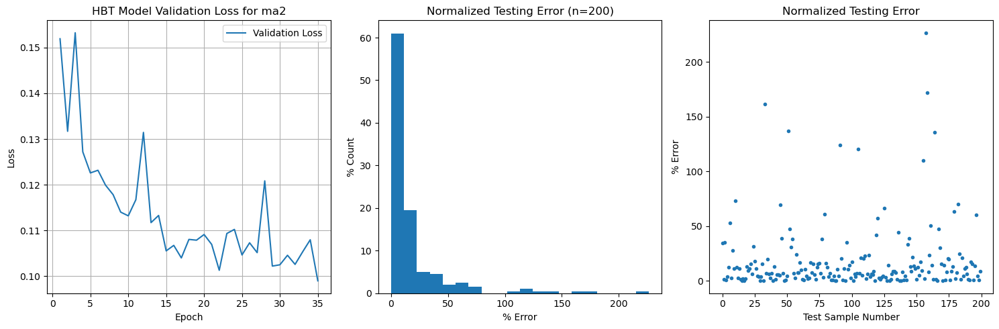

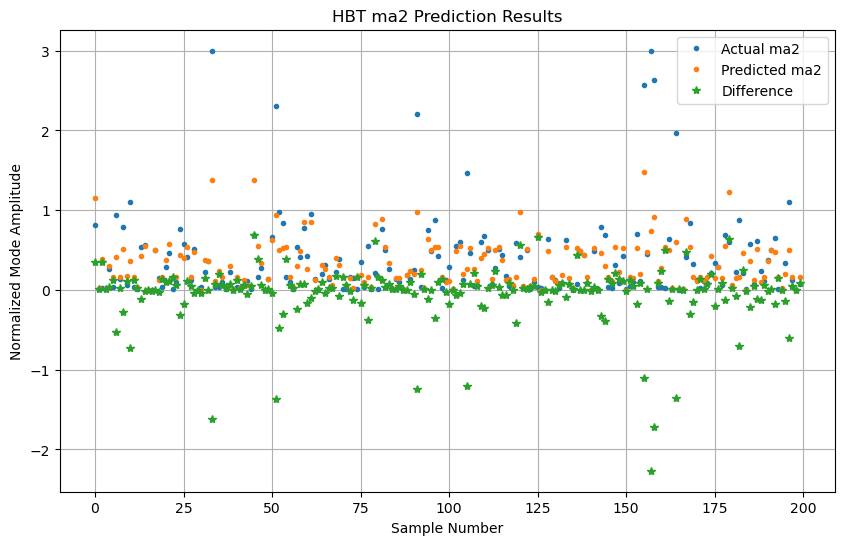

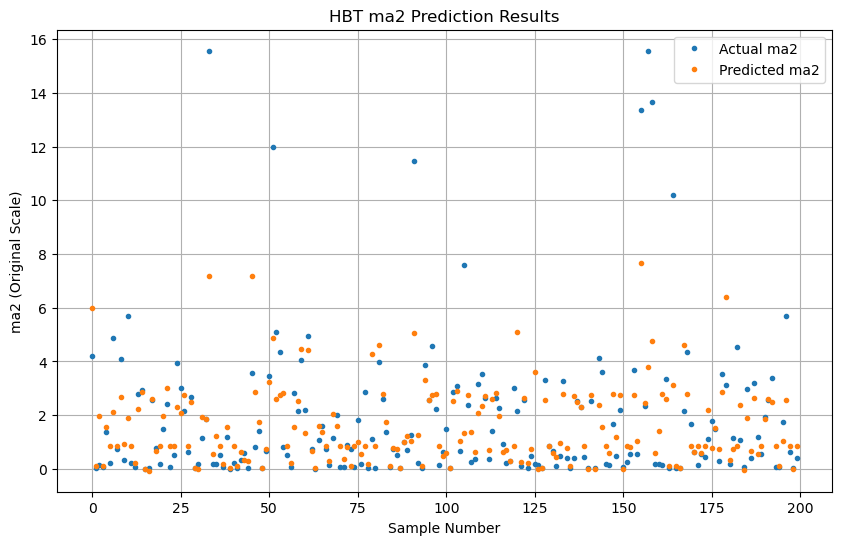

Maximum actual mode amplitude (normalized): 3.00
Maximum predicted mode amplitude (normalized): 1.48
Mean absolute percentage error: 18.27%


In [11]:
# Evaluate the model on test data
predictions = Model.predict(testing_inputs)

# Calculate prediction errors
prediction_errors = np.abs(testing_labels - predictions[:, 0]) * 100

# Create visualization plots
fig, axes = plt.subplots(figsize=(15, 5), ncols=3, nrows=1)

# Plot 1: Training History
axes[0].plot(range(1, len(history.history['val_loss']) + 1), 
             history.history['val_loss'], 
             label='Validation Loss')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_title(f'HBT Model Validation Loss for {selected_data_type}')
axes[0].legend()
axes[0].grid(True)

# Plot 2: Error Distribution
weights = np.ones_like(prediction_errors) / len(prediction_errors) * 100
axes[1].hist(prediction_errors, 20, weights=weights)
axes[1].set_xlabel('% Error')
axes[1].set_ylabel('% Count')
axes[1].set_title('Normalized Testing Error (n=200)')

# Plot 3: Error by Sample
axes[2].plot(prediction_errors, '.')
axes[2].set_xlabel('Test Sample Number')
axes[2].set_ylabel('% Error')
axes[2].set_title('Normalized Testing Error')
plt.tight_layout()
plt.show()

# Plot 4: Actual vs Predicted Values
plt.figure(figsize=(10, 6))
plt.plot(testing_labels, '.', label=f'Actual {selected_data_type}')
plt.plot(predictions[:, 0], '.', label=f'Predicted {selected_data_type}')
plt.plot(-(testing_labels - predictions[:, 0]), '*', label='Difference')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'HBT {selected_data_type} Prediction Results')
plt.legend()
plt.grid(True)
plt.show()

# Plot original scale predictions
plt.figure(figsize=(10, 6))
plt.plot(testing_labels * ma_norm, '.', label=f'Actual {selected_data_type}')
plt.plot(predictions[:, 0] * ma_norm, '.', label=f'Predicted {selected_data_type}')
plt.xlabel('Sample Number')
plt.ylabel(f'{selected_data_type} (Original Scale)')
plt.title(f'HBT {selected_data_type} Prediction Results')
plt.legend()
plt.grid(True)
plt.show()

print(f"Maximum actual mode amplitude (normalized): {np.max(np.abs(testing_labels)):.2f}")
print(f"Maximum predicted mode amplitude (normalized): {np.max(np.abs(predictions[:, 0])):.2f}")
print(f"Mean absolute percentage error: {np.mean(prediction_errors):.2f}%")

5.191251621246337
Shot 119671: Camera frames=800, HBT frames=800, Time frames=800
Shape of reserved_shot_cut_2d: (800, 32, 32)
Shape of camera_data: (800, 32, 32)
Input data shape: (800, 32, 32, 1)
Model output shape: (None, 1)


Predictions shape: (800,)


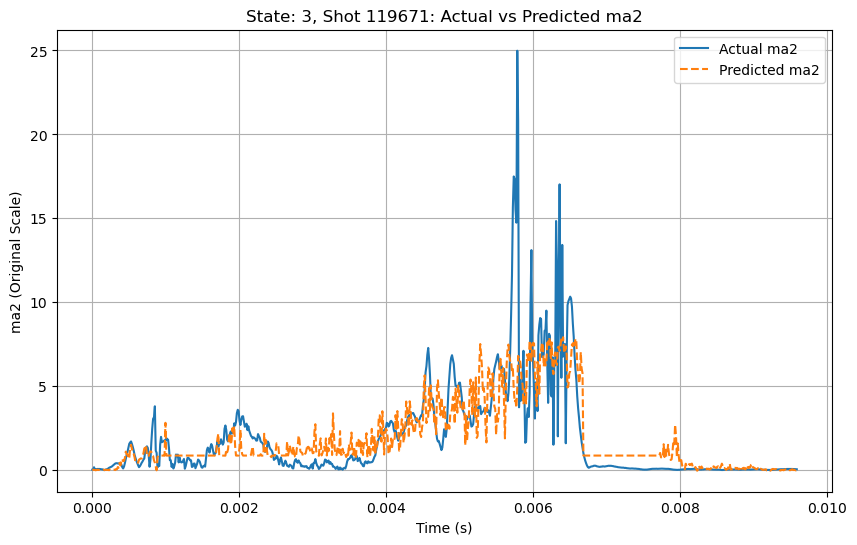

Shot 119671 - Mean absolute percentage error: 19.72%
Shot 119671 - Max actual ma2: 24.98
Shot 119671 - Max predicted ma2: 7.92


In [12]:
print(ma_norm)
def plot_RESERVED_SHOT_predictions(shot, shot_list, cut_training_data_2d, reserved_shot_cut_2d, hbt_dataType, hbt_time_data, model, ma_norm):
    """Plot actual vs predicted Mode 2 amplitude for the reserved shot."""
    if reserved_shot_cut_2d is None:
        print(f"No data available for reserved shot {shot}. No plot generated.")
        return
    
    shot_idx = shot_list.index(shot)
    camera_data = reserved_shot_cut_2d
    hbt_data = hbt_dataType[shot_idx][:, 0]
    time_data = hbt_time_data[shot_idx]

    print(f"Shot {shot}: Camera frames={len(camera_data)}, HBT frames={len(hbt_data)}, Time frames={len(time_data)}")
    print(f"Shape of reserved_shot_cut_2d: {reserved_shot_cut_2d.shape}")
    print(f"Shape of camera_data: {np.array(camera_data).shape}")

    if len(camera_data) == 0:
        print(f"No camera data for shot {shot}. No plot generated.")
        return
    
    if len(camera_data) != len(hbt_data):
        print(f"Warning: Camera data ({len(camera_data)} frames) does not match HBT data ({len(hbt_data)} frames)")

    input_data = np.array(camera_data).reshape(-1, 32, 32, 1)
    print(f"Input data shape: {input_data.shape}")
    print(f"Model output shape: {model.output_shape}")

    predictions = []
    batch_size = 100
    for i in range(0, len(input_data), batch_size):
        batch = input_data[i:i+batch_size]
        batch_pred = model.predict(batch, verbose=0)[:, 0] * ma_norm
        predictions.extend(batch_pred)
    predictions = np.array(predictions)
    print(f"Predictions shape: {predictions.shape}")

    # Rest of the plotting code...
    
    # Plot actual vs predicted using time data
    plt.figure(figsize=(10, 6))
    plt.plot(time_data, hbt_data, label=f'Actual {selected_data_type}')
    plt.plot(time_data, predictions, '--', label=f'Predicted {selected_data_type}')
    plt.xlabel('Time (s)')  # Assuming time is in seconds; adjust if needed
    plt.ylabel(f'{selected_data_type} (Original Scale)')
    plt.title(f'State: {state}, Shot {shot}: Actual vs Predicted {selected_data_type}')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Print metrics
    prediction_errors = np.abs(hbt_data - predictions) / ma_norm * 100
    print(f"Shot {shot} - Mean absolute percentage error: {np.mean(prediction_errors):.2f}%")
    print(f"Shot {shot} - Max actual {selected_data_type}: {np.max(np.abs(hbt_data)):.2f}")
    print(f"Shot {shot} - Max predicted {selected_data_type}: {np.max(np.abs(predictions)):.2f}")

    return predictions

reserved_predictions = plot_RESERVED_SHOT_predictions(
    RESERVED_SHOT, shot_list, cut_training_data_2D, reserved_shot_cut_2d, hbt_dataType, hbt_time_data, william_model, ma_norm
)

In [13]:
# Save true ma2 data, predictions, and time data for reserved shot
time_data = hbt_time_data[shot_list.index(RESERVED_SHOT)]

print(f"Untrimmed: Saving results for state {state}, shot {RESERVED_SHOT}")
print(f"True data defined: {'hbt_dataType' in locals()}, {'shot_list' in locals()}, {'RESERVED_SHOT' in locals()}")
print(f"Predictions defined: {'predictions' in locals()}, shape: {reserved_predictions.shape if 'predictions' in locals() else 'N/A'}")
print(f"Time data defined: {'hbt_time_data' in locals()}, shape: {hbt_time_data[shot_list.index(RESERVED_SHOT)].shape if 'hbt_time_data' in locals() else 'N/A'}")
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_true.npy', hbt_dataType[shot_list.index(RESERVED_SHOT)][:, 0])
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_pred.npy', reserved_predictions)
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_time.npy', time_data)
print("Done")

Untrimmed: Saving results for state 3, shot 119671
True data defined: True, True, True
Predictions defined: True, shape: (800,)
Time data defined: True, shape: (800,)
Done
